### K-means clustering



- todo: 
    - check in which temperature region the fit should be applied (at the moment, all above 0.8°C). Are four clusters ok? 
    - update the cluster names and colors! 
    - make the labels more intuitive and understandable
    - maybe add in the third y-axis the delta T at which < 20% of volume is left  

In [1]:
import xarray as xr
import numpy as np
import pandas as pd
import scipy
import os
import glob
import matplotlib.pyplot as plt
from datetime import date
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns

from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
# for plots withinplots 
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

from sklearn.cluster import KMeans
glob_temp = np.arange(-0.2,6.8,0.1)

In [2]:
num_dict = {0:'(a)', 1:'(b)', 2:'(c)', 3:'(d)', 4: '(e)',
            5:'(f)', 6:'(g)', 7:'(h)', 8:'(i)', 9:'(j)',
            10:'(k)', 11:'(l)', 12:'(m)'} 


In [3]:
#palette_cb = sns.color_palette(['#785EF0', '#DC267F', '#FE6100', '#FFB000', '#648FFF'])
cols = list(sns.color_palette('colorblind'))
palette_cb = sns.color_palette([cols[2],cols[4],cols[7],cols[5]])

In [4]:
# add = ''
add= '_temp_above_0_8'

#pd_exp_decay_fits_adv = pd.read_csv(f'fitted_glacier_response_to_global_temp_ch_complex_20yr_avg_period{add}.csv', index_col=0)
pd_exp_decay_fits_simple = pd.read_csv(f'fitted_glacier_response_to_global_temp_ch_simple_20yr_avg_period{add}_current12deg.csv', index_col=0)

In [5]:
sns.__version__

'0.12.2'

In [6]:
_resp_time = pd.read_csv('resp_time_X%_threshold25%_for_deltaT_rgi_reg_roll_volume_20yravg.csv', index_col=[0])

In [7]:
condi_median = _resp_time.groupby(['rgi_reg','temp_ch_ipcc']).count()['resp_time_-50%'] >=4## we need at least four models to do the median ... 

In [8]:
df_resp_time_deltaT = _resp_time.groupby(['rgi_reg','temp_ch_ipcc']).median().loc[condi_median][['resp_time_-50%','resp_time_-80%','resp_time_-90%']].reset_index()
#df_resp_time_deltaT_80perc = _resp_time.groupby(['rgi_reg','temp_ch_ipcc']).median().loc[condi_median,].reset_index()
#df_resp_time_deltaT_90perc = _resp_time.groupby(['rgi_reg','temp_ch_ipcc']).median().loc[condi_median,].reset_index()

# this is the old version
# not sure from where it comes from
#plt.plot(df_resp_time_deltaT_old['resp_time_-50%'].dropna(), df_resp_time_deltaT['resp_time_-50%'])
#df_resp_time_deltaT_old = pd.read_csv('median_resp_time_-50%_threshold25%_for_deltaT_rgi_reg.csv', index_col=0)

In [9]:
df_resp_time_deltaT_sel = df_resp_time_deltaT#.loc[df_resp_time_deltaT.temp_ch_ipcc>=1.5]
print(np.median(df_resp_time_deltaT_sel['resp_time_-80%']/df_resp_time_deltaT_sel['resp_time_-50%']))
print(np.median(df_resp_time_deltaT_sel['resp_time_-90%']/df_resp_time_deltaT_sel['resp_time_-50%']))

2.2285714285714286
3.3


<AxesSubplot:xlabel='resp_time_-50%', ylabel='resp_time_-80%'>

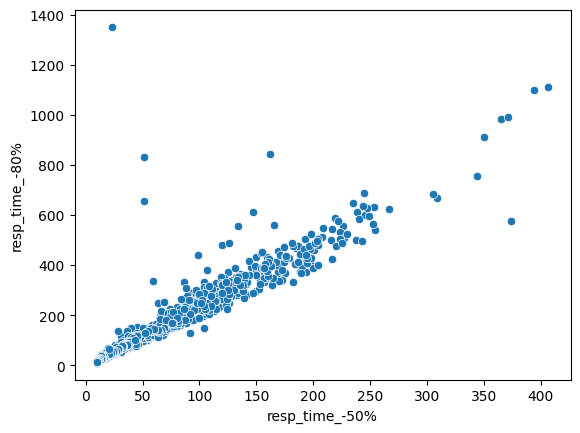

In [10]:
sns.scatterplot(data=df_resp_time_deltaT, x='resp_time_-50%', y='resp_time_-80%')

--> relatively linear relationship between the two aspects

<AxesSubplot:xlabel='resp_time_-50%', ylabel='resp_time_-90%'>

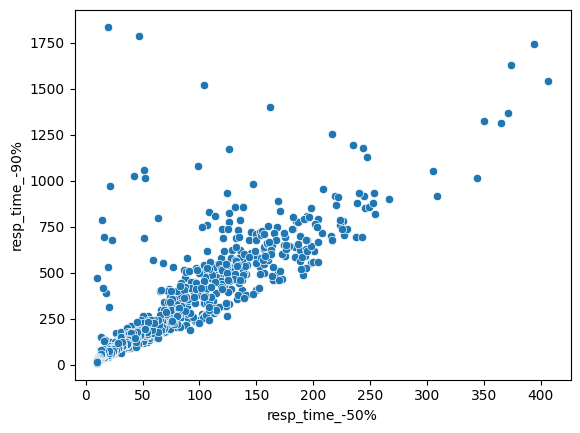

In [11]:
sns.scatterplot(data=df_resp_time_deltaT, x='resp_time_-50%', y='resp_time_-90%')

In [12]:
pd_clim_past = pd.read_csv('../data/temp_prcp_past_gswp3-w5e5_glacier_regionally.csv', index_col=0)

In [13]:
pd_global_temp_past = pd_clim_past.loc[pd_clim_past.variable == 'temperature']
#pd_global_temp_past = pd.read_csv('../data/temp_ch_past_gswp3-w5e5_glacier_regionally.csv', index_col=0)


In [14]:
from oggm import utils
import oggm
df_rgi6g = pd.read_hdf(utils.file_downloader('https://cluster.klima.uni-bremen.de/~oggm/rgi/rgi62_stats.h5'))
df_rgi6g = df_rgi6g.loc[df_rgi6g.Connect != 2]

df_itmix = pd.read_hdf(oggm.utils.get_demo_file('rgi62_itmix_df.h5'))
rgidf_dict = {}
rgidf_vol = {}
rgidf_vol_all = 0
slope_avg_d = {}
slope_avg_d_area_weighted = {}
lat_d_area_weighted={}
rgi_regs = list(df_rgi6g['O1Region'].unique())
elev_diff_d_area_weighted={}
marine_term_ratio_d_100largest_glac = {}
geodetic_obs_area_weighted_d={}
mean_vol_10_largest_glac = {}
ice_cap_ratio_d_100largest_glac = {}

max_elev_d_area_weighted = {}
mean_area_10_largest_glac =  {}
mean_len_10_largest_glac =  {}

min_elev_d_area_weighted = {}
for rgi_reg in rgi_regs:
    rgidf = df_rgi6g.loc[df_rgi6g.O1Region == rgi_reg]
    # Greenland periphery : all glaciers with connectivity level 0 and 1 should be included, level 2 glaciers should be excluded (as was the case for GlacierMIP2)
    # total RGI area: 89,651km2
    if rgi_reg == '05':
        rgidf = rgidf.loc[(rgidf['Connect'] == 0) | (rgidf['Connect'] ==1)]
    rgidf_dict[rgi_reg] = rgidf
    
    rgidf_vol[rgi_reg] = df_itmix.loc[rgidf_dict[rgi_reg].index]['vol_itmix_m3'].sum()
    rgidf_vol_all += df_itmix.loc[rgidf_dict[rgi_reg].index]['vol_itmix_m3'].sum()
    slope_avg = np.average(rgidf['Slope'], weights=df_itmix.loc[rgidf_dict[rgi_reg].index]['vol_itmix_m3'].values)
    slope_avg_d[rgi_reg] = slope_avg
    slope_avg_d_area_weighted[rgi_reg] = np.average(rgidf['Slope'], weights=rgidf.Area)
    lat_d_area_weighted[rgi_reg] = np.average(rgidf.CenLat, weights=rgidf.Area)
    elev_diff_d_area_weighted[rgi_reg] = np.average(rgidf.Zmax - rgidf.Zmin, weights=rgidf.Area)
    # new stuff
    max_elev_d_area_weighted[rgi_reg] = np.average(rgidf.Zmax, weights=rgidf.Area)  # Regine's idea 
    min_elev_d_area_weighted[rgi_reg] = np.average(rgidf.Zmin, weights=rgidf.Area)  

    # ratio of tidewater glaciers in 30 largest glaciers of region 
    counti = rgidf.sort_values(by='Area')[-100:].groupby('IsTidewater').count()['TermType']
    if True not in counti.index:
        marine_term_ratio_d_100largest_glac[rgi_reg] = 0
    else:
        marine_term_ratio_d_100largest_glac[rgi_reg] = counti[True]/100
    
    mean_vol_10_largest_glac[rgi_reg] = df_itmix.loc[rgidf_dict[rgi_reg].index]['vol_itmix_m3'].sort_values().iloc[-10:].mean()/1e9 #km3
    mean_area_10_largest_glac[rgi_reg] = rgidf.Area.sort_values().iloc[-10:].mean() #km2
    mean_len_10_largest_glac[rgi_reg] = rgidf.Lmax.sort_values().iloc[-10:].mean()/1e3 #km

    #geodetic MB data
    geod = utils.get_geodetic_mb_dataframe().loc[utils.get_geodetic_mb_dataframe().period=='2000-01-01_2020-01-01']
    geod_avg = np.average(geod.loc[rgidf_dict[rgi_reg].index]['dmdtda'], weights = geod.loc[rgidf_dict[rgi_reg].index]['area'])
    geodetic_obs_area_weighted_d[rgi_reg] = geod_avg
    
    # ice cap count
    counti_ice_cap = rgidf.sort_values(by='Area')[-100:].groupby('GlacierType').count()['Name']
    if 'Ice cap' not in counti_ice_cap:
        ice_cap_ratio_d_100largest_glac[rgi_reg] = 0
    else:
        ice_cap_ratio_d_100largest_glac[rgi_reg] = counti_ice_cap['Ice cap']/100
pd_rel_vol = (100*pd.DataFrame(index=['vol_relperc_itmix'],data=rgidf_vol)/rgidf_vol_all).T
np.testing.assert_allclose(pd_rel_vol.sum(), 100)

# k-means clustering with just one time dimension (i.e. year= 5000)


In [15]:
#def exponential_decay_complex(x, a, b,c,d):
#    exp_values_b = -b * x
#    exp_values_d = -d * x**2
#    return a * np.exp(exp_values_b) + c * np.exp(exp_values_d)#**c 

In [16]:
current_deltaT=1.2 # =0

In [17]:
def exponential_decay(x, a, b):
    exp_values_b = -b *(x-current_deltaT)
    return a * np.exp(exp_values_b) #+ c * np.exp(exp_values_d)#**c 

In [18]:
pd_exp_decay_fits_simple_5000 = pd_exp_decay_fits_simple.loc[pd_exp_decay_fits_simple.year ==5000]
pd_exp_decay_fits_simple_5000_values = pd.DataFrame(index = pd_exp_decay_fits_simple_5000.rgi_reg, columns= np.arange(-0.2,6.801,0.1))
j = 0
for a, b in zip(pd_exp_decay_fits_simple_5000['a_simple'].values, pd_exp_decay_fits_simple_5000['b_simple'].values):
    v_time_series = exponential_decay(np.arange(-0.2,6.801,0.1),a,b)
    pd_exp_decay_fits_simple_5000_values.iloc[j] =  v_time_series
    j+=1

## K-means clustering with normalised a and b as features

In [19]:
import sklearn

**simple fit**

In [20]:
pd_exp_decay_fits_simple_5000 = pd_exp_decay_fits_simple.loc[pd_exp_decay_fits_simple.year ==5000]

for var in ['a_simple', 'b_simple']:
    pd_exp_decay_fits_simple_5000[var+'_norm'] = sklearn.preprocessing.normalize([pd_exp_decay_fits_simple_5000[var].values]).squeeze()
regions = pd_exp_decay_fits_simple_5000.rgi_reg.values
data = pd_exp_decay_fits_simple_5000[['a_simple_norm', 'b_simple_norm']].values
# Perform K-meansa clustering
k = 4  # Number of clusters
kmeans = KMeans(n_clusters=k)
labels = ['test']
#while np.any(labels != np.array([2, 0, 1, 0, 2, 2, 3, 3, 1, 
#                                 1, 1, 1, 3, 0, 0, 2, 3, 0, 0, 0])):

while np.any(labels!=np.array([[0, 0, 3, 0, 1, 2, 2, 2, 3, 1, 1, 1, 2, 0, 0, 0, 2, 0, 0, 0]])):
    kmeans.fit(data)

    # Get the resulting centroids and labels
    centroids = kmeans.cluster_centers_
    labels = kmeans.labels_

# Print the resulting centroids and labels
print("Centroids:")
print(centroids)
print("Labels:")
print(labels)

pd_exp_decay_fits_simple_5000[f'kmeans_cluster_{k}'] = labels
pd_exp_decay_fits_simple_5000.to_csv(f'fitted_glacier_response_to_global_temp_ch_simple_20yr_avg_period{add}_current12deg_5000_w_kmeansclusters.csv')

/tmp/ipykernel_2409809/1881252428.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_exp_decay_fits_simple_5000[var+'_norm'] = sklearn.preprocessing.normalize([pd_exp_decay_fits_simple_5000[var].values]).squeeze()
/tmp/ipykernel_2409809/1881252428.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_exp_decay_fits_simple_5000[var+'_norm'] = sklearn.preprocessing.normalize([pd_exp_decay_fits_simple_5000[var].values]).squeeze()
/tmp/ipykernel_2409809/1881252428.py:14: FutureWarning: elementwise comparis

Centroids:
[[0.2744549  0.10336042]
 [0.12132753 0.26860366]
 [0.21030971 0.20678367]
 [0.10491837 0.43869601]]
Labels:
[0 0 3 0 1 2 2 2 3 1 1 1 2 0 0 0 2 0 0 0]


/tmp/ipykernel_2409809/1881252428.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_exp_decay_fits_simple_5000[f'kmeans_cluster_{k}'] = labels


In [21]:
# committed volume (at global temperature +2°C)
pd_exp_decay_fits_simple_5000[r'V$_{eq,rel,ΔT=+2°C}$ [in %]'] = exponential_decay(2,pd_exp_decay_fits_simple_5000['a_simple'].values,
                                                                                  pd_exp_decay_fits_simple_5000['b_simple'].values)
# temperature where the double of 'V$_{eq}$(+1.1°C)' is lost
# V = a*np.exp(-b*(deltaT-1.2)),  ΔT(V$_{eq,rel}) = \frac{-log($\frac{V_{eq,rel}}{2a}$)}{b} + 1.2
# ΔT = -log(0.5)/b + 1.2
pd_exp_decay_fits_simple_5000[r'ΔT(V$_{eq,rel}=\frac{a}{2}$) [in °C]'] = np.log(0.5)/-pd_exp_decay_fits_simple_5000['b_simple'] + current_deltaT

pd_exp_decay_fits_simple_5000['region'] = pd_exp_decay_fits_simple_5000['rgi_reg'] #let's not use the 'RGI'
pd_exp_decay_fits_simple_5000.loc[pd_exp_decay_fits_simple_5000['rgi_reg']=='All','region'] = 'Globally'

/tmp/ipykernel_2409809/3866588724.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_exp_decay_fits_simple_5000[r'V$_{eq,rel,ΔT=+2°C}$ [in %]'] = exponential_decay(2,pd_exp_decay_fits_simple_5000['a_simple'].values,
/tmp/ipykernel_2409809/3866588724.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_exp_decay_fits_simple_5000[r'ΔT(V$_{eq,rel}=\frac{a}{2}$) [in °C]'] = np.log(0.5)/-pd_exp_decay_fits_simple_5000['b_simple'] + current_deltaT
/tmp/ipykernel_2409809/3866588724.py:9: SettingWithCopyWarnin

In [22]:
pd_exp_decay_fits_simple_5000

,rgi_reg,year,a_simple,b_simple,a_simple_norm,b_simple_norm,kmeans_cluster_4,"V$_{eq,rel,ΔT=+2°C}$ [in %]","ΔT(V$_{eq,rel}=\frac{a}{2}$) [in °C]",region
60,All,5000,55.742286,0.488966,0.235331,0.107768,0,37.696458,2.617577,Globally
61,01,5000,63.744783,0.361593,0.269115,0.079695,0,47.732526,3.116927,01
62,02,5000,27.361966,1.787244,0.115516,0.393909,3,6.549303,1.587830,02
63,03,5000,70.975479,0.401856,0.299642,0.088569,0,51.462321,2.924866,03
64,04,5000,14.047771,1.107736,0.059306,0.244145,1,5.790826,1.825733,04
65,05,5000,43.535577,0.677059,0.183797,0.149224,2,25.328531,2.223762,05
66,06,5000,45.595772,1.006360,0.192495,0.221802,2,20.383524,1.888767,06
67,07,5000,45.881332,1.029715,0.193700,0.226950,2,20.131505,1.873144,07
68,08,5000,22.341606,2.193656,0.094321,0.483483,3,3.863314,1.515978,08
69,09,5000,33.477510,1.401671,0.141334,0.308929,1,10.908440,1.694515,09


In [23]:
df = pd_exp_decay_fits_simple_5000.copy()

In [24]:
region_l = []
for r in df_resp_time_deltaT.rgi_reg:
    region_l.append(r[3:])
df_resp_time_deltaT['region'] = region_l

In [25]:
varis = ['temp_ch_ipcc', 'resp_time_-50%', 'resp_time_-80%','resp_time_-90%','region',
       'kmeans_cluster_4']

In [26]:
# get response time
rgi_reg_clus = df.iloc[1:][['region', 'kmeans_cluster_4']]
rgi_reg_clus.index = rgi_reg_clus.region
df_resp_time_deltaT.index = df_resp_time_deltaT.region
for r in rgi_reg_clus.index:
    df_resp_time_deltaT.loc[r,'kmeans_cluster_4'] = rgi_reg_clus.loc[r,'kmeans_cluster_4']
    
resp_time_deltaT_1_5deg = df_resp_time_deltaT.where((df_resp_time_deltaT.temp_ch_ipcc>1.3) & (df_resp_time_deltaT.temp_ch_ipcc<1.7)).dropna()
resp_time_deltaT_3_0deg = df_resp_time_deltaT.where((df_resp_time_deltaT.temp_ch_ipcc>2.8) & (df_resp_time_deltaT.temp_ch_ipcc<3.2)).dropna()
#resp_time_deltaT_3_0deg.index = resp_time_deltaT_3_0deg.temp_ch_ipcc
print(len(resp_time_deltaT_1_5deg.temp_ch_ipcc.unique()), len(resp_time_deltaT_3_0deg.temp_ch_ipcc.unique()))

resp_time_deltaT_1_5deg = df_resp_time_deltaT.where((df_resp_time_deltaT.temp_ch_ipcc>1.3) & (df_resp_time_deltaT.temp_ch_ipcc<1.7)).dropna().reset_index(drop=True).groupby('region')[varis].median()
resp_time_deltaT_3_0deg = df_resp_time_deltaT.where((df_resp_time_deltaT.temp_ch_ipcc>2.8) & (df_resp_time_deltaT.temp_ch_ipcc<3.2)).dropna().reset_index(drop=True).groupby('region')[varis].median()
#resp_time_deltaT_3_0deg.index = resp_time_deltaT_3_0deg.temp_ch_ipcc
resp_time_deltaT_sel = resp_time_deltaT_1_5deg.copy()[['temp_ch_ipcc', 'resp_time_-50%','kmeans_cluster_4']]
resp_time_deltaT_sel = resp_time_deltaT_sel.rename(columns={'resp_time_-50%':'resp_time_-50%_1_5_deg'})
resp_time_deltaT_sel['resp_time_-50%_3_0_deg'] = resp_time_deltaT_3_0deg.loc[resp_time_deltaT_sel.index.values]['resp_time_-50%']

resp_time_deltaT_sel['resp_time_-80%_1_5_deg'] = resp_time_deltaT_1_5deg.loc[resp_time_deltaT_sel.index.values]['resp_time_-80%']
resp_time_deltaT_sel['resp_time_-90%_1_5_deg'] = resp_time_deltaT_1_5deg.loc[resp_time_deltaT_sel.index.values]['resp_time_-90%']
resp_time_deltaT_sel['resp_time_-80%_3_0_deg'] = resp_time_deltaT_3_0deg.loc[resp_time_deltaT_sel.index.values]['resp_time_-80%']
resp_time_deltaT_sel['resp_time_-90%_3_0_deg'] = resp_time_deltaT_3_0deg.loc[resp_time_deltaT_sel.index.values]['resp_time_-90%']
#sns.scatterplot(data = resp_time_deltaT_sel, x= 'resp_time_-50%_1_5_deg', y='resp_time_-50%_3_0_deg', marker='o',s=200, hue='kmeans_cluster_4')

17 5


In [27]:
resp_time_deltaT_sel.columns

Index(['temp_ch_ipcc', 'resp_time_-50%_1_5_deg', 'kmeans_cluster_4',
       'resp_time_-50%_3_0_deg', 'resp_time_-80%_1_5_deg',
       'resp_time_-90%_1_5_deg', 'resp_time_-80%_3_0_deg',
       'resp_time_-90%_3_0_deg'],
      dtype='object')

/tmp/ipykernel_2409809/3868313669.py:2: UserWarning: The palette list has more values (10) than needed (4), which may not be intended.
  sns.scatterplot(data = resp_time_deltaT_sel, x= 'resp_time_-50%_1_5_deg', y='ratio_resp_time_1_5_vs_3_0', marker='o',s=200, hue='kmeans_cluster_4',


<AxesSubplot:xlabel='resp_time_-50%_1_5_deg', ylabel='ratio_resp_time_1_5_vs_3_0'>

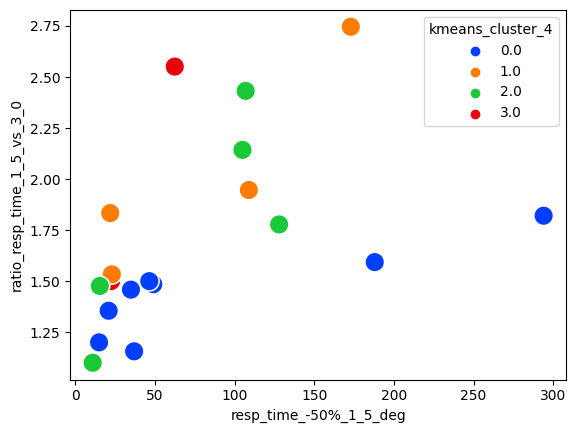

In [28]:
resp_time_deltaT_sel['ratio_resp_time_1_5_vs_3_0'] = resp_time_deltaT_sel['resp_time_-50%_1_5_deg'] / resp_time_deltaT_sel['resp_time_-50%_3_0_deg']
sns.scatterplot(data = resp_time_deltaT_sel, x= 'resp_time_-50%_1_5_deg', y='ratio_resp_time_1_5_vs_3_0', marker='o',s=200, hue='kmeans_cluster_4',
                palette=sns.color_palette('bright'))

In [29]:
df.index = df.region
cols = ['resp_time_-50%_1_5_deg','resp_time_-50%_3_0_deg','resp_time_-50%_3_0_deg', 'resp_time_-80%_1_5_deg',
       'resp_time_-90%_1_5_deg', 'resp_time_-80%_3_0_deg',
       'resp_time_-90%_3_0_deg']
for c in cols:
    df.loc[resp_time_deltaT_sel.index.values, c] = resp_time_deltaT_sel[c].values

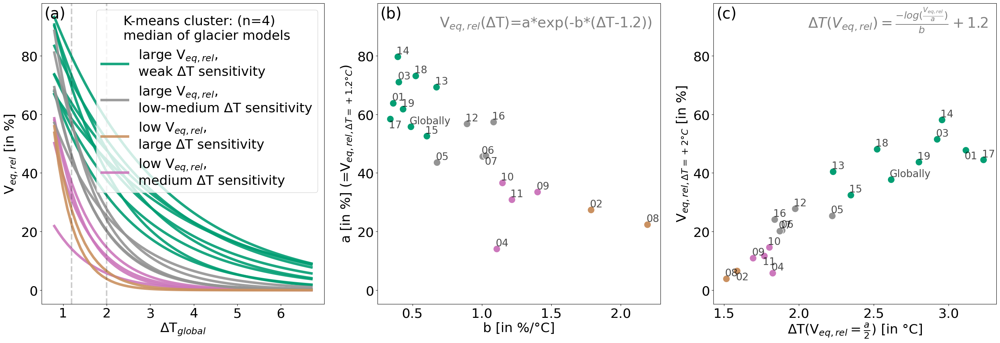

In [30]:
# from https://stackoverflow.com/questions/46027653/adding-labels-in-x-y-scatter-plot-with-seaborn
def plotlabel(xvar, yvar, label):
    ax.text(xvar-0.01, yvar+1, label, alpha=0.7, fontsize=20)
    
def plotlabel_b(xvar, yvar, label):
    ax.text(xvar-0.01, yvar-3, label, alpha=0.7, fontsize=20)
plt.rc('font', size=26)  

plt.figure(figsize=(28,10))

ax=plt.subplot(131)
for k in [0,1,2,3]:
    pd_sel = df.loc[df.kmeans_cluster_4 == k]
    for reg in pd_sel.region:
        pd_sel_reg = pd_sel.loc[pd_sel.region==reg]
        a,b = pd_sel_reg[['a_simple', 'b_simple']].values.squeeze()
        ax.plot(glob_temp[glob_temp>=0.8],
                exponential_decay(glob_temp[glob_temp>=0.8],a,b),
                label=reg,
                color=palette_cb[k],lw=5, alpha = 0.9)
handles, labels = ax.get_legend_handles_labels()
handles_l = [handles[0], handles[13],handles[18],handles[10]]
labels_long_cluster = [r'large V$_{eq,rel}$'+',\nweak ΔT sensitivity', 
                       r'large V$_{eq,rel}$'+',\nlow-medium ΔT sensitivity', 
                       r'low V$_{eq,rel}$'+',\nlarge ΔT sensitivity',
                       r'low V$_{eq,rel}$'+',\nmedium ΔT sensitivity']
ax.legend(handles_l,labels_long_cluster,
          title = 'K-means cluster: (n=4)\nmedian of glacier models')        

ax.set_ylabel(r'V$_{eq,rel}$ [in %]')
ax.set_xlabel(r'ΔT$_{global}$')

ylim0,ylim1 = ax.get_ylim()
#plt.axvline(0,ls='--', alpha = 0.2,lw=3, color='black')

plt.axvline(current_deltaT,ls='--', alpha = 0.2,lw=3, color='black')
plt.axvline(2,ls='--', alpha = 0.2,lw=3, color='black')

ax1=ax

plt.subplot(132)
ax = sns.scatterplot(data=df, y='a_simple', x='b_simple', hue='kmeans_cluster_4',
                     palette=palette_cb[:4], s=200)
df.drop(index=['17','07']).apply(lambda x: plotlabel(x['b_simple'],  x['a_simple'],
                                                  x['region']), axis=1)

df.loc[['17', '07']].apply(lambda x: plotlabel_b(x['b_simple'],  x['a_simple'],
                                                    x['region']), axis=1)

ax.text(0.97,0.92, r'V$_{eq,rel}$(ΔT)=a*exp(-b*(ΔT-1.2))', color='grey', fontsize=28, ha='right',transform=ax.transAxes)
ax.set_xlabel('b [in %/°C]')
ax.set_ylabel(r'a [in %] (=V$_{eq,rel,ΔT=+1.2°C}$)')
leg=plt.legend(title='K-means\ncluster:\n(n=4)\nmedian of glacier models',
               loc='lower right')
leg.remove()
ax.set_ylim(ylim0,ylim1)
#plt.subplot(122)
#ax=sns.scatterplot(data=pd_exp_decay_fits_simple_5000, x=r'V$_{eq,rel,ΔT=+1.2°C}$ [in %]', y=r'b_simple', hue='kmeans_cluster_4', palette=sns.color_palette('tab10'), s=200)
#ax.set_ylabel('b [in %/ΔT]')
#pd_exp_decay_fits_simple_5000.apply(lambda x: plotlabel(x[r'V$_{eq,rel,ΔT=+1.2°C}$ [in %]'],  x['b_simple'], x['region']), axis=1)
#plt.legend(title='K-means\ncluster:\n(n=4)', loc='upper right')

ax2=ax

plt.subplot(133)
ax=sns.scatterplot(data=df, y=r'V$_{eq,rel,ΔT=+2°C}$ [in %]',
                   x=r'ΔT(V$_{eq,rel}=\frac{a}{2}$) [in °C]',
                   hue='kmeans_cluster_4',
                   palette=palette_cb[:4], s=200)
df.drop(index=['02','11','01']).apply(lambda x: plotlabel(x[r'ΔT(V$_{eq,rel}=\frac{a}{2}$) [in °C]'],
                             x[r'V$_{eq,rel,ΔT=+2°C}$ [in %]'],  x['region']), axis=1)

df.loc[['02', '11', '01']].apply(lambda x: plotlabel_b(x[r'ΔT(V$_{eq,rel}=\frac{a}{2}$) [in °C]'],
                             x[r'V$_{eq,rel,ΔT=+2°C}$ [in %]'],  x['region']), axis=1)

ax.text(0.97,0.92, r'$ΔT(V_{eq,rel}) = \frac{-log(\frac{V_{eq,rel}}{a})}{b} +1.2$',
        transform=ax.transAxes, color='grey', ha='right',fontsize=28)

leg = plt.legend(title='K-means\ncluster:\n(n=4)', loc='upper left')
leg.remove()
ax.set_xlabel(r'ΔT(V$_{eq,rel}=\frac{a}{2}$) [in °C]')
ax3=ax

# add a,b,c
num_text_x = 0.01
for j,axi in enumerate([ax1,ax2,ax3]):
    num_text_y = 0.95
    axi.text(num_text_x, num_text_y,
             num_dict[j], fontsize=30, transform=axi.transAxes)
    axi.set_ylim(ax1.get_ylim())

#plt.suptitle('Clustered after normalised exponential fit parameters (a and b)')
plt.tight_layout()
plt.savefig(f'figures/3_k_means_clustering/kmeans_clustering_after_Veq_params_a_b{add}.png')

Caption: (a) Fitted medium equilibrium regional and global volume relative to the initial state (near 2000) for different levels of global warming ΔTglobal, relative to preindustrial levels. In (b) The applied function and the fitted parameters a and b are shown. a represents the committed equilibrium volume, relative to the initial state (assuming ΔTglobal=+1.2°C). b represents the exponential decay rate of decreasing equilibrium volume for increasing ΔTglobal. In (c), the equilibrium volume at ΔTglobal=+2°C is shown relative to the ΔTglobal where only half of the committed equilibrium volume will be left (eq. given in c). The regions have been clustered by using the normalised exponential fit parameters a and b. We chose four clusters, as a good compromise between variability and ... . Note, that we only fitted experiments with global temperature >= 0.8°C, as glacier model uncertainties are lower and as these experiments are more interesting for the near future. 

- 

### Analyse further the relationships ...

In [31]:
for period in ['2000-2019_vs_1901-1920', '1986-2005_vs_1901-1920', '1995-2014_vs_1901-1920']: 
    pd_global_temp_past_per =pd_global_temp_past.loc[pd_global_temp_past.period == period]
    pd_global_temp_past_per.index = pd_global_temp_past_per.rgi_reg
    df[f'temp_ch_avg_{period}'] = pd_global_temp_past_per.loc[df.rgi_reg,'average_change'].values

In [32]:
for period in ['2000-2019','1981-2000','1995-2014']:
    # average temperature 
    pd_global_temp_past_per = pd_clim_past.loc[(pd_clim_past.variable=='temperature') & (pd_clim_past.period==period)]
    pd_global_temp_past_per.index = pd_global_temp_past_per.rgi_reg
    df[f'temp_avg_{period}'] = pd_global_temp_past_per.loc[df.rgi_reg,'average'].values

    # average precipitation 
    pd_global_prcp_past_per = pd_clim_past.loc[(pd_clim_past.variable=='precipitation') & (pd_clim_past.period==period)]
    pd_global_prcp_past_per.index = pd_global_prcp_past_per.rgi_reg
    df[f'prcp_avg_{period}'] = pd_global_prcp_past_per.loc[df.rgi_reg,'average'].values
    
    # average continentality index 
    pd_global_temp_ci_past_per = pd_clim_past.loc[(pd_clim_past.variable=='temperature_continentality_index') & (pd_clim_past.period==period)]
    pd_global_temp_ci_past_per.index = pd_global_temp_ci_past_per.rgi_reg
    df[f'continentality_index_avg_{period}'] = pd_global_temp_ci_past_per.loc[df.rgi_reg,'average'].values

In [33]:
def get_glob_temp_exp(region='global'):
    pd_global_temp_exp_glac = pd.read_csv('../data/temp_ch_ipcc_isimip3b_glacier_regionally.csv', index_col = 0)
    _p = pd_global_temp_exp_glac.loc[pd_global_temp_exp_glac.region == region]
    #print(_p.groupby(['gcm','period_scenario']).mean('temp_ch_ipcc'))
    _p = _p.groupby(['gcm','period_scenario']).mean('temp_ch_ipcc')
    return _p

rgi_regs_global = ['All','01', '02', '03', '04', '05', '06', '07',
                   '08', '09', '10', '11', '12', '13', '14', '15',
                   '16', '17', '18', '19']
for j, rgi_reg in enumerate(rgi_regs_global):

    region = f'RGI{rgi_reg}_glacier'
    if rgi_reg == 'All':
        region = 'global_glacier'
    glob_temp_ch = get_glob_temp_exp(region='global')['temp_ch_ipcc'].values
    glob_temp_reg = get_glob_temp_exp(region=region)['temp_ch_ipcc'].values
    slope, intercept, rval, pval, stderr = scipy.stats.linregress(glob_temp_ch, glob_temp_reg)

    df.loc[df.rgi_reg==rgi_reg,'median_reg_vs_glob_ch'] =  np.median(glob_temp_reg / glob_temp_ch).round(1)
    df.loc[df.rgi_reg==rgi_reg,'median_reg_vs_glob_temp_ch_above_zero_eight_deg'] =  np.median(glob_temp_reg[glob_temp_reg>=0.8] / glob_temp_ch[glob_temp_reg>=0.8]).round(1)

    df.loc[df.rgi_reg==rgi_reg,'slope_fit_reg_vs_glob_ch'] =  slope.round(1)

In [34]:
for region in rgi_regs:
    df.loc[region,'slope_weighted_vol_avg'] = slope_avg_d[region]
    df.loc[region,'slope_weighted_area_avg'] = slope_avg_d_area_weighted[region]
    df.loc[region,'lat_absolute_weighted_area_avg'] = np.abs(lat_d_area_weighted[region])
    df.loc[region,'lat_weighted_area_avg'] = lat_d_area_weighted[region]
    
    df.loc[region,'marine_term_ratio_hundredlargest_glac'] = marine_term_ratio_d_100largest_glac[region]
    df.loc[region,'geodetic_obs_area_weighted'] =geodetic_obs_area_weighted_d[region]
    df.loc[region,'mean_vol_ten_largest_glac'] =mean_vol_10_largest_glac[region]
    df.loc[region,'elev_diff_area_weighted'] =elev_diff_d_area_weighted[region]
    df.loc[region,'ice_cap_ratio_hundredlargest_glac'] = ice_cap_ratio_d_100largest_glac[region]
    
    df.loc[region,'max_elev_area_weighted'] = max_elev_d_area_weighted[region]
    df.loc[region,'min_elev_area_weighted'] = min_elev_d_area_weighted[region]
    df.loc[region,'mean_area_ten_largest_glac'] =mean_area_10_largest_glac[region]
    df.loc[region,'mean_len_ten_largest_glac'] =mean_len_10_largest_glac[region]

-0.8 2.2102293198501752e-05
0.92 9.964349001965859e-09
-0.04 0.8616309442862986
0.17 0.48464091514806357
-0.28 0.22873997228541776
0.29 0.23530645207327433
-0.82 1.4412214899597954e-05
-0.76 0.00016060039079301725
0.58 0.009488680861080638
0.38 0.1058618224722811
0.0 0.9904657316067149
-0.34 0.14927810587261944
0.72 0.0005488318016441969
-0.85 3.997239911243098e-06


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and pos

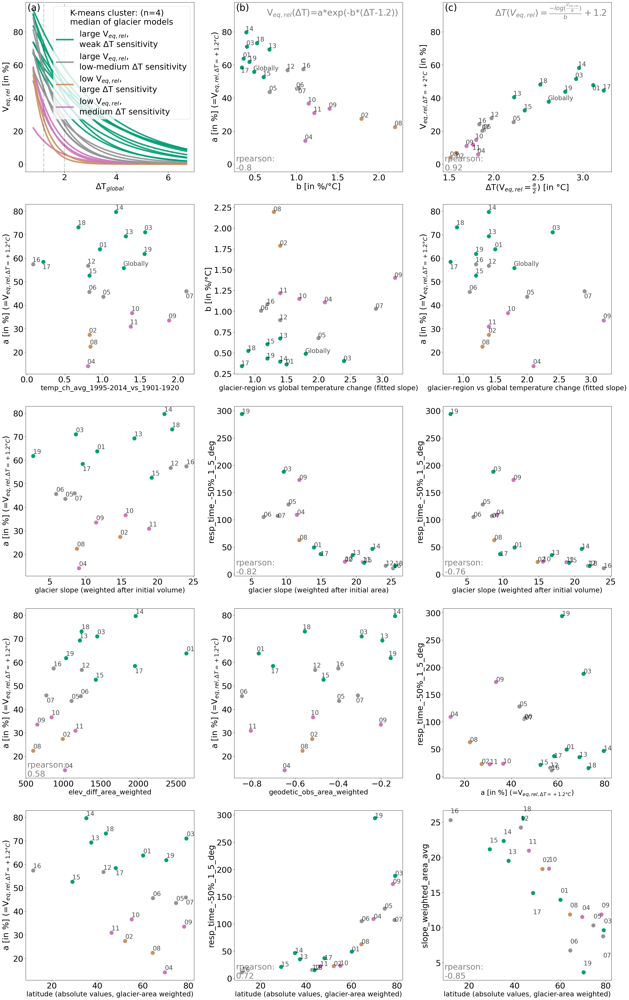

In [35]:
from scipy.stats import pearsonr
# from https://stackoverflow.com/questions/46027653/adding-labels-in-x-y-scatter-plot-with-seaborn
def plotlabel(xvar, yvar, label, ax=None):
    ax.text(xvar-0.01, yvar+1, label, alpha=0.7, fontsize=20)
def plotlabel_b(xvar, yvar, label, ax=None):
    ax.text(xvar-0.01, yvar-3, label, alpha=0.7, fontsize=20)
def plotlabel_c(xvar, yvar, label, ax=None):
    ax.text(xvar-0.01, yvar+0.01, label, alpha=0.7, fontsize=20)
        
def scatter_c(yy='resp_time_-50%_1_5_deg', xx=f'slope_weighted_vol_avg',
              xlabel=f'glacier slope (weighted after initial volume)',ylabel=None, _plotlabel=plotlabel, _plotlabel_b=plotlabel_b):
    ax = sns.scatterplot(data=df, y=yy, x=xx, hue='kmeans_cluster_4',
                     palette=palette_cb[:4], s=200)
    corrcoef,pval = pearsonr(df[[xx,yy]].dropna()[xx].values, df[[xx,yy]].dropna()[yy].values)
    corrcoef = corrcoef.round(2)
    if pval <0.05:
        ax.text(0.01,0.01, f'rpearson:\n{corrcoef}', transform=ax.transAxes, color='grey')
    print(corrcoef, pval)
    
    df.drop(index=['17','07']).apply(lambda x: _plotlabel(x[xx],x[yy], 
                                                      x['region'], ax=ax), axis=1)

    df.loc[['17', '07']].apply(lambda x: _plotlabel_b(x[xx],x[yy],
                                                        x['region'], ax=ax), axis=1)
    if ylabel is None:
        ylabel = yy

    ax.set_xlabel(xlabel, fontsize=22)
    ax.set_ylabel(ylabel)

    leg=plt.legend(title='K-means\ncluster:\n(n=4)\nmedian of glacier models',
                   loc='lower right')
    leg.remove() 
    
plt.rc('font', size=26)  

plt.figure(figsize=(28,45))

ax=plt.subplot(531)
for k in [0,1,2,3]:
    pd_sel = df.loc[df.kmeans_cluster_4 == k]
    for reg in pd_sel.region:
        pd_sel_reg = pd_sel.loc[pd_sel.region==reg]
        a,b = pd_sel_reg[['a_simple', 'b_simple']].values.squeeze()
        ax.plot(glob_temp[glob_temp>=0.8],
                exponential_decay(glob_temp[glob_temp>=0.8],a,b),
                label=reg,
                color=palette_cb[k],lw=5, alpha = 0.9)
handles, labels = ax.get_legend_handles_labels()
handles_l = [handles[0], handles[13],handles[18],handles[10]]
labels_long_cluster = [r'large V$_{eq,rel}$'+',\nweak ΔT sensitivity', 
                       r'large V$_{eq,rel}$'+',\nlow-medium ΔT sensitivity', 
                       r'low V$_{eq,rel}$'+',\nlarge ΔT sensitivity',
                       r'low V$_{eq,rel}$'+',\nmedium ΔT sensitivity']
ax.legend(handles_l,labels_long_cluster,
          title = 'K-means cluster: (n=4)\nmedian of glacier models')        

ax.set_ylabel(r'V$_{eq,rel}$ [in %]')
ax.set_xlabel(r'ΔT$_{global}$')

ylim0,ylim1 = ax.get_ylim()
#plt.axvline(0,ls='--', alpha = 0.2,lw=3, color='black')

plt.axvline(current_deltaT,ls='--', alpha = 0.2,lw=3, color='black')
plt.axvline(2,ls='--', alpha = 0.2,lw=3, color='black')

ax1=ax

plt.subplot(532)
ax = sns.scatterplot(data=df, y='a_simple', x='b_simple', hue='kmeans_cluster_4',
                     palette=palette_cb[:4], s=200)
df.drop(index=['17','07']).apply(lambda x: plotlabel(x['b_simple'],  x['a_simple'],
                                                  x['region'], ax=ax), axis=1)

df.loc[['17', '07']].apply(lambda x: plotlabel_b(x['b_simple'],  x['a_simple'],
                                                    x['region'], ax=ax), axis=1)

ax.text(0.97,0.92, r'V$_{eq,rel}$(ΔT)=a*exp(-b*(ΔT-1.2))', color='grey', fontsize=28, ha='right',transform=ax.transAxes)
ax.set_xlabel('b [in %/°C]')
ax.set_ylabel(r'a [in %] (=V$_{eq,rel,ΔT=+1.2°C}$)')
leg=plt.legend(title='K-means\ncluster:\n(n=4)\nmedian of glacier models',
               loc='lower right')
leg.remove()
ax.set_ylim(ylim0,ylim1)

xx = 'b_simple'
yy = 'a_simple'
corrcoef,pval = pearsonr(df[[xx,yy]].dropna()[xx].values, df[[xx,yy]].dropna()[yy].values)
corrcoef = corrcoef.round(2)
if pval <0.05:
    ax.text(0.01,0.01, f'rpearson:\n{corrcoef}', transform=ax.transAxes, color='grey')
print(corrcoef, pval)
#plt.subplot(122)
#ax=sns.scatterplot(data=pd_exp_decay_fits_simple_5000, x=r'V$_{eq,rel,ΔT=+1.2°C}$ [in %]', y=r'b_simple', hue='kmeans_cluster_4', palette=sns.color_palette('tab10'), s=200)
#ax.set_ylabel('b [in %/ΔT]')
#pd_exp_decay_fits_simple_5000.apply(lambda x: plotlabel(x[r'V$_{eq,rel,ΔT=+1.2°C}$ [in %]'],  x['b_simple'], x['region']), axis=1)
#plt.legend(title='K-means\ncluster:\n(n=4)', loc='upper right')

ax2=ax

plt.subplot(533)
ax=sns.scatterplot(data=df, y=r'V$_{eq,rel,ΔT=+2°C}$ [in %]',
                   x=r'ΔT(V$_{eq,rel}=\frac{a}{2}$) [in °C]',
                   hue='kmeans_cluster_4',
                   palette=palette_cb[:4], s=200)
df.drop(index=['02','11','01']).apply(lambda x: plotlabel(x[r'ΔT(V$_{eq,rel}=\frac{a}{2}$) [in °C]'],
                             x[r'V$_{eq,rel,ΔT=+2°C}$ [in %]'],  x['region'], ax=ax), axis=1)

df.loc[['02', '11', '01']].apply(lambda x: plotlabel_b(x[r'ΔT(V$_{eq,rel}=\frac{a}{2}$) [in °C]'],
                             x[r'V$_{eq,rel,ΔT=+2°C}$ [in %]'],  x['region'], ax=ax), axis=1)

ax.text(0.97,0.92, r'$ΔT(V_{eq,rel}) = \frac{-log(\frac{V_{eq,rel}}{a})}{b} +1.2$',
        transform=ax.transAxes, color='grey', ha='right',fontsize=28)

leg = plt.legend(title='K-means\ncluster:\n(n=4)', loc='upper left')
leg.remove()
ax.set_xlabel(r'ΔT(V$_{eq,rel}=\frac{a}{2}$) [in °C]')


xx = r'ΔT(V$_{eq,rel}=\frac{a}{2}$) [in °C]'
yy = r'V$_{eq,rel,ΔT=+2°C}$ [in %]'
corrcoef,pval = pearsonr(df[[xx,yy]].dropna()[xx].values, df[[xx,yy]].dropna()[yy].values)
corrcoef = corrcoef.round(2)
if pval <0.05:
    ax.text(0.01,0.01, f'rpearson:\n{corrcoef}', transform=ax.transAxes, color='grey')
print(corrcoef, pval)


ax3=ax

# add a,b,c
num_text_x = 0.01
for j,axi in enumerate([ax1,ax2,ax3]):
    num_text_y = 0.95
    axi.text(num_text_x, num_text_y,
             num_dict[j], fontsize=30, transform=axi.transAxes)
    axi.set_ylim(ax1.get_ylim())

period= '1995-2014_vs_1901-1920'
plt.subplot(534)
scatter_c(yy='a_simple', xx=f'temp_ch_avg_{period}',
              xlabel=f'temp_ch_avg_{period}',
          ylabel=r'a [in %] (=V$_{eq,rel,ΔT=+1.2°C}$)',
          _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)

plt.subplot(535)
scatter_c(yy='b_simple', xx=f'slope_fit_reg_vs_glob_ch',
              xlabel=f'glacier-region vs global temperature change (fitted slope)',
          ylabel='b [in %/°C]',
          _plotlabel=plotlabel_c, _plotlabel_b=plotlabel_c)

plt.subplot(536)

scatter_c(yy='a_simple', xx=f'slope_fit_reg_vs_glob_ch',
              xlabel=f'glacier-region vs global temperature change (fitted slope)',
          ylabel=r'a [in %] (=V$_{eq,rel,ΔT=+1.2°C}$)',
          _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)

plt.subplot(537)


scatter_c(yy='a_simple', xx=f'slope_weighted_vol_avg',
              xlabel=f'glacier slope (weighted after initial volume)',ylabel=r'a [in %] (=V$_{eq,rel,ΔT=+1.2°C}$)',
          _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)


plt.subplot(538)

scatter_c(yy='resp_time_-50%_1_5_deg', xx=f'slope_weighted_area_avg',
              xlabel=f'glacier slope (weighted after initial area)',ylabel=None, _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)

plt.subplot(539)
scatter_c(yy='resp_time_-50%_1_5_deg', xx=f'slope_weighted_vol_avg',
              xlabel=f'glacier slope (weighted after initial volume)',ylabel=None, _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)

plt.subplot(5,3,10)
scatter_c(yy='a_simple', xx=f'elev_diff_area_weighted',
              xlabel=f'elev_diff_area_weighted',
          ylabel=r'a [in %] (=V$_{eq,rel,ΔT=+1.2°C}$)',
          _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)

plt.subplot(5,3,11)
scatter_c(yy='a_simple', xx=f'geodetic_obs_area_weighted',
              xlabel=f'geodetic_obs_area_weighted',
          ylabel=r'a [in %] (=V$_{eq,rel,ΔT=+1.2°C}$)', _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)

plt.subplot(5,3,12)
scatter_c(yy='resp_time_-50%_1_5_deg', xx=f'a_simple',
              xlabel=r'a [in %] (=V$_{eq,rel,ΔT=+1.2°C}$)',
          ylabel=None, _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)

plt.subplot(5,3,13)
scatter_c(yy='a_simple', xx=f'lat_absolute_weighted_area_avg',
              xlabel=f'latitude (absolute values, glacier-area weighted)',
          ylabel=r'a [in %] (=V$_{eq,rel,ΔT=+1.2°C}$)',
          _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)

plt.subplot(5,3,14)
scatter_c(yy='resp_time_-50%_1_5_deg', xx=f'lat_absolute_weighted_area_avg',
              xlabel=f'latitude (absolute values, glacier-area weighted)',ylabel=None, _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)


plt.subplot(5,3,15)
scatter_c(yy=f'slope_weighted_area_avg', xx=f'lat_absolute_weighted_area_avg',
              xlabel=f'latitude (absolute values, glacier-area weighted)',ylabel=None, _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)



plt.tight_layout()
plt.savefig(f'figures/3_k_means_clustering/all_scatter_plot.png')

### Feature importance analysis

In [36]:
#df = df.loc[df.region!='Globally']

In [37]:
columns_sel = [#'a_simple', 'b_simple', #'V$_{eq,rel,ΔT=+2°C}$ [in %]',
       #'ΔT(V$_{eq,rel}=\frac{a}{2}$) [in °C]',
    'resp_time_-50%_1_5_deg','resp_time_-50%_3_0_deg','resp_time_-50%_3_0_deg', 'resp_time_-80%_1_5_deg',
       'resp_time_-90%_1_5_deg', 'resp_time_-80%_3_0_deg',
       'resp_time_-90%_3_0_deg',
        'max_elev_area_weighted','min_elev_area_weighted','mean_area_ten_largest_glac','mean_len_ten_largest_glac',
        'temp_ch_avg_1986-2005_vs_1901-1920', 'temp_avg_2000-2019',
        'temp_ch_avg_2000-2019_vs_1901-1920',
        'temp_ch_avg_1995-2014_vs_1901-1920', 'prcp_avg_2000-2019',
        'continentality_index_avg_2000-2019', 'temp_avg_1981-2000',
        'prcp_avg_1981-2000', 'continentality_index_avg_1981-2000',
        'temp_avg_1995-2014', 'prcp_avg_1995-2014',
        'continentality_index_avg_1995-2014',
    'median_reg_vs_glob_ch','median_reg_vs_glob_temp_ch_above_zero_eight_deg',
       'slope_fit_reg_vs_glob_ch', 
    'slope_weighted_vol_avg',
       'slope_weighted_area_avg', 'lat_absolute_weighted_area_avg',
    'marine_term_ratio_hundredlargest_glac', 'geodetic_obs_area_weighted', 'mean_vol_ten_largest_glac','elev_diff_area_weighted','ice_cap_ratio_hundredlargest_glac']

In [38]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_regression
from sklearn.linear_model import LinearRegression


### Stuff for the multilinear fit ... 
# assume linear relationship, but could add np.log, 1/x and 1/x+1 relationships (this would definitely increase the R2...)
from statsmodels.formula.api import ols
df['resp_time_three_deg'] = df['resp_time_-50%_3_0_deg']
df['resp_time_one_o_five_deg'] = df['resp_time_-50%_1_5_deg']

df['resp_time_three_deg_80'] = df['resp_time_-80%_3_0_deg']
df['resp_time_one_o_five_deg_80'] = df['resp_time_-80%_1_5_deg']
df['temp_ch_avg_past'] = df['temp_ch_avg_2000-2019_vs_1901-1920'] #'temp_ch_avg_1986-2005_vs_1901-1920'
df['resp_time_three_deg'] = df['resp_time_-50%_3_0_deg']
df['resp_time_one_o_five_deg'] = df['resp_time_-50%_1_5_deg']
df['temp_avg_past'] = df['temp_avg_2000-2019']
df['prcp_avg_past'] = df['prcp_avg_2000-2019']
df['ci_avg_past'] = df['continentality_index_avg_2000-2019']
fs_linear_fit = ['median_reg_vs_glob_ch','median_reg_vs_glob_temp_ch_above_zero_eight_deg',
       'slope_fit_reg_vs_glob_ch', 
      'slope_weighted_vol_avg',
       'slope_weighted_area_avg', 'lat_weighted_area_avg',
       'lat_absolute_weighted_area_avg', 'temp_ch_avg_past','temp_avg_past','prcp_avg_past','ci_avg_past',
       'resp_time_three_deg','resp_time_one_o_five_deg','resp_time_one_o_five_deg','resp_time_three_deg_80',
      'marine_term_ratio_hundredlargest_glac', 'geodetic_obs_area_weighted', 'mean_vol_ten_largest_glac','elev_diff_area_weighted','ice_cap_ratio_hundredlargest_glac',
                        'max_elev_area_weighted','min_elev_area_weighted','mean_area_ten_largest_glac','mean_len_ten_largest_glac']

**Feature importance of "a"**

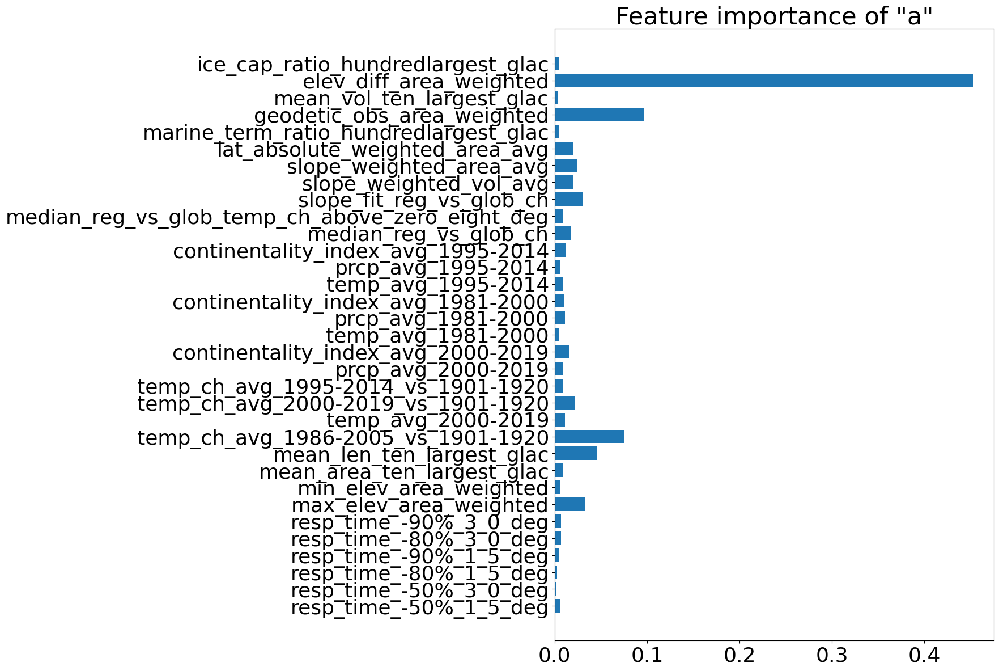

In [39]:
plt.figure(figsize=(10,14))
X = df.iloc[1:].reset_index(drop=True)[columns_sel]
y = df.iloc[1:].reset_index(drop=True)['a_simple']
clf = RandomForestRegressor(n_estimators=100, random_state=42)
clf.fit(X, y)

# get importance
importance = clf.feature_importances_
# summarize feature importance
#for i,v in zip(X.columns, importance):
#    print(f'Feature: {i}, Score: {v:.5f}')
# plot feature importance
plt.barh(X.columns,importance)
plt.title('Feature importance of "a"')
plt.show()



*multilinear fit:*

In [40]:
def log(x):
    return np.log(x)
def hyperb(x):
    return 1/x
def hyperb_plus(x):
    return 1/(x+1)
def linear(x):
    return x
def quadratic(x):
    return x**2

In [41]:
features_bic_d_a_simple={}
features_bic_d_b_simple = {}
features_r2_d_b_simple = {}
features_r2_d_a_simple = {}
features_r2_adj_d_a_simple = {}
features_r2_adj_d_b_simple = {}
fs = fs_linear_fit
for f in fs:
    for ff in fs:
        for fff in fs:
            features = f"{f}+{ff}+{fff}"
            #func=linear
            #for func in ['linear','hyperb','hyperb_plus','quadratic','log']:
            # here we only assume linearities, but actually it could also be 
            prestige_model_a = ols(f"a_simple ~{features}",
                                     data=df.iloc[1:]).fit()
            prestige_model_b = ols(f"b_simple ~{features}",
                                 data=df.iloc[1:]).fit()
            features_bic_d_a_simple[features] = prestige_model_a.bic
            features_bic_d_b_simple[features] = prestige_model_b.bic
            features_r2_d_a_simple[features] = prestige_model_a.rsquared
            features_r2_d_b_simple[features] = prestige_model_b.rsquared
            features_r2_adj_d_a_simple[features] = prestige_model_a.rsquared_adj
            features_r2_adj_d_b_simple[features] = prestige_model_b.rsquared_adj

pd_a = pd.DataFrame(features_bic_d_a_simple, index=['BIC']).T.sort_values(by='BIC')[::6]
pd_a['R2'] = pd.DataFrame(features_r2_d_a_simple, index=['R2']).T.loc[pd_a.index]
pd_a['R2_adj'] = pd.DataFrame(features_r2_adj_d_a_simple, index=['R2_adj']).T.loc[pd_a.index]
pd_a.iloc[:5]

,BIC,R2,R2_adj
geodetic_obs_area_weighted+prcp_avg_past+elev_diff_area_weighted,146.715816,0.781706,0.738048
ci_avg_past+geodetic_obs_area_weighted+elev_diff_area_weighted,151.340074,0.721554,0.665865
geodetic_obs_area_weighted+lat_weighted_area_avg+elev_diff_area_weighted,151.801771,0.714705,0.657646
slope_fit_reg_vs_glob_ch+elev_diff_area_weighted+geodetic_obs_area_weighted,151.919306,0.712935,0.655522
elev_diff_area_weighted+median_reg_vs_glob_ch+geodetic_obs_area_weighted,152.006284,0.711618,0.653941


In [42]:
best_features_a = pd.DataFrame(features_bic_d_a_simple, index=['BIC']).T.idxmin().values[0]
prestige_model_a = ols(f"a_simple ~ {best_features_a}",
                                 data=df.iloc[1:]).fit()
prestige_model_a.summary()

/home/users/lschuster/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1769: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=19
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               a_simple   R-squared:                       0.782
Model:                            OLS   Adj. R-squared:                  0.738
Method:                 Least Squares   F-statistic:                     17.90
Date:                Fri, 24 Nov 2023   Prob (F-statistic):           3.21e-05
Time:                        10:28:59   Log-Likelihood:                -67.469
No. Observations:                  19   AIC:                             142.9
Df Residuals:                      15   BIC:                             146.7
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                     38.1269      6.918      5.511      0.000      23.381      52.873
prcp_avg_past               3.754e+05   1.14e+05      3.285      0.005    1.32e+05    6.19e+05
geodetic_obs_area_weighted    70.1905     12.668      5.541      0.000      43.189      97.192
elev_diff_area_weighted        0.0262      0.005      5.701      0.000       0.016       0.036
==============================================================================
Omnibus:                        3.935   Durbin-Watson:                   1.885
Prob(Omnibus):                  0.140   Jarque-Bera (JB):                1.458
Skew:                          -0.199   Prob(JB):                        0.482
Kurtosis:                       1.703   Cond. No.                     6.97e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.97e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [43]:
#pd_a.loc['elev_diff_area_weighted+elev_diff_area_weighted+elev_diff_area_weighted']

In [44]:
prestige_model_ax = ols(f"a_simple ~ hyperb(elev_diff_area_weighted)",
                                 data=df.iloc[1:]).fit()
prestige_model_ax.summary()

/home/users/lschuster/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1769: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=19
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               a_simple   R-squared:                       0.396
Model:                            OLS   Adj. R-squared:                  0.360
Method:                 Least Squares   F-statistic:                     11.13
Date:                Fri, 24 Nov 2023   Prob (F-statistic):            0.00391
Time:                        10:28:59   Log-Likelihood:                -77.141
No. Observations:                  19   AIC:                             158.3
Df Residuals:                      17   BIC:                             160.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
===================================================================================================
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept                          82.0128     10.282      7.976      0.000      60.320     103.706
hyperb(elev_diff_area_weighted) -3.503e+04   1.05e+04     -3.337      0.004   -5.72e+04   -1.29e+04
==============================================================================
Omnibus:                        1.772   Durbin-Watson:                   2.051
Prob(Omnibus):                  0.412   Jarque-Bera (JB):                1.222
Skew:                          -0.608   Prob(JB):                        0.543
Kurtosis:                       2.745   Cond. No.                     3.08e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.08e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

**explain b**

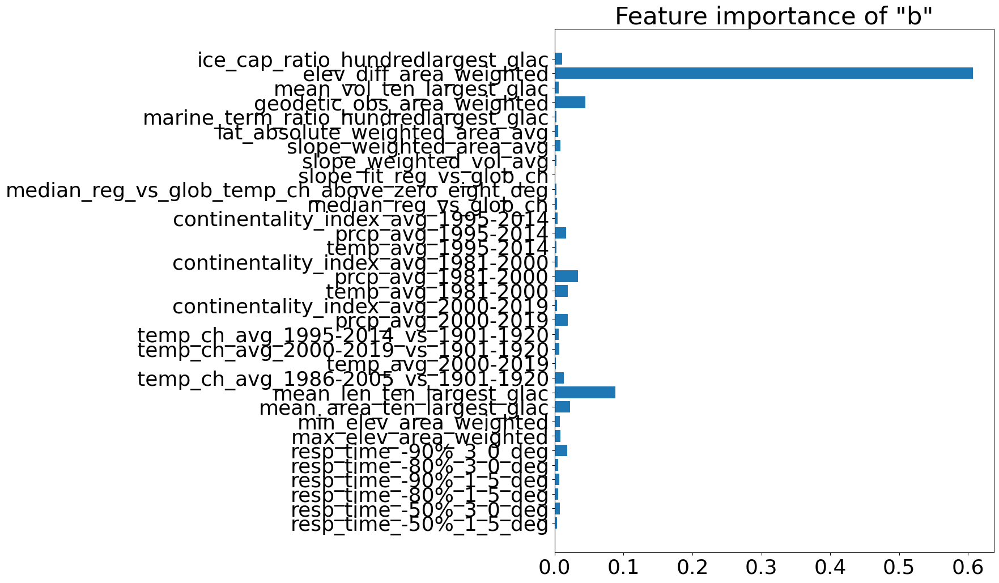

In [45]:
plt.figure(figsize=(10,12))
X = df.iloc[1:].reset_index(drop=True)[columns_sel]
y = df.iloc[1:].reset_index(drop=True)['b_simple']
clf = RandomForestRegressor(n_estimators=100, random_state=42)
clf.fit(X, y)

# get importance
importance = clf.feature_importances_
# summarize feature importance
#for i,v in zip(X.columns, importance):
#    print(f'Feature: {i}, Score: {v:.5f}')
# plot feature importance
plt.barh(X.columns,importance)
plt.title('Feature importance of "b"')
plt.show()

In [46]:
pd_b = pd.DataFrame(features_bic_d_b_simple, index=['BIC']).T.sort_values(by='BIC')[::6]
pd_b['R2'] = pd.DataFrame(features_r2_d_b_simple, index=['R2']).T.loc[pd_b.index]
pd_b['R2_adj'] = pd.DataFrame(features_r2_adj_d_b_simple, index=['R2_adj']).T.loc[pd_b.index]
pd_b.iloc[:5]

,BIC,R2,R2_adj
temp_avg_past+lat_weighted_area_avg+elev_diff_area_weighted,13.737377,0.733856,0.680627
elev_diff_area_weighted+slope_weighted_vol_avg+resp_time_three_deg_80,14.332708,0.725385,0.670462
elev_diff_area_weighted+slope_weighted_area_avg+resp_time_three_deg_80,14.419270,0.724131,0.668957
slope_weighted_area_avg+elev_diff_area_weighted+resp_time_three_deg,14.936092,0.716524,0.659829
resp_time_three_deg+elev_diff_area_weighted+slope_weighted_vol_avg,15.058124,0.714698,0.657637


In [47]:
best_features_b = pd.DataFrame(features_bic_d_b_simple, index=['BIC']).T.idxmin().values[0]
prestige_model_b = ols(f"b_simple ~ {best_features_b}",
                                 data=df.iloc[1:]).fit()
prestige_model_b.summary()

/home/users/lschuster/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1769: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=19
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               b_simple   R-squared:                       0.734
Model:                            OLS   Adj. R-squared:                  0.681
Method:                 Least Squares   F-statistic:                     13.79
Date:                Fri, 24 Nov 2023   Prob (F-statistic):           0.000138
Time:                        10:29:00   Log-Likelihood:               -0.97981
No. Observations:                  19   AIC:                             9.960
Df Residuals:                      15   BIC:                             13.74
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                   1.6626      0.198      8.396      0.000       1.241       2.085
lat_weighted_area_avg       0.0054      0.002      3.308      0.005       0.002       0.009
temp_avg_past               0.0288      0.010      2.963      0.010       0.008       0.049
elev_diff_area_weighted    -0.0007      0.000     -5.059      0.000      -0.001      -0.000
==============================================================================
Omnibus:                        2.156   Durbin-Watson:                   1.842
Prob(Omnibus):                  0.340   Jarque-Bera (JB):                1.700
Skew:                           0.694   Prob(JB):                        0.427
Kurtosis:                       2.531   Cond. No.                     4.00e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large,  4e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

**"response time" features**

In [48]:
columns_sel_rt = ['a_simple', 'b_simple', #'V$_{eq,rel,ΔT=+2°C}$ [in %]',
       #'ΔT(V$_{eq,rel}=\frac{a}{2}$) [in °C]',
       #'resp_time_-50%_1_5_deg', 'resp_time_-50%_3_0_deg',
        'max_elev_area_weighted','min_elev_area_weighted','mean_area_ten_largest_glac','mean_len_ten_largest_glac',
        'temp_ch_avg_1986-2005_vs_1901-1920', 'temp_avg_2000-2019',
        'temp_ch_avg_2000-2019_vs_1901-1920',
        'temp_ch_avg_1995-2014_vs_1901-1920', 'prcp_avg_2000-2019',
        'continentality_index_avg_2000-2019', 'temp_avg_1981-2000',
        'prcp_avg_1981-2000', 'continentality_index_avg_1981-2000',
        'temp_avg_1995-2014', 'prcp_avg_1995-2014',
        'continentality_index_avg_1995-2014',
    'median_reg_vs_glob_ch','median_reg_vs_glob_temp_ch_above_zero_eight_deg',
       'slope_fit_reg_vs_glob_ch', 
    'slope_weighted_vol_avg',
       'slope_weighted_area_avg', 'lat_absolute_weighted_area_avg',
    'marine_term_ratio_hundredlargest_glac', 'geodetic_obs_area_weighted', 'mean_vol_ten_largest_glac','elev_diff_area_weighted','ice_cap_ratio_hundredlargest_glac']

fs_linear_fit_rt = ['a_simple', 'b_simple', 'median_reg_vs_glob_ch','median_reg_vs_glob_temp_ch_above_zero_eight_deg',
       'slope_fit_reg_vs_glob_ch', 
      'slope_weighted_vol_avg',
       'slope_weighted_area_avg', 'lat_weighted_area_avg',
       'lat_absolute_weighted_area_avg', 'temp_ch_avg_past','temp_avg_past','prcp_avg_past','ci_avg_past',
      'marine_term_ratio_hundredlargest_glac', 'geodetic_obs_area_weighted', 'mean_vol_ten_largest_glac','elev_diff_area_weighted','ice_cap_ratio_hundredlargest_glac',
                     'max_elev_area_weighted','min_elev_area_weighted','mean_area_ten_largest_glac','mean_len_ten_largest_glac']

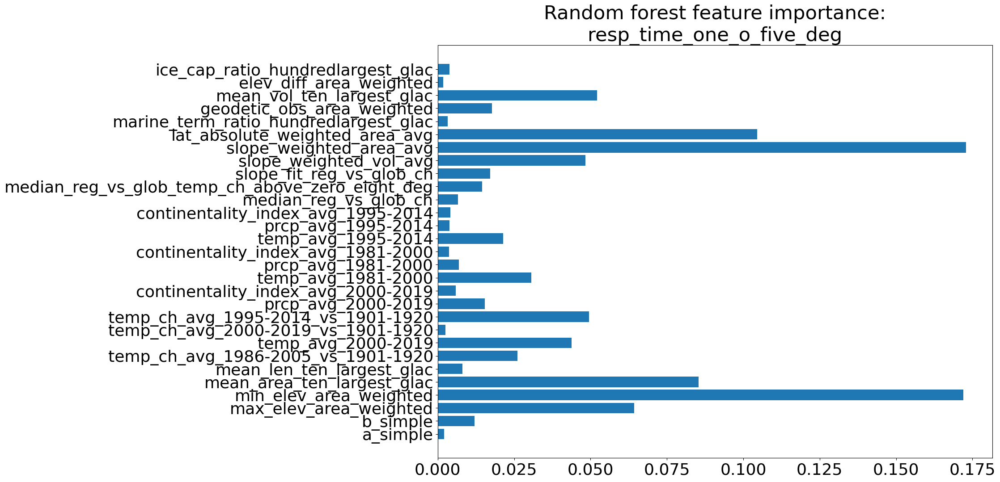

In [49]:
plt.figure(figsize=(16,12))

X = df.iloc[1:].reset_index(drop=True)[columns_sel_rt]
y = df.iloc[1:].reset_index(drop=True)['resp_time_one_o_five_deg']
clf = RandomForestRegressor(n_estimators=100, random_state=42)
clf.fit(X, y)

# get importance
importance = clf.feature_importances_
# summarize feature importance
#for i,v in zip(X.columns, importance):
#    print(f'Feature: {i}, Score: {v:.5f}')
# plot feature importance
plt.title('Random forest feature importance:\nresp_time_one_o_five_deg')
plt.barh(X.columns,importance)
plt.show()

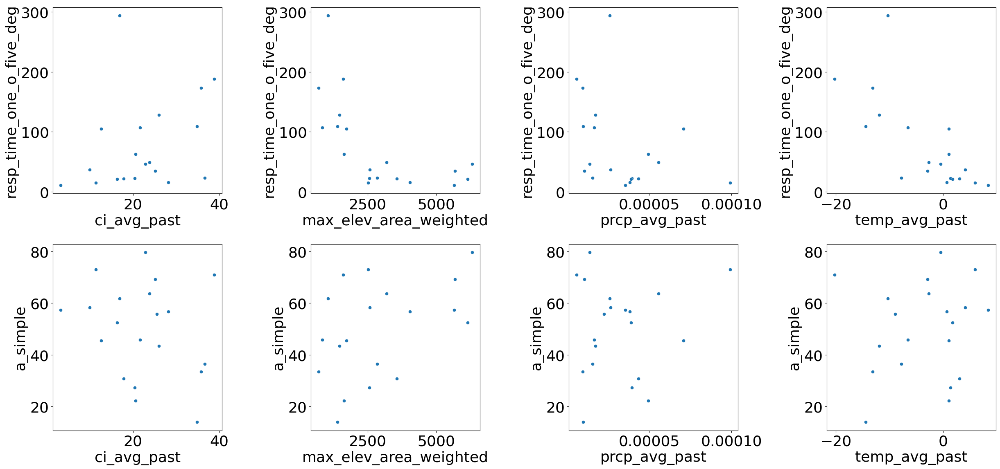

In [50]:
fig, axs=plt.subplots(2,4, figsize=(25,12))
axs #=axs.flatten()
for j,x in enumerate(['ci_avg_past', 'max_elev_area_weighted','prcp_avg_past','temp_avg_past']):
    ax = axs[0][j]
    sns.scatterplot(ax=ax,data=df, x=x, y='resp_time_one_o_five_deg')
for j,x in enumerate(['ci_avg_past', 'max_elev_area_weighted','prcp_avg_past','temp_avg_past']):
    ax = axs[1][j]
    sns.scatterplot(ax=ax,data=df, x=x, y='a_simple')
plt.tight_layout()

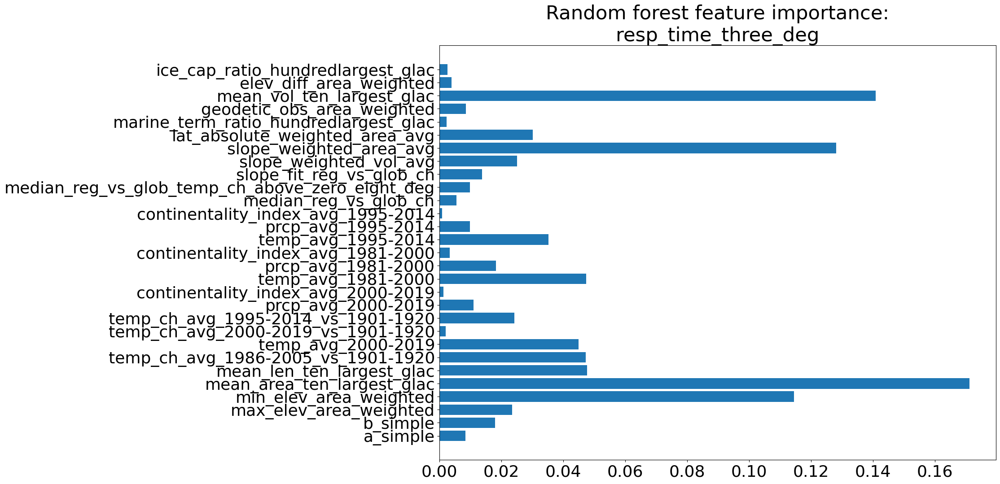

In [51]:
plt.figure(figsize=(16,12))

X = df.iloc[1:].reset_index(drop=True)[columns_sel_rt]
y = df.iloc[1:].reset_index(drop=True)['resp_time_three_deg']
clf = RandomForestRegressor(n_estimators=100, random_state=42)
clf.fit(X, y)

# get importance
importance = clf.feature_importances_
# plot feature importance
plt.title('Random forest feature importance:\nresp_time_three_deg')
plt.barh(X.columns,importance)
plt.show()

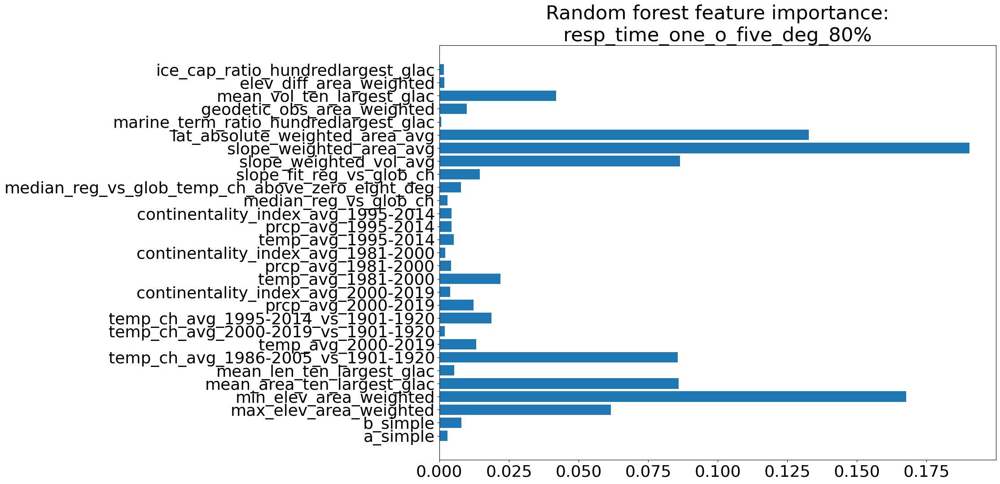

In [52]:
plt.figure(figsize=(16,12))

X = df.iloc[1:].reset_index(drop=True)[columns_sel_rt]
y = df.iloc[1:].reset_index(drop=True)['resp_time_one_o_five_deg_80']
clf = RandomForestRegressor(n_estimators=100, random_state=42)
clf.fit(X, y)

# get importance
importance = clf.feature_importances_
# summarize feature importance
#for i,v in zip(X.columns, importance):
#    print(f'Feature: {i}, Score: {v:.5f}')
# plot feature importance
plt.title('Random forest feature importance:\nresp_time_one_o_five_deg_80%')
plt.barh(X.columns,importance)
plt.show()

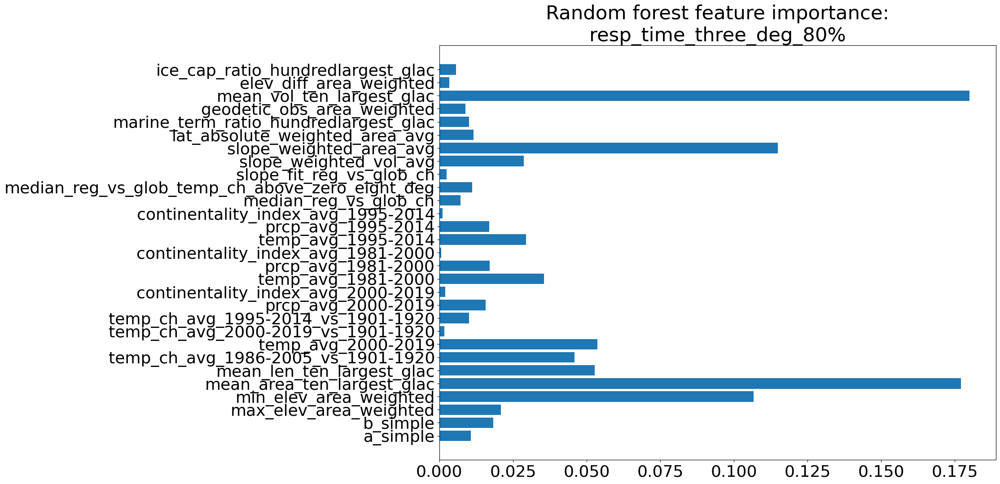

In [53]:
plt.figure(figsize=(16,12))

X = df.iloc[1:].reset_index(drop=True)[columns_sel_rt]
y = df.iloc[1:].reset_index(drop=True)['resp_time_three_deg_80']
clf = RandomForestRegressor(n_estimators=100, random_state=42)
clf.fit(X, y)

# get importance
importance = clf.feature_importances_
# summarize feature importance
#for i,v in zip(X.columns, importance):
#    print(f'Feature: {i}, Score: {v:.5f}')
# plot feature importance
plt.title('Random forest feature importance:\nresp_time_three_deg_80%')
plt.barh(X.columns,importance)
plt.show()

In [54]:
fs = fs_linear_fit_rt
features_bic_d_1_5_simple = {}
features_bic_d_3_0_simple = {}
for f in fs:
    for ff in fs:
        for fff in fs:
            
            features = f"{f}+{ff}+{fff}"
            prestige_model_1_5 = ols(f"resp_time_one_o_five_deg ~ {features}",
                                 data=df.iloc[1:]).fit()
            prestige_model_3 = ols(f"resp_time_three_deg ~ {features}",
                                 data=df.iloc[1:]).fit()
            features_bic_d_1_5_simple[features] = prestige_model_1_5.bic
            features_bic_d_3_0_simple[features] = prestige_model_3.bic
            
best_features_1_5 = pd.DataFrame(features_bic_d_1_5_simple, index=['BIC']).T.idxmin().values[0]
print(best_features_1_5)
prestige_model_1_5 = ols(f"resp_time_one_o_five_deg ~ {best_features_1_5}",
                                 data=df.iloc[1:]).fit()
print(prestige_model_1_5.summary())

slope_fit_reg_vs_glob_ch+elev_diff_area_weighted+mean_area_ten_largest_glac
                               OLS Regression Results                               
Dep. Variable:     resp_time_one_o_five_deg   R-squared:                       0.941
Model:                                  OLS   Adj. R-squared:                  0.929
Method:                       Least Squares   F-statistic:                     79.36
Date:                      Fri, 24 Nov 2023   Prob (F-statistic):           1.97e-09
Time:                              10:30:20   Log-Likelihood:                -81.820
No. Observations:                        19   AIC:                             171.6
Df Residuals:                            15   BIC:                             175.4
Df Model:                                 3                                         
Covariance Type:                  nonrobust                                         
                                 coef    std err          t      P>|t|    

/home/users/lschuster/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1769: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=19
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


In [55]:
pd_rt_15 = pd.DataFrame(features_bic_d_1_5_simple, index=['BIC']).T.sort_values(by='BIC')[::6]
pd_rt_15.iloc[:5]

,BIC
elev_diff_area_weighted+slope_fit_reg_vs_glob_ch+mean_area_ten_largest_glac,175.418417
elev_diff_area_weighted+mean_vol_ten_largest_glac+mean_area_ten_largest_glac,175.796090
elev_diff_area_weighted+ice_cap_ratio_hundredlargest_glac+mean_area_ten_largest_glac,175.800081
mean_area_ten_largest_glac+mean_len_ten_largest_glac+elev_diff_area_weighted,175.991568
mean_area_ten_largest_glac+elev_diff_area_weighted+median_reg_vs_glob_temp_ch_above_zero_eight_deg,176.127320


                               OLS Regression Results                               
Dep. Variable:     resp_time_one_o_five_deg   R-squared:                       0.771
Model:                                  OLS   Adj. R-squared:                  0.758
Method:                       Least Squares   F-statistic:                     57.28
Date:                      Fri, 24 Nov 2023   Prob (F-statistic):           7.70e-07
Time:                              10:30:20   Log-Likelihood:                -94.656
No. Observations:                        19   AIC:                             193.3
Df Residuals:                            17   BIC:                             195.2
Df Model:                                 1                                         
Covariance Type:                  nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------

/home/users/lschuster/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1769: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=19
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


Text(0, 0.5, 'resp_time_1_5_deg-50%')

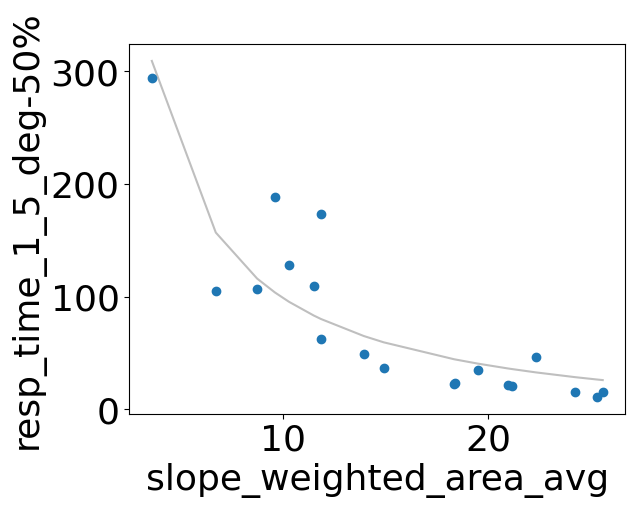

In [56]:
# best single variable ... 
prestige_model_1_5x = ols(f"resp_time_one_o_five_deg ~ hyperb(slope_weighted_area_avg)",
                            data=df.iloc[1:]).fit()
print(prestige_model_1_5x.summary())

fit_sorted = prestige_model_1_5x.fittedvalues.sort_values()
plt.plot(df.loc[fit_sorted.index].slope_weighted_area_avg, fit_sorted.values, color='grey', alpha = 0.5)
plt.plot(df.slope_weighted_area_avg, df.resp_time_one_o_five_deg, 'o')
plt.xlabel('slope_weighted_area_avg')
plt.ylabel('resp_time_1_5_deg-50%')

                                 OLS Regression Results                                
Dep. Variable:     resp_time_one_o_five_deg_80   R-squared:                       0.841
Model:                                     OLS   Adj. R-squared:                  0.831
Method:                          Least Squares   F-statistic:                     89.73
Date:                         Fri, 24 Nov 2023   Prob (F-statistic):           3.41e-08
Time:                                 10:30:20   Log-Likelihood:                -108.62
No. Observations:                           19   AIC:                             221.2
Df Residuals:                               17   BIC:                             223.1
Df Model:                                    1                                         
Covariance Type:                     nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
--------------------

/home/users/lschuster/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1769: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=19
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


Text(0, 0.5, 'resp_time_1_5_deg-80%')

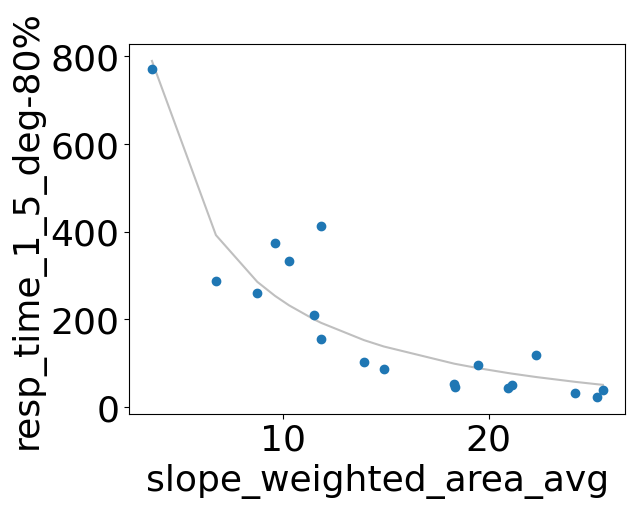

In [57]:
# best single variable ... 
prestige_model_1_5x = ols(f"resp_time_one_o_five_deg_80 ~ hyperb(slope_weighted_area_avg)",
                            data=df.iloc[1:]).fit()
print(prestige_model_1_5x.summary())

fit_sorted = prestige_model_1_5x.fittedvalues.sort_values()
plt.plot(df.loc[fit_sorted.index].slope_weighted_area_avg, fit_sorted.values, color='grey', alpha = 0.5)
plt.plot(df.slope_weighted_area_avg, df.resp_time_one_o_five_deg_80, 'o')
plt.xlabel('slope_weighted_area_avg')
plt.ylabel('resp_time_1_5_deg-80%')

In [58]:
best_features_3_0 = pd.DataFrame(features_bic_d_3_0_simple, index=['BIC']).T.idxmin().values[0]
print(best_features_3_0)
prestige_model_3_0 = ols(f"resp_time_three_deg ~ {best_features_3_0}",
                                 data=df.iloc[1:]).fit()
print(prestige_model_3_0.summary())

/home/users/lschuster/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1769: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=19
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


temp_avg_past+elev_diff_area_weighted+mean_area_ten_largest_glac
                             OLS Regression Results                            
Dep. Variable:     resp_time_three_deg   R-squared:                       0.950
Model:                             OLS   Adj. R-squared:                  0.940
Method:                  Least Squares   F-statistic:                     94.98
Date:                 Fri, 24 Nov 2023   Prob (F-statistic):           5.54e-10
Time:                         10:30:20   Log-Likelihood:                -67.986
No. Observations:                   19   AIC:                             144.0
Df Residuals:                       15   BIC:                             147.7
Df Model:                            3                                         
Covariance Type:             nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

                             OLS Regression Results                            
Dep. Variable:     resp_time_three_deg   R-squared:                       0.748
Model:                             OLS   Adj. R-squared:                  0.733
Method:                  Least Squares   F-statistic:                     50.36
Date:                 Fri, 24 Nov 2023   Prob (F-statistic):           1.79e-06
Time:                         10:30:20   Log-Likelihood:                -83.364
No. Observations:                   19   AIC:                             170.7
Df Residuals:                       17   BIC:                             172.6
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------


/home/users/lschuster/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1769: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=19
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


Text(0, 0.5, 'resp_time_three_deg-50%')

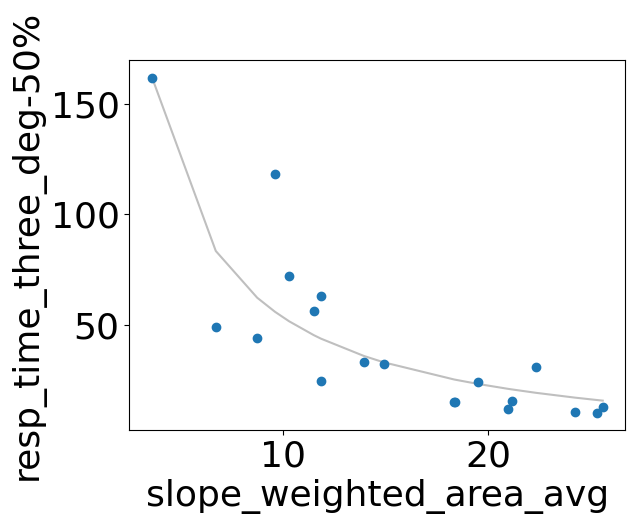

In [59]:
# best single variable ... 
prestige_model_3degx = ols(f"resp_time_three_deg ~ hyperb(slope_weighted_area_avg)",
                                 data=df.iloc[1:]).fit()
print(prestige_model_3degx.summary())

fit_sorted = prestige_model_3degx.fittedvalues.sort_values()
plt.plot(df.loc[fit_sorted.index].slope_weighted_area_avg, fit_sorted.values, color='grey', alpha = 0.5)
plt.plot(df.slope_weighted_area_avg, df.resp_time_three_deg, 'o')
plt.xlabel('slope_weighted_area_avg')
plt.ylabel('resp_time_three_deg-50%')

                              OLS Regression Results                              
Dep. Variable:     resp_time_three_deg_80   R-squared:                       0.748
Model:                                OLS   Adj. R-squared:                  0.733
Method:                     Least Squares   F-statistic:                     50.45
Date:                    Fri, 24 Nov 2023   Prob (F-statistic):           1.77e-06
Time:                            10:30:20   Log-Likelihood:                -101.31
No. Observations:                      19   AIC:                             206.6
Df Residuals:                          17   BIC:                             208.5
Df Model:                               1                                         
Covariance Type:                nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

/home/users/lschuster/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1769: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=19
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


Text(0, 0.5, 'resp_time_three_deg-80%')

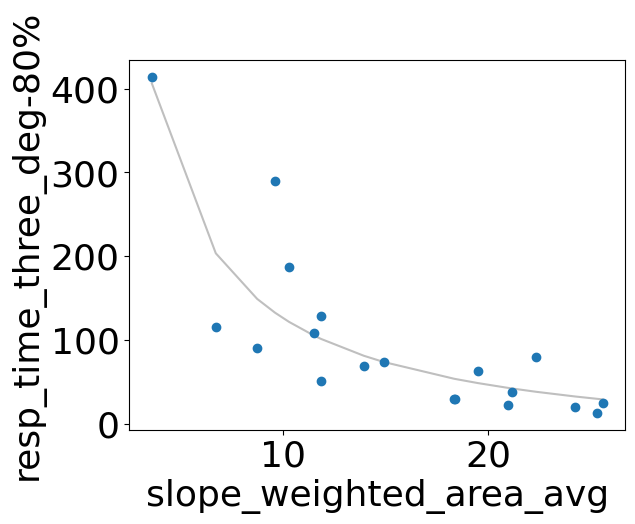

In [60]:
# best single variable ... 
prestige_model_3degx = ols(f"resp_time_three_deg_80 ~ hyperb(slope_weighted_area_avg)",
                                 data=df.iloc[1:]).fit()
print(prestige_model_3degx.summary())

fit_sorted = prestige_model_3degx.fittedvalues.sort_values()
plt.plot(df.loc[fit_sorted.index].slope_weighted_area_avg, fit_sorted.values, color='grey', alpha = 0.5)
plt.plot(df.slope_weighted_area_avg, df.resp_time_three_deg_80, 'o')
plt.xlabel('slope_weighted_area_avg')
plt.ylabel('resp_time_three_deg-80%')

In [61]:
columns_sel3=[
'max_elev_area_weighted',
 'min_elev_area_weighted',
 'mean_area_ten_largest_glac',
 'mean_len_ten_largest_glac',
# 'temp_ch_avg_1986-2005_vs_1901-1920',
 'temp_avg_2000-2019',
 'temp_ch_avg_2000-2019_vs_1901-1920',
 #'temp_ch_avg_1995-2014_vs_1901-1920',
 'prcp_avg_2000-2019',
 'continentality_index_avg_2000-2019',
# 'temp_avg_1981-2000',
# 'prcp_avg_1981-2000',
# 'continentality_index_avg_1981-2000',
# 'temp_avg_1995-2014',
# 'prcp_avg_1995-2014',
# 'continentality_index_avg_1995-2014',
 'median_reg_vs_glob_ch',
 'median_reg_vs_glob_temp_ch_above_zero_eight_deg',
 'slope_fit_reg_vs_glob_ch',
 #'slope_weighted_vol_avg',
 'slope_weighted_area_avg',
 'lat_absolute_weighted_area_avg',
 'marine_term_ratio_hundredlargest_glac',
 'geodetic_obs_area_weighted',
 'mean_vol_ten_largest_glac',
 'elev_diff_area_weighted',
 'ice_cap_ratio_hundredlargest_glac',
    # these are the variables we want to explain ... 
'resp_time_-90%_1_5_deg',
'resp_time_-90%_3_0_deg',
    'resp_time_-80%_1_5_deg',
'resp_time_-80%_3_0_deg',
'resp_time_-50%_1_5_deg',
 'resp_time_-50%_3_0_deg',
 'a_simple',
 'b_simple']

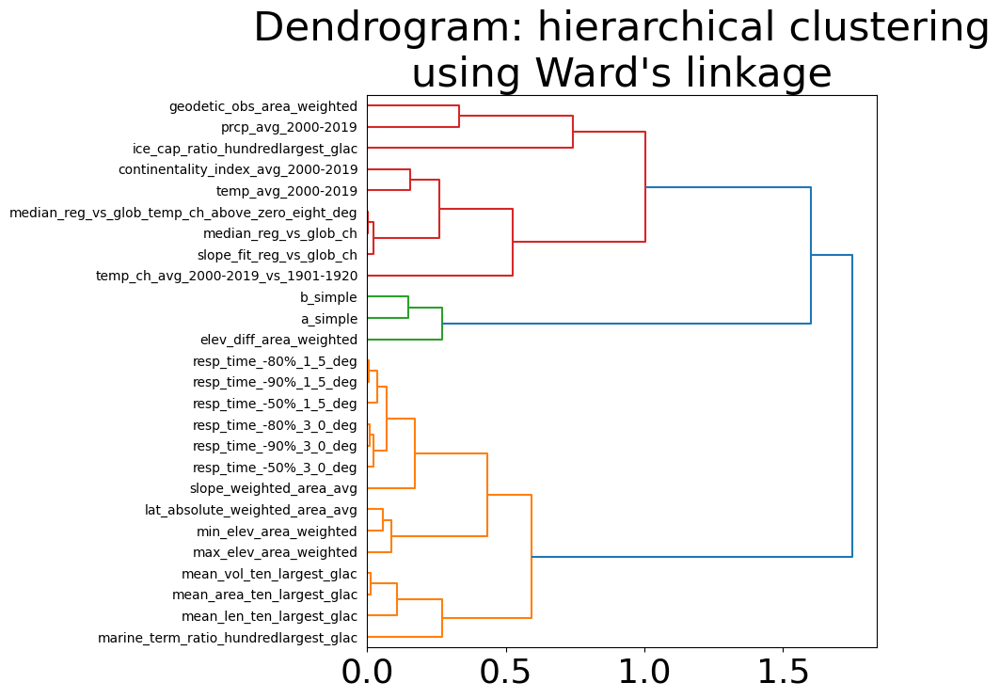

In [62]:
from scipy.cluster import hierarchy
from scipy.spatial.distance import squareform
from scipy.stats import spearmanr
X = df.iloc[1:].reset_index(drop=True)[columns_sel3]

fig, (ax1) = plt.subplots(1, 1, figsize=(10, 8))
corr = spearmanr(X).correlation
# Ensure the correlation matrix is symmetric
corr = (corr + corr.T) / 2
np.fill_diagonal(corr, 1)

# We convert the correlation matrix to a distance matrix before performing
# hierarchical clustering using Ward's linkage.
distance_matrix = 1 - np.abs(corr)
dist_linkage = hierarchy.ward(squareform(distance_matrix))
dendro = hierarchy.dendrogram(
    dist_linkage, labels=X.columns.to_list(), ax=ax1, leaf_rotation=0,
    orientation='right'
)
dendro_idx = np.arange(0, len(dendro["ivl"]))
plt.title("Dendrogram: hierarchical clustering\nusing Ward's linkage")
#ax2.imshow(corr[dendro["leaves"], :][:, dendro["leaves"]])
#ax2.set_xticks(dendro_idx)
#ax2.set_yticks(dendro_idx)
#ax2.set_xticklabels(dendro["ivl"], rotation="vertical")
#ax2.set_yticklabels(dendro["ivl"])
_ = fig.tight_layout()

<AxesSubplot:title={'center':'spearman rank'}>

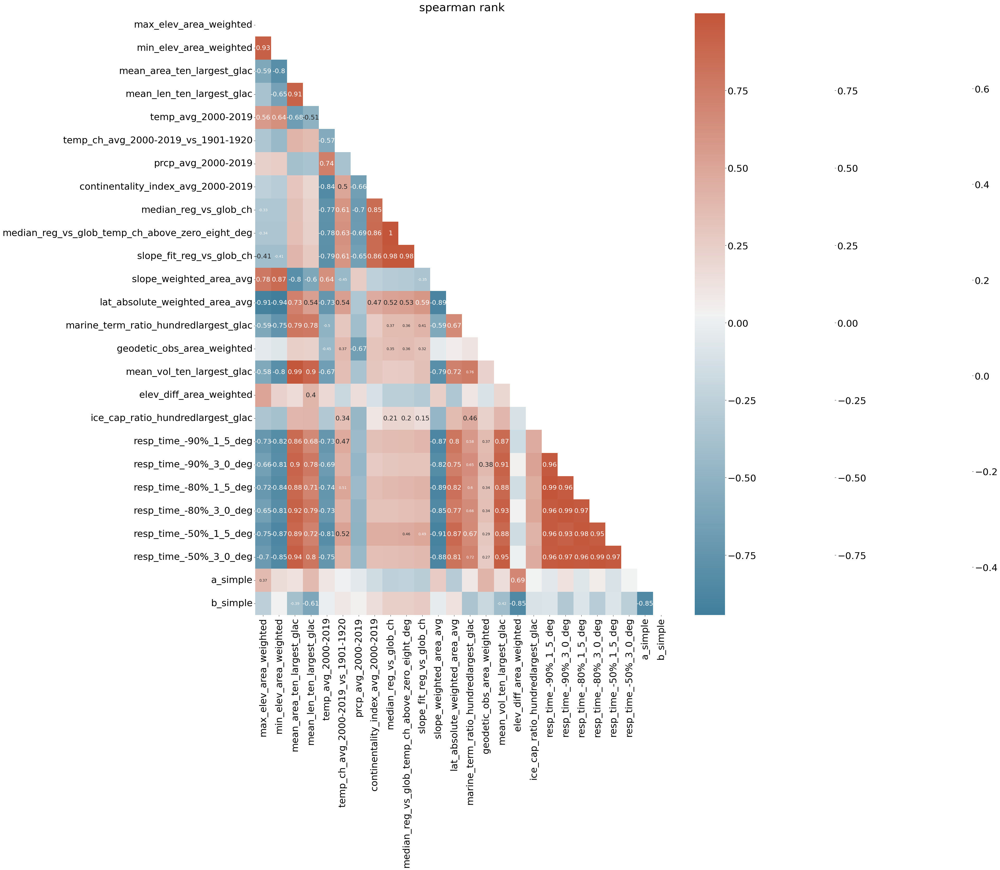

In [63]:
#Correlation between different variables
#
df_sel = df.iloc[1:].reset_index(drop=True)[columns_sel3]
corr = df_sel.corr(method='spearman') # df_sel.corr()
#
# Set up the matplotlib plot configuration
#
f, ax = plt.subplots(figsize=(40, 30))
#
plt.title('spearman rank')
# Generate a mask for upper traingle
#
mask = np.triu(np.ones_like(corr, dtype=bool))
#
# Configure a custom diverging colormap
#
cmap = sns.diverging_palette(230, 20, as_cmap=True)
#
# Draw the heatmap
#
# Create an empty matrix to store p-values
num_cols = len(df_sel.columns)
p_values = np.zeros((num_cols, num_cols))

# Calculate p-values for each pair of columns
for i, col1 in enumerate(df_sel.columns):
    for j, col2 in enumerate(df_sel.columns):
        corr_coef, p_value = pearsonr(df_sel[col1], df_sel[col2])
        p_values[i][j] = p_value

# Convert the matrix to a DataFrame for better visualization
p_values_df = pd.DataFrame(p_values, columns=df_sel.columns, index=df_sel.columns)

sns.heatmap(corr[(p_values_df<0.1)&(p_values_df>=0.05)],annot=True, mask = mask, cmap=cmap, annot_kws={'fontsize':10}, alpha =0)
sns.heatmap(corr[p_values_df<0.05],annot=True, mask = mask, cmap=cmap, annot_kws={'fontsize':18}, alpha =0)
sns.heatmap(corr, annot=False, mask = mask, cmap=cmap)


#### Summary plots for manuscript or supplements ...

0.84 4.074490008859048e-06
-0.85 4.681087721120231e-06
-0.89 3.973316985545687e-07
                                 OLS Regression Results                                
Dep. Variable:     resp_time_one_o_five_deg_80   R-squared:                       0.841
Model:                                     OLS   Adj. R-squared:                  0.831
Method:                          Least Squares   F-statistic:                     89.73
Date:                         Fri, 24 Nov 2023   Prob (F-statistic):           3.41e-08
Time:                                 12:09:32   Log-Likelihood:                -108.62
No. Observations:                           19   AIC:                             221.2
Df Residuals:                               17   BIC:                             223.1
Df Model:                                    1                                         
Covariance Type:                     nonrobust                                         
                                     

/home/users/lschuster/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1769: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=19
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/tmp/ipykernel_2409809/1235166981.py:205: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


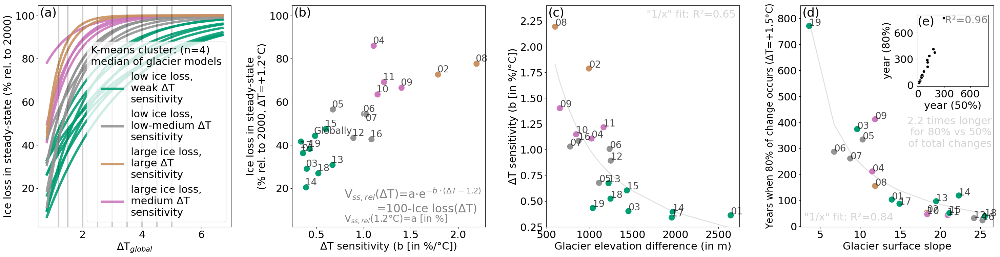

In [147]:
df['Ice loss (steady-state, ΔT=1.5°C)'] = 100-df['a_simple']
from scipy.stats import pearsonr, spearmanr
# from https://stackoverflow.com/questions/46027653/adding-labels-in-x-y-scatter-plot-with-seaborn
def plotlabel(xvar, yvar, label, ax=None):
    ax.text(xvar-0.01, yvar+1, label, alpha=0.7, fontsize=20)
    
def plotlabel_b(xvar, yvar, label, ax=None):
    ax.text(xvar-0.01, yvar-3, label, alpha=0.7, fontsize=20)
def plotlabel_c(xvar, yvar, label, ax=None):
    ax.text(xvar-0.01, yvar+0.01, label, alpha=0.7, fontsize=20)
    
    
def scatter_c(yy='resp_time_-50%_1_5_deg', xx=f'slope_weighted_vol_avg',
              xlabel=f'glacier slope (weighted after initial volume)',ylabel=None, _plotlabel=plotlabel, _plotlabel_b=plotlabel_b,
             print_spearman=True):
    ax = sns.scatterplot(data=df, y=yy, x=xx, hue='kmeans_cluster_4',
                     palette=palette_cb[:4], s=200)
    corrcoef,pval = spearmanr(df[[xx,yy]].dropna()[xx].values, df[[xx,yy]].dropna()[yy].values)
    corrcoef = corrcoef.round(2)
    if (pval <0.05) and print_spearman:
        ax.text(0.01,0.01, f'spearmanr={corrcoef}', transform=ax.transAxes, color='grey')
    print(corrcoef, pval)
    
    df.drop(index=['17','07']).apply(lambda x: _plotlabel(x[xx],x[yy], 
                                                      x['region'], ax=ax), axis=1)

    df.loc[['17', '07']].apply(lambda x: _plotlabel_b(x[xx],x[yy],
                                                        x['region'], ax=ax), axis=1)
    if ylabel is None:
        ylabel = yy

    ax.set_xlabel(xlabel, fontsize=22)
    ax.set_ylabel(ylabel)

    leg=plt.legend(title='K-means\ncluster:\n(n=4)\nmedian of glacier models',
                   loc='lower right')
    leg.remove() 
    
plt.rc('font', size=22)  

plt.figure(figsize=(30,8))

ax=plt.subplot(141)
for k in [0,1,2,3]:
    pd_sel = df.loc[df.kmeans_cluster_4 == k]
    for reg in pd_sel.region:
        pd_sel_reg = pd_sel.loc[pd_sel.region==reg]
        a,b = pd_sel_reg[['a_simple', 'b_simple']].values.squeeze()
        ax.plot(glob_temp[glob_temp>=0.8],
                100-exponential_decay(glob_temp[glob_temp>=0.8],a,b),
                label=reg,
                color=palette_cb[k],lw=5, alpha = 0.9)
handles, labels = ax.get_legend_handles_labels()
handles_l = [handles[0], handles[13],handles[18],handles[10]]
labels_long_cluster = [r'low ice loss'+',\nweak ΔT\nsensitivity', 
                       r'low ice loss'+',\nlow-medium ΔT\nsensitivity', 
                       r'large ice loss'+',\nlarge ΔT\nsensitivity',
                       r'large ice loss'+',\nmedium ΔT\nsensitivity']
ax.legend(handles_l,labels_long_cluster,
          title = 'K-means cluster: (n=4)\nmedian of glacier models', fontsize=22)        

#ax.set_ylabel(r'V$_{ss,rel}$ [in %]')
ax.set_ylabel(r'Ice loss in steady-state (% rel. to 2000)') 

ax.set_xlabel(r'ΔT$_{global}$')

ylim0,ylim1 = ax.get_ylim()
#plt.axvline(0,ls='--', alpha = 0.2,lw=3, color='black')
for T in [current_deltaT,1.5,2,2.5,3,3.5,4,4.5,5]:
    plt.axvline(T,ls='-', alpha = 0.2,lw=3, color='black')


ax1=ax

plt.subplot(142)
ax = sns.scatterplot(data=df, y='Ice loss (steady-state, ΔT=1.5°C)', x='b_simple', hue='kmeans_cluster_4',
                     palette=palette_cb[:4], s=200)
df.drop(index=['17','07']).apply(lambda x: plotlabel(x['b_simple'],  x['Ice loss (steady-state, ΔT=1.5°C)'],
                                                  x['region'], ax=ax), axis=1)

df.loc[['17', '07']].apply(lambda x: plotlabel_b(x['b_simple'],  x['Ice loss (steady-state, ΔT=1.5°C)'],
                                                    x['region'], ax=ax), axis=1)

ax.text(0.27,0.055, r'V$_{ss,rel}$(ΔT)=a$\cdot$e'+r'$^{-b\cdot(ΔT-1.2)}$'+'\n         =100-Ice loss(ΔT)',
        color='grey', fontsize=24, ha='left',transform=ax.transAxes,va='bottom')
ax.text(0.27,0.01, '\n'+r'V$_{ss,rel}$(1.2°C)=a [in %]',fontsize=20, ha='left',transform=ax.transAxes,va='bottom', color='grey')
ax.set_xlabel('ΔT sensitivity (b [in %/°C])')
ax.set_ylabel('Ice loss in steady-state\n(% rel. to 2000, ΔT=+1.2°C)') 
leg=plt.legend(title='K-means\ncluster:\n(n=4)\nmedian of glacier models',
               loc='lower right')
leg.remove()
ax.set_ylim(ylim0,ylim1)

xx = 'b_simple'
yy = 'Ice loss (steady-state, ΔT=1.5°C)'
corrcoef,pval = spearmanr(df[[xx,yy]].dropna()[xx].values, df[[xx,yy]].dropna()[yy].values)
corrcoef = corrcoef.round(2)
#if pval <0.05:
#    ax.text(0.01,0.01, f'spearmanr={corrcoef}', transform=ax.transAxes, color='grey')
print(corrcoef, pval)
#plt.subplot(122)
#ax=sns.scatterplot(data=pd_exp_decay_fits_simple_5000, x=r'V$_{eq,rel,ΔT=+1.2°C}$ [in %]', y=r'b_simple', hue='kmeans_cluster_4', palette=sns.color_palette('tab10'), s=200)
#ax.set_ylabel('b [in %/ΔT]')
#pd_exp_decay_fits_simple_5000.apply(lambda x: plotlabel(x[r'V$_{eq,rel,ΔT=+1.2°C}$ [in %]'],  x['b_simple'], x['region']), axis=1)
#plt.legend(title='K-means\ncluster:\n(n=4)', loc='upper right')

ax2=ax


# add a,b,c
num_text_x = 0.01
for j,axi in enumerate([ax1,ax2]):
    num_text_y = 0.95
    axi.text(num_text_x, num_text_y,
             num_dict[j], fontsize=26, transform=axi.transAxes)
    axi.set_ylim(ax1.get_ylim())

#plt.suptitle('Clustered after normalised exponential fit parameters (a and b)')

plt.subplot(143)
scatter_c(yy='b_simple', xx=f'elev_diff_area_weighted',
xlabel=f'Glacier elevation range (in m)',
          ylabel='ΔT sensitivity (b [in %/°C])',print_spearman=False,
          _plotlabel=plotlabel_c, _plotlabel_b=plotlabel_c)

plt.text(num_text_x, num_text_y,
         num_dict[2], fontsize=26, transform=plt.gca().transAxes)

plt.gca().set_ylim([0.25,2.4])

# best single variable ... 
prestige_model = ols(f"b_simple ~ hyperb(elev_diff_area_weighted)",
                            data=df).fit() #.iloc[1:]

fit_sorted = prestige_model.fittedvalues.sort_values()
plt.plot(df.loc[fit_sorted.index].elev_diff_area_weighted,
         fit_sorted.values, alpha = 0.7, zorder=-1, color='lightgrey', lw=2)
plt.text(0.98,0.98,f'"1/x" fit: R²={prestige_model.rsquared.round(2)}', transform=plt.gca().transAxes, ha='right', va='top', color='lightgrey')


plt.subplot(144)
y = 'resp_time_one_o_five_deg_80'
yy='resp_time_-80%_1_5_deg'
ylabel = r'Years when 80% of change occurs ($\Delta$T=+1.5°C)'
xx = f'resp_time_-50%_1_5_deg'
xlabel = r'Years when 50% of change occurs ($\Delta$T=+1.5°C)'

scatter_c(yy=yy,xx=f'slope_weighted_area_avg',
xlabel=f'Glacier surface slope', print_spearman=False,
          ylabel=ylabel, _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)
#plt.gca().set_yticks([])
#plt.gca().set_ylabel('')
# best single variable ... 
prestige_model_1_5x = ols(f"{y} ~ hyperb(slope_weighted_area_avg)",
                            data=df).fit() #.iloc[1:]
print(prestige_model_1_5x.summary())

fit_sorted = prestige_model_1_5x.fittedvalues.sort_values()
plt.plot(df.loc[fit_sorted.index].slope_weighted_area_avg,
         fit_sorted.values,  alpha = 0.7, zorder=-1, color='lightgrey', lw=2)
plt.text(0.02,0.02,f'"1/x" fit: R²={prestige_model_1_5x.rsquared.round(2)}', transform=plt.gca().transAxes, ha='left', va='bottom', color='lightgrey')

plt.text(0.99,0.5, "2.2 times longer\nfor 80% vs 50%\nof total changes", fontsize=22,
         transform=plt.gca().transAxes, ha='right', va='top', color='lightgrey')

plt.text(num_text_x, num_text_y,
         num_dict[3], fontsize=26, transform=plt.gca().transAxes)


plt.ylim([-2,850])

plt.ylabel(ylabel, fontsize=20)
ax = plt.gca()
inset_ax = inset_axes(ax,
                    width="37%", # width = 30% of parent_bbox
                    height="36%", # height : 1 inch
                    loc='upper right',
                    #bbox_to_anchor=(1, 0.9, 0, 0),
                       )
#inset_ax.set_title(' t\n t', alpha =0)
sns.scatterplot(df,y=yy,x=xx,ax=inset_ax, color='black')
inset_ax.set_xlabel('year (50%)')
inset_ax.set_ylabel('year (80%)') 
#_plotlabel=plotlabel, _plotlabel_b=plotlabel_b)
inset_ax.text(num_text_x, num_text_y*0.9,
         num_dict[4], fontsize=26, transform=inset_ax.transAxes)

plt.text(0.99, 0.99,
         'R²=0.96', fontsize=22, color='grey', va='top', ha='right',
         transform=inset_ax.transAxes)
#plt.ylim([-2,840])
#inset_ax.grid(alpha=0.5)

inset_ax.set_aspect('equal')
ylim0,ylim1 = inset_ax.get_ylim()
xlim0,xlim1 = inset_ax.get_xlim()
lim0 = min(ylim0, xlim0)
lim1 = max(ylim1, xlim1)
inset_ax.set_xlim([lim0, lim1])
inset_ax.set_ylim([lim0, lim1])

inset_ax.set_xticks(np.arange(0,lim1,300))
inset_ax.set_yticks(np.arange(0,lim1,300))

plt.tight_layout()
#plt.savefig(f'figures/3_k_means_clustering/a_b_rel_important_features_scatter_plot.png')

0.84 4.074490008859048e-06
-0.85 4.681087721120231e-06
-0.85 3.995960483808303e-06
                              OLS Regression Results                              
Dep. Variable:     resp_time_three_deg_80   R-squared:                       0.748
Model:                                OLS   Adj. R-squared:                  0.733
Method:                     Least Squares   F-statistic:                     50.45
Date:                    Fri, 24 Nov 2023   Prob (F-statistic):           1.77e-06
Time:                            16:14:21   Log-Likelihood:                -101.31
No. Observations:                      19   AIC:                             206.6
Df Residuals:                          17   BIC:                             208.5
Df Model:                               1                                         
Covariance Type:                nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025

/home/users/lschuster/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1769: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=19
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/tmp/ipykernel_2409809/2095309606.py:205: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


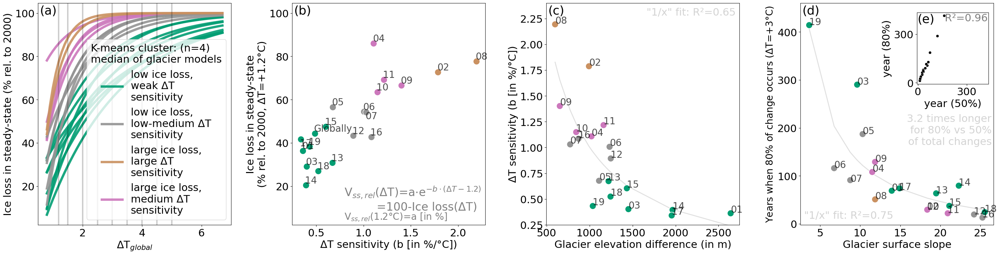

In [155]:
df['Ice loss (steady-state, ΔT=1.5°C)'] = 100-df['a_simple']
from scipy.stats import pearsonr, spearmanr
# from https://stackoverflow.com/questions/46027653/adding-labels-in-x-y-scatter-plot-with-seaborn
def plotlabel(xvar, yvar, label, ax=None):
    ax.text(xvar-0.01, yvar+1, label, alpha=0.7, fontsize=20)
    
def plotlabel_b(xvar, yvar, label, ax=None):
    ax.text(xvar-0.01, yvar-3, label, alpha=0.7, fontsize=20)
def plotlabel_c(xvar, yvar, label, ax=None):
    ax.text(xvar-0.01, yvar+0.01, label, alpha=0.7, fontsize=20)
    
    
def scatter_c(yy='resp_time_-50%_1_5_deg', xx=f'slope_weighted_vol_avg',
              xlabel=f'glacier slope (weighted after initial volume)',ylabel=None, _plotlabel=plotlabel, _plotlabel_b=plotlabel_b,
             print_spearman=True):
    ax = sns.scatterplot(data=df, y=yy, x=xx, hue='kmeans_cluster_4',
                     palette=palette_cb[:4], s=200)
    corrcoef,pval = spearmanr(df[[xx,yy]].dropna()[xx].values, df[[xx,yy]].dropna()[yy].values)
    corrcoef = corrcoef.round(2)
    if (pval <0.05) and print_spearman:
        ax.text(0.01,0.01, f'spearmanr={corrcoef}', transform=ax.transAxes, color='grey')
    print(corrcoef, pval)
    
    df.drop(index=['17','07']).apply(lambda x: _plotlabel(x[xx],x[yy], 
                                                      x['region'], ax=ax), axis=1)

    df.loc[['17', '07']].apply(lambda x: _plotlabel_b(x[xx],x[yy],
                                                        x['region'], ax=ax), axis=1)
    if ylabel is None:
        ylabel = yy

    ax.set_xlabel(xlabel, fontsize=22)
    ax.set_ylabel(ylabel)

    leg=plt.legend(title='K-means\ncluster:\n(n=4)\nmedian of glacier models',
                   loc='lower right')
    leg.remove() 
    
plt.rc('font', size=22)  

plt.figure(figsize=(30,8))

ax=plt.subplot(141)
for k in [0,1,2,3]:
    pd_sel = df.loc[df.kmeans_cluster_4 == k]
    for reg in pd_sel.region:
        pd_sel_reg = pd_sel.loc[pd_sel.region==reg]
        a,b = pd_sel_reg[['a_simple', 'b_simple']].values.squeeze()
        ax.plot(glob_temp[glob_temp>=0.8],
                100-exponential_decay(glob_temp[glob_temp>=0.8],a,b),
                label=reg,
                color=palette_cb[k],lw=5, alpha = 0.9)
handles, labels = ax.get_legend_handles_labels()
handles_l = [handles[0], handles[13],handles[18],handles[10]]
labels_long_cluster = [r'low ice loss'+',\nweak ΔT\nsensitivity', 
                       r'low ice loss'+',\nlow-medium ΔT\nsensitivity', 
                       r'large ice loss'+',\nlarge ΔT\nsensitivity',
                       r'large ice loss'+',\nmedium ΔT\nsensitivity']
ax.legend(handles_l,labels_long_cluster,
          title = 'K-means cluster: (n=4)\nmedian of glacier models', fontsize=22)        

#ax.set_ylabel(r'V$_{ss,rel}$ [in %]')
ax.set_ylabel(r'Ice loss in steady-state (% rel. to 2000)') 

ax.set_xlabel(r'ΔT$_{global}$')

ylim0,ylim1 = ax.get_ylim()
#plt.axvline(0,ls='--', alpha = 0.2,lw=3, color='black')
for T in [current_deltaT,1.5,2,2.5,3,3.5,4,4.5,5]:
    plt.axvline(T,ls='-', alpha = 0.2,lw=3, color='black')


ax1=ax

plt.subplot(142)
ax = sns.scatterplot(data=df, y='Ice loss (steady-state, ΔT=1.5°C)', x='b_simple', hue='kmeans_cluster_4',
                     palette=palette_cb[:4], s=200)
df.drop(index=['17','07']).apply(lambda x: plotlabel(x['b_simple'],  x['Ice loss (steady-state, ΔT=1.5°C)'],
                                                  x['region'], ax=ax), axis=1)

df.loc[['17', '07']].apply(lambda x: plotlabel_b(x['b_simple'],  x['Ice loss (steady-state, ΔT=1.5°C)'],
                                                    x['region'], ax=ax), axis=1)

ax.text(0.27,0.055, r'V$_{ss,rel}$(ΔT)=a$\cdot$e'+r'$^{-b\cdot(ΔT-1.2)}$'+'\n         =100-Ice loss(ΔT)',
        color='grey', fontsize=24, ha='left',transform=ax.transAxes,va='bottom')
ax.text(0.27,0.01, '\n'+r'V$_{ss,rel}$(1.2°C)=a [in %]',fontsize=20, ha='left',transform=ax.transAxes,va='bottom', color='grey')
ax.set_xlabel('ΔT sensitivity (b [in %/°C])')
ax.set_ylabel('Ice loss in steady-state\n(% rel. to 2000, ΔT=+1.2°C)') 
leg=plt.legend(title='K-means\ncluster:\n(n=4)\nmedian of glacier models',
               loc='lower right')
leg.remove()
ax.set_ylim(ylim0,ylim1)

xx = 'b_simple'
yy = 'Ice loss (steady-state, ΔT=1.5°C)'
corrcoef,pval = spearmanr(df[[xx,yy]].dropna()[xx].values, df[[xx,yy]].dropna()[yy].values)
corrcoef = corrcoef.round(2)
#if pval <0.05:
#    ax.text(0.01,0.01, f'spearmanr={corrcoef}', transform=ax.transAxes, color='grey')
print(corrcoef, pval)
#plt.subplot(122)
#ax=sns.scatterplot(data=pd_exp_decay_fits_simple_5000, x=r'V$_{eq,rel,ΔT=+1.2°C}$ [in %]', y=r'b_simple', hue='kmeans_cluster_4', palette=sns.color_palette('tab10'), s=200)
#ax.set_ylabel('b [in %/ΔT]')
#pd_exp_decay_fits_simple_5000.apply(lambda x: plotlabel(x[r'V$_{eq,rel,ΔT=+1.2°C}$ [in %]'],  x['b_simple'], x['region']), axis=1)
#plt.legend(title='K-means\ncluster:\n(n=4)', loc='upper right')

ax2=ax


# add a,b,c
num_text_x = 0.01
for j,axi in enumerate([ax1,ax2]):
    num_text_y = 0.95
    axi.text(num_text_x, num_text_y,
             num_dict[j], fontsize=26, transform=axi.transAxes)
    axi.set_ylim(ax1.get_ylim())

#plt.suptitle('Clustered after normalised exponential fit parameters (a and b)')

plt.subplot(143)
scatter_c(yy='b_simple', xx=f'elev_diff_area_weighted',
xlabel=f'Glacier elevation difference (in m)',
          ylabel='ΔT sensitivity (b [in %/°C])',print_spearman=False,
          _plotlabel=plotlabel_c, _plotlabel_b=plotlabel_c)

plt.text(num_text_x, num_text_y,
         num_dict[2], fontsize=26, transform=plt.gca().transAxes)

plt.gca().set_ylim([0.25,2.4])

# best single variable ... 
prestige_model = ols(f"b_simple ~ hyperb(elev_diff_area_weighted)",
                            data=df).fit() #.iloc[1:]

fit_sorted = prestige_model.fittedvalues.sort_values()
plt.plot(df.loc[fit_sorted.index].elev_diff_area_weighted,
         fit_sorted.values, alpha = 0.7, zorder=-1, color='lightgrey', lw=2)
plt.text(0.98,0.98,f'"1/x" fit: R²={prestige_model.rsquared.round(2)}', transform=plt.gca().transAxes, ha='right', va='top', color='lightgrey')


plt.subplot(144)
y = 'resp_time_three_deg_80'
yy='resp_time_-80%_3_0_deg'
ylabel = r'Years when 80% of change occurs ($\Delta$T=+3°C)'
xx = f'resp_time_-50%_3_0_deg'
xlabel = r'Years when 50% of change occurs ($\Delta$T=+3°C)'

scatter_c(yy=yy,xx=f'slope_weighted_area_avg',
xlabel=f'Glacier surface slope', print_spearman=False,
          ylabel=ylabel, _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)
#plt.gca().set_yticks([])
#plt.gca().set_ylabel('')
# best single variable ... 
prestige_model_1_5x = ols(f"{y} ~ hyperb(slope_weighted_area_avg)",
                            data=df).fit() #.iloc[1:]
print(prestige_model_1_5x.summary())

fit_sorted = prestige_model_1_5x.fittedvalues.sort_values()
plt.plot(df.loc[fit_sorted.index].slope_weighted_area_avg,
         fit_sorted.values,  alpha = 0.7, zorder=-1, color='lightgrey', lw=2)
plt.text(0.02,0.02,f'"1/x" fit: R²={prestige_model_1_5x.rsquared.round(2)}', transform=plt.gca().transAxes, ha='left', va='bottom', color='lightgrey')

plt.text(0.99,0.5, "3.2 times longer\nfor 80% vs 50%\nof total changes", fontsize=22,
         transform=plt.gca().transAxes, ha='right', va='top', color='lightgrey')

plt.text(num_text_x, num_text_y,
         num_dict[3], fontsize=26, transform=plt.gca().transAxes)


plt.ylim([-2,460])

plt.ylabel(ylabel, fontsize=20)
ax = plt.gca()
inset_ax = inset_axes(ax,
                    width="37%", # width = 30% of parent_bbox
                    height="36%", # height : 1 inch
                    loc='upper right',
                    #bbox_to_anchor=(1, 0.9, 0, 0),
                       )
#inset_ax.set_title(' t\n t', alpha =0)
sns.scatterplot(df,y=yy,x=xx,ax=inset_ax, color='black')
inset_ax.set_xlabel('year (50%)')
inset_ax.set_ylabel('year (80%)') 
#_plotlabel=plotlabel, _plotlabel_b=plotlabel_b)
inset_ax.text(num_text_x, num_text_y*0.9,
         num_dict[4], fontsize=26, transform=inset_ax.transAxes)

plt.text(0.99, 0.99,
         'R²=0.96', fontsize=22, color='grey', va='top', ha='right',
         transform=inset_ax.transAxes)
#plt.ylim([-2,840])
#inset_ax.grid(alpha=0.5)

inset_ax.set_aspect('equal')
ylim0,ylim1 = inset_ax.get_ylim()
xlim0,xlim1 = inset_ax.get_xlim()
lim0 = min(ylim0, xlim0)
lim1 = max(ylim1, xlim1)
inset_ax.set_xlim([lim0, lim1])
inset_ax.set_ylim([lim0, lim1])

inset_ax.set_xticks(np.arange(0,lim1,300))
inset_ax.set_yticks(np.arange(0,lim1,300))

plt.tight_layout()
plt.savefig(f'figures/3_k_means_clustering/a_b_resp_time_rel_important_features_scatter_plot.pdf')

In [150]:
df.columns

Index(['rgi_reg', 'year', 'a_simple', 'b_simple', 'a_simple_norm',
       'b_simple_norm', 'kmeans_cluster_4', 'V$_{eq,rel,ΔT=+2°C}$ [in %]',
       'ΔT(V$_{eq,rel}=\frac{a}{2}$) [in °C]', 'region',
       'resp_time_-50%_1_5_deg', 'resp_time_-50%_3_0_deg',
       'resp_time_-80%_1_5_deg', 'resp_time_-90%_1_5_deg',
       'resp_time_-80%_3_0_deg', 'resp_time_-90%_3_0_deg',
       'temp_ch_avg_2000-2019_vs_1901-1920',
       'temp_ch_avg_1986-2005_vs_1901-1920',
       'temp_ch_avg_1995-2014_vs_1901-1920', 'temp_avg_2000-2019',
       'prcp_avg_2000-2019', 'continentality_index_avg_2000-2019',
       'temp_avg_1981-2000', 'prcp_avg_1981-2000',
       'continentality_index_avg_1981-2000', 'temp_avg_1995-2014',
       'prcp_avg_1995-2014', 'continentality_index_avg_1995-2014',
       'median_reg_vs_glob_ch',
       'median_reg_vs_glob_temp_ch_above_zero_eight_deg',
       'slope_fit_reg_vs_glob_ch', 'slope_weighted_vol_avg',
       'slope_weighted_area_avg', 'lat_absolute_weighted_area_av

-0.84 4.074490008859048e-06
-0.85 4.681087721120231e-06
-0.89 3.973316985545687e-07
                                 OLS Regression Results                                
Dep. Variable:     resp_time_one_o_five_deg_80   R-squared:                       0.841
Model:                                     OLS   Adj. R-squared:                  0.831
Method:                          Least Squares   F-statistic:                     89.73
Date:                         Fri, 24 Nov 2023   Prob (F-statistic):           3.41e-08
Time:                                 10:30:26   Log-Likelihood:                -108.62
No. Observations:                           19   AIC:                             221.2
Df Residuals:                               17   BIC:                             223.1
Df Model:                                    1                                         
Covariance Type:                     nonrobust                                         
                                    

/home/users/lschuster/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1769: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=19
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


0.98 7.06769744556743e-13


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


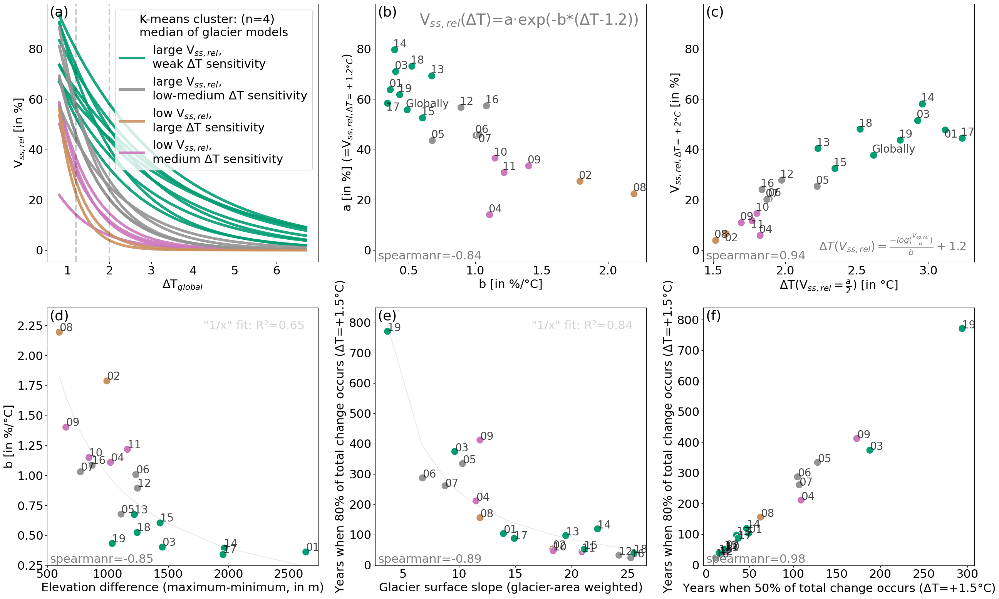

In [64]:
from scipy.stats import pearsonr, spearmanr
# from https://stackoverflow.com/questions/46027653/adding-labels-in-x-y-scatter-plot-with-seaborn
def plotlabel(xvar, yvar, label, ax=None):
    ax.text(xvar-0.01, yvar+1, label, alpha=0.7, fontsize=20)
    
def plotlabel_b(xvar, yvar, label, ax=None):
    ax.text(xvar-0.01, yvar-3, label, alpha=0.7, fontsize=20)
def plotlabel_c(xvar, yvar, label, ax=None):
    ax.text(xvar-0.01, yvar+0.01, label, alpha=0.7, fontsize=20)
    
    
def scatter_c(yy='resp_time_-50%_1_5_deg', xx=f'slope_weighted_vol_avg',
              xlabel=f'glacier slope (weighted after initial volume)',ylabel=None, _plotlabel=plotlabel, _plotlabel_b=plotlabel_b):
    ax = sns.scatterplot(data=df, y=yy, x=xx, hue='kmeans_cluster_4',
                     palette=palette_cb[:4], s=200)
    corrcoef,pval = spearmanr(df[[xx,yy]].dropna()[xx].values, df[[xx,yy]].dropna()[yy].values)
    corrcoef = corrcoef.round(2)
    if pval <0.05:
        ax.text(0.01,0.01, f'spearmanr={corrcoef}', transform=ax.transAxes, color='grey')
    print(corrcoef, pval)
    
    df.drop(index=['17','07']).apply(lambda x: _plotlabel(x[xx],x[yy], 
                                                      x['region'], ax=ax), axis=1)

    df.loc[['17', '07']].apply(lambda x: _plotlabel_b(x[xx],x[yy],
                                                        x['region'], ax=ax), axis=1)
    if ylabel is None:
        ylabel = yy

    ax.set_xlabel(xlabel, fontsize=22)
    ax.set_ylabel(ylabel)

    leg=plt.legend(title='K-means\ncluster:\n(n=4)\nmedian of glacier models',
                   loc='lower right')
    leg.remove() 
    
plt.rc('font', size=22)  

plt.figure(figsize=(26,16))

ax=plt.subplot(231)
for k in [0,1,2,3]:
    pd_sel = df.loc[df.kmeans_cluster_4 == k]
    for reg in pd_sel.region:
        pd_sel_reg = pd_sel.loc[pd_sel.region==reg]
        a,b = pd_sel_reg[['a_simple', 'b_simple']].values.squeeze()
        ax.plot(glob_temp[glob_temp>=0.8],
                exponential_decay(glob_temp[glob_temp>=0.8],a,b),
                label=reg,
                color=palette_cb[k],lw=5, alpha = 0.9)
handles, labels = ax.get_legend_handles_labels()
handles_l = [handles[0], handles[13],handles[18],handles[10]]
labels_long_cluster = [r'large V$_{ss,rel}$'+',\nweak ΔT sensitivity', 
                       r'large V$_{ss,rel}$'+',\nlow-medium ΔT sensitivity', 
                       r'low V$_{ss,rel}$'+',\nlarge ΔT sensitivity',
                       r'low V$_{ss,rel}$'+',\nmedium ΔT sensitivity']
ax.legend(handles_l,labels_long_cluster,
          title = 'K-means cluster: (n=4)\nmedian of glacier models')        

ax.set_ylabel(r'V$_{ss,rel}$ [in %]')
ax.set_xlabel(r'ΔT$_{global}$')

ylim0,ylim1 = ax.get_ylim()
#plt.axvline(0,ls='--', alpha = 0.2,lw=3, color='black')

plt.axvline(current_deltaT,ls='--', alpha = 0.2,lw=3, color='black')
plt.axvline(2,ls='--', alpha = 0.2,lw=3, color='black')

ax1=ax

plt.subplot(232)
ax = sns.scatterplot(data=df, y='a_simple', x='b_simple', hue='kmeans_cluster_4',
                     palette=palette_cb[:4], s=200)
df.drop(index=['17','07']).apply(lambda x: plotlabel(x['b_simple'],  x['a_simple'],
                                                  x['region'], ax=ax), axis=1)

df.loc[['17', '07']].apply(lambda x: plotlabel_b(x['b_simple'],  x['a_simple'],
                                                    x['region'], ax=ax), axis=1)

ax.text(0.97,0.92, r'V$_{ss,rel}$(ΔT)=a$\cdot$exp(-b*(ΔT-1.2))', color='grey', fontsize=28, ha='right',transform=ax.transAxes)
ax.set_xlabel('b [in %/°C]')
ax.set_ylabel(r'a [in %] (=V$_{ss,rel,ΔT=+1.2°C}$)')
leg=plt.legend(title='K-means\ncluster:\n(n=4)\nmedian of glacier models',
               loc='lower right')
leg.remove()
ax.set_ylim(ylim0,ylim1)

xx = 'b_simple'
yy = 'a_simple'
corrcoef,pval = spearmanr(df[[xx,yy]].dropna()[xx].values, df[[xx,yy]].dropna()[yy].values)
corrcoef = corrcoef.round(2)
if pval <0.05:
    ax.text(0.01,0.01, f'spearmanr={corrcoef}', transform=ax.transAxes, color='grey')
print(corrcoef, pval)
#plt.subplot(122)
#ax=sns.scatterplot(data=pd_exp_decay_fits_simple_5000, x=r'V$_{eq,rel,ΔT=+1.2°C}$ [in %]', y=r'b_simple', hue='kmeans_cluster_4', palette=sns.color_palette('tab10'), s=200)
#ax.set_ylabel('b [in %/ΔT]')
#pd_exp_decay_fits_simple_5000.apply(lambda x: plotlabel(x[r'V$_{eq,rel,ΔT=+1.2°C}$ [in %]'],  x['b_simple'], x['region']), axis=1)
#plt.legend(title='K-means\ncluster:\n(n=4)', loc='upper right')

ax2=ax

plt.subplot(233)
ax=sns.scatterplot(data=df, y=r'V$_{eq,rel,ΔT=+2°C}$ [in %]',
                   x=r'ΔT(V$_{eq,rel}=\frac{a}{2}$) [in °C]',
                   hue='kmeans_cluster_4',
                   palette=palette_cb[:4], s=200)
df.drop(index=['02','11','01']).apply(lambda x: plotlabel(x[r'ΔT(V$_{eq,rel}=\frac{a}{2}$) [in °C]'],
                             x[r'V$_{eq,rel,ΔT=+2°C}$ [in %]'],  x['region'], ax=ax), axis=1)

df.loc[['02', '11', '01']].apply(lambda x: plotlabel_b(x[r'ΔT(V$_{eq,rel}=\frac{a}{2}$) [in °C]'],
                             x[r'V$_{eq,rel,ΔT=+2°C}$ [in %]'],  x['region'], ax=ax), axis=1)

ax.text(0.97,0.02, r'$ΔT(V_{ss,rel}) = \frac{-log(\frac{V_{eq,rel}}{a})}{b} +1.2$',
        transform=ax.transAxes, color='grey', ha='right',va='bottom',fontsize=22)

leg = plt.legend(title='K-means\ncluster:\n(n=4)', loc='upper left')
leg.remove()
ax.set_xlabel(r'ΔT(V$_{ss,rel}=\frac{a}{2}$) [in °C]')
ax.set_ylabel(r'V$_{ss,rel,ΔT=+2°C}$ [in %]')

xx = r'ΔT(V$_{eq,rel}=\frac{a}{2}$) [in °C]'
yy = r'V$_{eq,rel,ΔT=+2°C}$ [in %]'
corrcoef,pval = spearmanr(df[[xx,yy]].dropna()[xx].values, df[[xx,yy]].dropna()[yy].values)
corrcoef = corrcoef.round(2)
if pval <0.05:
    ax.text(0.01,0.01, f'spearmanr={corrcoef}', transform=ax.transAxes, color='grey')

ax3=ax

# add a,b,c
num_text_x = 0.01
for j,axi in enumerate([ax1,ax2,ax3]):
    num_text_y = 0.95
    axi.text(num_text_x, num_text_y,
             num_dict[j], fontsize=26, transform=axi.transAxes)
    axi.set_ylim(ax1.get_ylim())

#plt.suptitle('Clustered after normalised exponential fit parameters (a and b)')

plt.subplot(234)
scatter_c(yy='b_simple', xx=f'elev_diff_area_weighted',
xlabel=f'Elevation difference (maximum-minimum, in m)',
          ylabel='b [in %/°C]',
          _plotlabel=plotlabel_c, _plotlabel_b=plotlabel_c)

plt.text(num_text_x, num_text_y,
         num_dict[3], fontsize=26, transform=plt.gca().transAxes)

plt.gca().set_ylim([0.25,2.4])

# best single variable ... 
prestige_model = ols(f"b_simple ~ hyperb(elev_diff_area_weighted)",
                            data=df.iloc[1:]).fit()

fit_sorted = prestige_model.fittedvalues.sort_values()
plt.plot(df.loc[fit_sorted.index].elev_diff_area_weighted,
         fit_sorted.values, alpha = 0.5, zorder=-1, color='lightgrey')
plt.text(0.95,0.95,f'"1/x" fit: R²={prestige_model.rsquared.round(2)}', transform=plt.gca().transAxes, ha='right', va='top', color='lightgrey')



plt.subplot(235)
y = 'resp_time_one_o_five_deg_80'
yy='resp_time_-80%_1_5_deg'
ylabel = r'Years when 80% of total change occurs ($\Delta$T=+1.5°C)'
xx = f'resp_time_-50%_1_5_deg'
xlabel = r'Years when 50% of total change occurs ($\Delta$T=+1.5°C)'

scatter_c(yy=yy,xx=f'slope_weighted_area_avg',
xlabel=f'Glacier surface slope (glacier-area weighted)',
          ylabel=ylabel, _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)
#plt.gca().set_yticks([])
#plt.gca().set_ylabel('')
# best single variable ... 
prestige_model_1_5x = ols(f"{y} ~ hyperb(slope_weighted_area_avg)",
                            data=df.iloc[1:]).fit()
print(prestige_model_1_5x.summary())

fit_sorted = prestige_model_1_5x.fittedvalues.sort_values()
plt.plot(df.loc[fit_sorted.index].slope_weighted_area_avg,
         fit_sorted.values,  alpha = 0.5, zorder=-1, color='lightgrey')
plt.text(0.95,0.95,f'"1/x" fit: R²={prestige_model_1_5x.rsquared.round(2)}', transform=plt.gca().transAxes, ha='right', va='top', color='lightgrey')

plt.text(num_text_x, num_text_y,
         num_dict[4], fontsize=26, transform=plt.gca().transAxes)
plt.ylim([-2,850])

plt.subplot(236)

scatter_c(yy=yy,xx=xx,
          xlabel=xlabel,
          ylabel=ylabel, _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)
plt.text(num_text_x, num_text_y,
         num_dict[5], fontsize=26, transform=plt.gca().transAxes)
plt.ylim([-2,840])

plt.tight_layout()
#plt.savefig(f'figures/3_k_means_clustering/a_b_rel_important_features_scatter_plot.png')

-0.8 2.2102293198501752e-05
0.92 9.964349001965859e-09
0.69 0.0010913833347078765
-0.85 4.681087721120231e-06
-0.61 0.005671632847476745


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


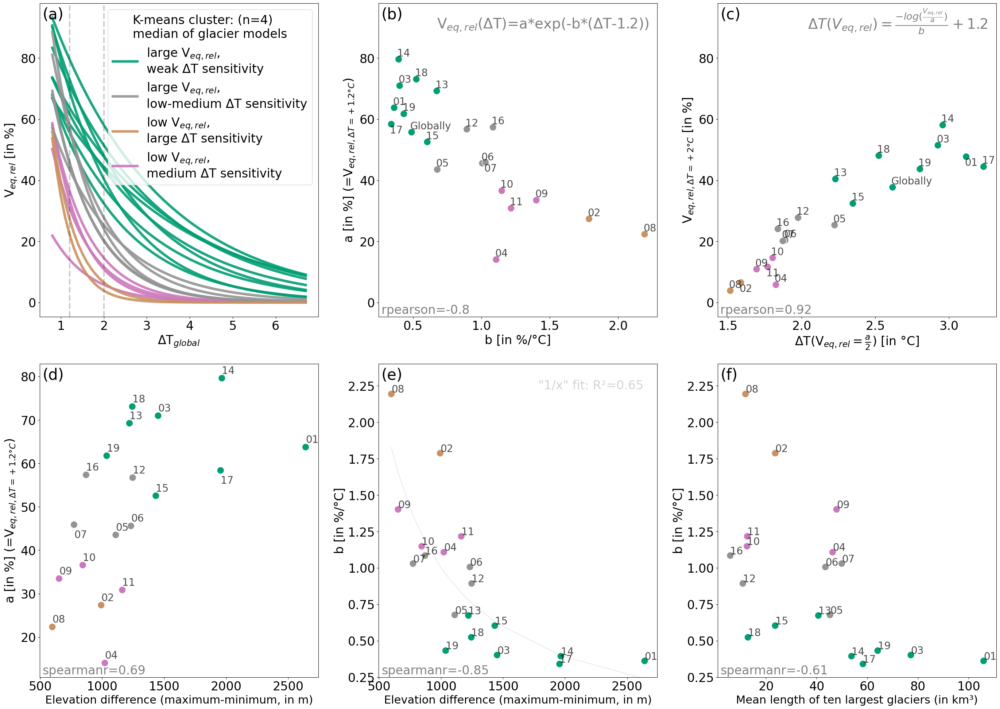

In [65]:
from scipy.stats import pearsonr, spearmanr
# from https://stackoverflow.com/questions/46027653/adding-labels-in-x-y-scatter-plot-with-seaborn
def plotlabel(xvar, yvar, label, ax=None):
    ax.text(xvar-0.01, yvar+1, label, alpha=0.7, fontsize=20)
    
def plotlabel_b(xvar, yvar, label, ax=None):
    ax.text(xvar-0.01, yvar-3, label, alpha=0.7, fontsize=20)
def plotlabel_c(xvar, yvar, label, ax=None):
    ax.text(xvar-0.01, yvar+0.01, label, alpha=0.7, fontsize=20)
    
    
def scatter_c(yy='resp_time_-50%_1_5_deg', xx=f'slope_weighted_vol_avg',
              xlabel=f'glacier slope (weighted after initial volume)',ylabel=None, _plotlabel=plotlabel, _plotlabel_b=plotlabel_b):
    ax = sns.scatterplot(data=df, y=yy, x=xx, hue='kmeans_cluster_4',
                     palette=palette_cb[:4], s=200)
    corrcoef,pval = spearmanr(df[[xx,yy]].dropna()[xx].values, df[[xx,yy]].dropna()[yy].values)
    corrcoef = corrcoef.round(2)
    if pval <0.05:
        ax.text(0.01,0.01, f'spearmanr={corrcoef}', transform=ax.transAxes, color='grey')
    print(corrcoef, pval)
    
    df.drop(index=['17','07']).apply(lambda x: _plotlabel(x[xx],x[yy], 
                                                      x['region'], ax=ax), axis=1)

    df.loc[['17', '07']].apply(lambda x: _plotlabel_b(x[xx],x[yy],
                                                        x['region'], ax=ax), axis=1)
    if ylabel is None:
        ylabel = yy

    ax.set_xlabel(xlabel, fontsize=22)
    ax.set_ylabel(ylabel)

    leg=plt.legend(title='K-means\ncluster:\n(n=4)\nmedian of glacier models',
                   loc='lower right')
    leg.remove() 
    
plt.rc('font', size=24)  

plt.figure(figsize=(28,20))

ax=plt.subplot(231)
for k in [0,1,2,3]:
    pd_sel = df.loc[df.kmeans_cluster_4 == k]
    for reg in pd_sel.region:
        pd_sel_reg = pd_sel.loc[pd_sel.region==reg]
        a,b = pd_sel_reg[['a_simple', 'b_simple']].values.squeeze()
        ax.plot(glob_temp[glob_temp>=0.8],
                exponential_decay(glob_temp[glob_temp>=0.8],a,b),
                label=reg,
                color=palette_cb[k],lw=5, alpha = 0.9)
handles, labels = ax.get_legend_handles_labels()
handles_l = [handles[0], handles[13],handles[18],handles[10]]
labels_long_cluster = [r'large V$_{eq,rel}$'+',\nweak ΔT sensitivity', 
                       r'large V$_{eq,rel}$'+',\nlow-medium ΔT sensitivity', 
                       r'low V$_{eq,rel}$'+',\nlarge ΔT sensitivity',
                       r'low V$_{eq,rel}$'+',\nmedium ΔT sensitivity']
ax.legend(handles_l,labels_long_cluster,
          title = 'K-means cluster: (n=4)\nmedian of glacier models')        

ax.set_ylabel(r'V$_{eq,rel}$ [in %]')
ax.set_xlabel(r'ΔT$_{global}$')

ylim0,ylim1 = ax.get_ylim()
#plt.axvline(0,ls='--', alpha = 0.2,lw=3, color='black')

plt.axvline(current_deltaT,ls='--', alpha = 0.2,lw=3, color='black')
plt.axvline(2,ls='--', alpha = 0.2,lw=3, color='black')

ax1=ax

plt.subplot(232)
ax = sns.scatterplot(data=df, y='a_simple', x='b_simple', hue='kmeans_cluster_4',
                     palette=palette_cb[:4], s=200)
df.drop(index=['17','07']).apply(lambda x: plotlabel(x['b_simple'],  x['a_simple'],
                                                  x['region'], ax=ax), axis=1)

df.loc[['17', '07']].apply(lambda x: plotlabel_b(x['b_simple'],  x['a_simple'],
                                                    x['region'], ax=ax), axis=1)

ax.text(0.97,0.92, r'V$_{eq,rel}$(ΔT)=a*exp(-b*(ΔT-1.2))', color='grey', fontsize=28, ha='right',transform=ax.transAxes)
ax.set_xlabel('b [in %/°C]')
ax.set_ylabel(r'a [in %] (=V$_{eq,rel,ΔT=+1.2°C}$)')
leg=plt.legend(title='K-means\ncluster:\n(n=4)\nmedian of glacier models',
               loc='lower right')
leg.remove()
ax.set_ylim(ylim0,ylim1)

xx = 'b_simple'
yy = 'a_simple'
corrcoef,pval = pearsonr(df[[xx,yy]].dropna()[xx].values, df[[xx,yy]].dropna()[yy].values)
corrcoef = corrcoef.round(2)
if pval <0.05:
    ax.text(0.01,0.01, f'rpearson={corrcoef}', transform=ax.transAxes, color='grey')
print(corrcoef, pval)
#plt.subplot(122)
#ax=sns.scatterplot(data=pd_exp_decay_fits_simple_5000, x=r'V$_{eq,rel,ΔT=+1.2°C}$ [in %]', y=r'b_simple', hue='kmeans_cluster_4', palette=sns.color_palette('tab10'), s=200)
#ax.set_ylabel('b [in %/ΔT]')
#pd_exp_decay_fits_simple_5000.apply(lambda x: plotlabel(x[r'V$_{eq,rel,ΔT=+1.2°C}$ [in %]'],  x['b_simple'], x['region']), axis=1)
#plt.legend(title='K-means\ncluster:\n(n=4)', loc='upper right')

ax2=ax

plt.subplot(233)
ax=sns.scatterplot(data=df, y=r'V$_{eq,rel,ΔT=+2°C}$ [in %]',
                   x=r'ΔT(V$_{eq,rel}=\frac{a}{2}$) [in °C]',
                   hue='kmeans_cluster_4',
                   palette=palette_cb[:4], s=200)
df.drop(index=['02','11','01']).apply(lambda x: plotlabel(x[r'ΔT(V$_{eq,rel}=\frac{a}{2}$) [in °C]'],
                             x[r'V$_{eq,rel,ΔT=+2°C}$ [in %]'],  x['region'], ax=ax), axis=1)

df.loc[['02', '11', '01']].apply(lambda x: plotlabel_b(x[r'ΔT(V$_{eq,rel}=\frac{a}{2}$) [in °C]'],
                             x[r'V$_{eq,rel,ΔT=+2°C}$ [in %]'],  x['region'], ax=ax), axis=1)

ax.text(0.97,0.92, r'$ΔT(V_{eq,rel}) = \frac{-log(\frac{V_{eq,rel}}{a})}{b} +1.2$',
        transform=ax.transAxes, color='grey', ha='right',fontsize=28)

leg = plt.legend(title='K-means\ncluster:\n(n=4)', loc='upper left')
leg.remove()
ax.set_xlabel(r'ΔT(V$_{eq,rel}=\frac{a}{2}$) [in °C]')


xx = r'ΔT(V$_{eq,rel}=\frac{a}{2}$) [in °C]'
yy = r'V$_{eq,rel,ΔT=+2°C}$ [in %]'
corrcoef,pval = pearsonr(df[[xx,yy]].dropna()[xx].values, df[[xx,yy]].dropna()[yy].values)
corrcoef = corrcoef.round(2)
if pval <0.05:
    ax.text(0.01,0.01, f'rpearson={corrcoef}', transform=ax.transAxes, color='grey')
print(corrcoef, pval)


ax3=ax

# add a,b,c
num_text_x = 0.01
for j,axi in enumerate([ax1,ax2,ax3]):
    num_text_y = 0.95
    axi.text(num_text_x, num_text_y,
             num_dict[j], fontsize=30, transform=axi.transAxes)
    axi.set_ylim(ax1.get_ylim())

#plt.suptitle('Clustered after normalised exponential fit parameters (a and b)')

plt.subplot(2,3,4)
scatter_c(yy='a_simple', xx=f'elev_diff_area_weighted',
              xlabel=f'Elevation difference (maximum-minimum, in m)',
          ylabel=r'a [in %] (=V$_{eq,rel,ΔT=+1.2°C}$)',
          _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)

plt.text(num_text_x, num_text_y,
         num_dict[3], fontsize=30, transform=plt.gca().transAxes)

plt.subplot(235)
scatter_c(yy='b_simple', xx=f'elev_diff_area_weighted',
xlabel=f'Elevation difference (maximum-minimum, in m)',
          ylabel='b [in %/°C]',
          _plotlabel=plotlabel_c, _plotlabel_b=plotlabel_c)

plt.text(num_text_x, num_text_y,
         num_dict[4], fontsize=30, transform=plt.gca().transAxes)

plt.gca().set_ylim([0.25,2.4])

# best single variable ... 
prestige_model = ols(f"b_simple ~ hyperb(elev_diff_area_weighted)",
                            data=df.iloc[1:]).fit()

fit_sorted = prestige_model.fittedvalues.sort_values()
plt.plot(df.loc[fit_sorted.index].elev_diff_area_weighted,
         fit_sorted.values, alpha = 0.5, zorder=-1, color='lightgrey')
plt.text(0.95,0.95,f'"1/x" fit: R²={prestige_model.rsquared.round(2)}', transform=plt.gca().transAxes, ha='right', va='top', color='lightgrey')

plt.subplot(236)
scatter_c(yy='b_simple', xx=f'mean_len_ten_largest_glac',
xlabel=f'Mean length of ten largest glaciers (in km³)',
          ylabel='b [in %/°C]',
          _plotlabel=plotlabel_c, _plotlabel_b=plotlabel_c)

plt.text(num_text_x, num_text_y,
         num_dict[5], fontsize=30, transform=plt.gca().transAxes)
plt.gca().set_ylim([0.25,2.4])

plt.tight_layout()
plt.savefig(f'figures/3_k_means_clustering/a_b_rel_important_features_scatter_plot.png')

#### for response time 

In [66]:
def exp(x):
    return np.exp(x)

0.88 5.097789186801282e-07
0.87 1.1499032544900439e-06
-0.91 9.969532246511429e-08
                               OLS Regression Results                               
Dep. Variable:     resp_time_one_o_five_deg   R-squared:                       0.771
Model:                                  OLS   Adj. R-squared:                  0.758
Method:                       Least Squares   F-statistic:                     57.28
Date:                      Fri, 24 Nov 2023   Prob (F-statistic):           7.70e-07
Time:                              13:09:32   Log-Likelihood:                -94.656
No. Observations:                        19   AIC:                             193.3
Df Residuals:                            17   BIC:                             195.2
Df Model:                                 1                                         
Covariance Type:                  nonrobust                                         
                                      coef    std err          t   

/home/users/lschuster/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1769: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=19
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
/home/users/lschuster/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1769: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=19
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


0.88 5.7571653259752e-07
0.82 1.6458315542988976e-05
-0.89 3.973316985545687e-07
                                 OLS Regression Results                                
Dep. Variable:     resp_time_one_o_five_deg_80   R-squared:                       0.841
Model:                                     OLS   Adj. R-squared:                  0.831
Method:                          Least Squares   F-statistic:                     89.73
Date:                         Fri, 24 Nov 2023   Prob (F-statistic):           3.41e-08
Time:                                 13:09:33   Log-Likelihood:                -108.62
No. Observations:                           19   AIC:                             221.2
Df Residuals:                               17   BIC:                             223.1
Df Model:                                    1                                         
Covariance Type:                     nonrobust                                         
                                      c

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


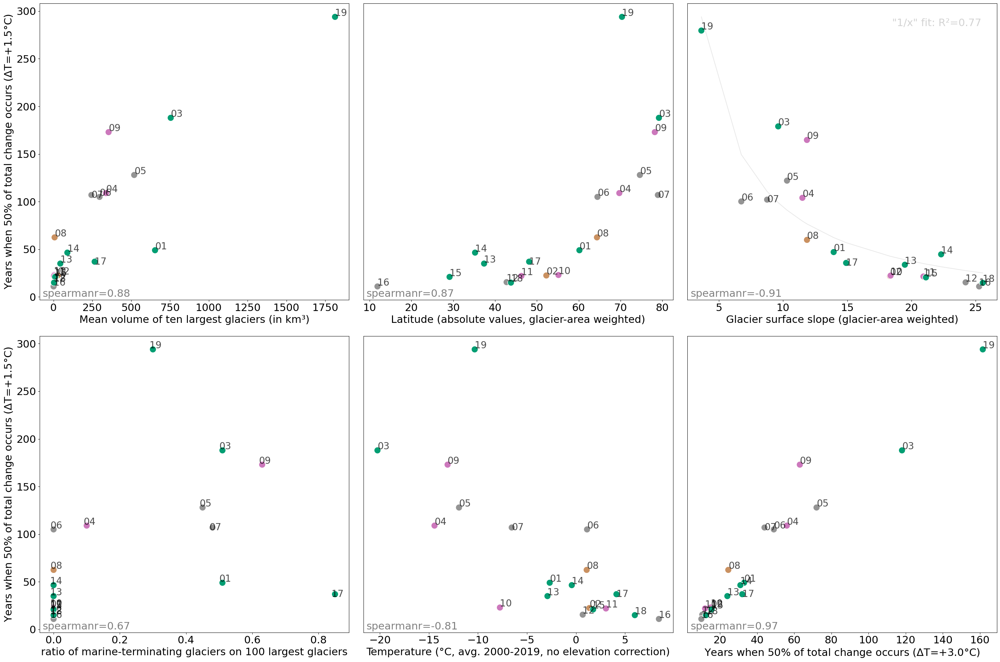

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


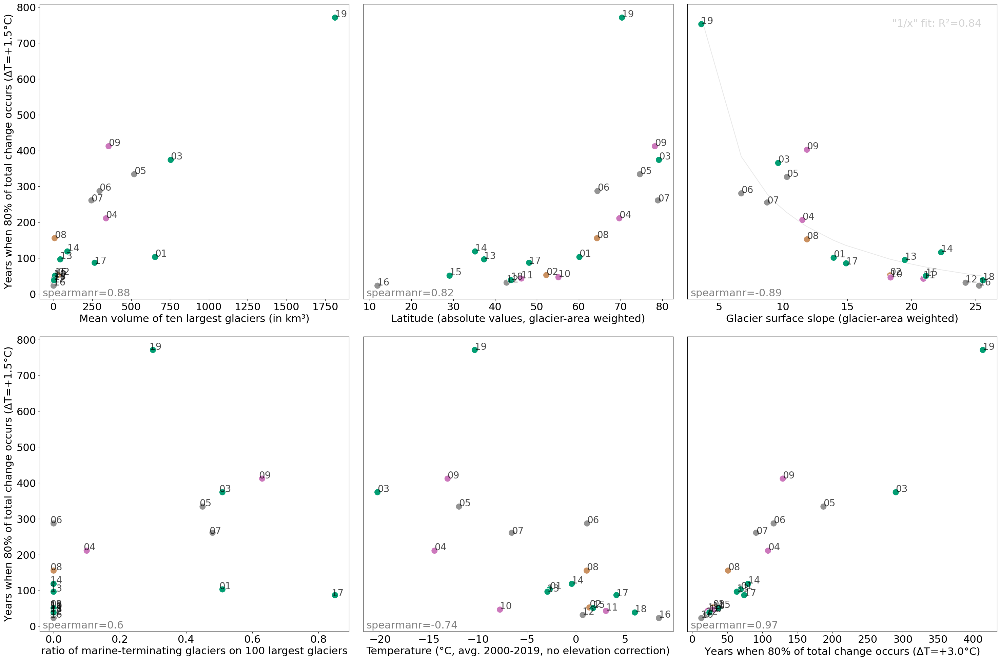

In [148]:
for yy,y in zip(['resp_time_-50%_1_5_deg','resp_time_-80%_1_5_deg'], #,'resp_time_-90%_1_5_deg'
            ['resp_time_one_o_five_deg','resp_time_one_o_five_deg_80']): #,'resp_time_one_o_five_deg_90'

    if yy ==  'resp_time_-50%_1_5_deg':
        ylabel = r'Years when 50% of total change occurs ($\Delta$T=+1.5°C)'
        xx = f'resp_time_-50%_3_0_deg'
        xlabel = r'Years when 50% of total change occurs ($\Delta$T=+3.0°C)'
    elif yy ==  'resp_time_-80%_1_5_deg':
        ylabel = r'Years when 80% of total change occurs ($\Delta$T=+1.5°C)'
        xx = f'resp_time_-80%_3_0_deg'
        xlabel = r'Years when 80% of total change occurs ($\Delta$T=+3.0°C)'
        
    plt.figure(figsize=(30,20))


    plt.subplot(2,3,1)
    # similar but slightly worse correlations wth mean_area_ten_largest_glac, mean_len_ten_largest_glac
    scatter_c(yy=yy,xx=f'mean_vol_ten_largest_glac',
    xlabel=f'Mean volume of ten largest glaciers (in km³)',
            ylabel=ylabel,
              _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)
    
    plt.subplot(2,3,2)
    # latitude is highly correlated to minimum and max elevation, but latitude correlates slightly better 
    scatter_c(yy=yy, xx=f'lat_absolute_weighted_area_avg',
                  xlabel=f'Latitude (absolute values, glacier-area weighted)',ylabel=None, _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)
    plt.gca().set_yticks([])
    plt.gca().set_ylabel('')

    plt.subplot(2,3,3)
    scatter_c(yy=yy,xx=f'slope_weighted_area_avg',
    xlabel=f'Glacier surface slope (glacier-area weighted)',
              ylabel=None, _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)
    plt.gca().set_yticks([])
    plt.gca().set_ylabel('')

    # best single variable ... 
    prestige_model_1_5x = ols(f"{y} ~ hyperb(slope_weighted_area_avg)",
                                data=df.iloc[1:]).fit()
    print(prestige_model_1_5x.summary())

    fit_sorted = prestige_model_1_5x.fittedvalues.sort_values()
    plt.plot(df.loc[fit_sorted.index].slope_weighted_area_avg,
             fit_sorted.values,  alpha = 0.5, zorder=-1, color='lightgrey')
    plt.text(0.95,0.95,f'"1/x" fit: R²={prestige_model_1_5x.rsquared.round(2)}', transform=plt.gca().transAxes, ha='right', va='top', color='lightgrey')

    plt.subplot(2,3,4)

    scatter_c(yy=yy, xx='marine_term_ratio_hundredlargest_glac',
              xlabel='ratio of marine-terminating glaciers on 100 largest glaciers',
              ylabel=ylabel, _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)

    plt.subplot(2,3,5)
    scatter_c(yy=yy, xx=f'temp_avg_2000-2019',
                  xlabel=f'Temperature (°C, avg. 2000-2019, no elevation correction)',ylabel=None,
              _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)
    plt.gca().set_yticks([])
    plt.gca().set_ylabel('')

    plt.subplot(2,3,6)

    scatter_c(yy=yy, xx=xx,
                  xlabel=xlabel,ylabel=None, _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)
    plt.gca().set_yticks([])
    plt.gca().set_ylabel('')
    plt.tight_layout()
    plt.savefig(f'figures/3_k_means_clustering/{yy}_rel_important_features_scatter_plot.png')

0.87 1.4290128393433576e-06
0.8 3.664141350706946e-05
-0.87 1.282882355111214e-06
0.58 0.009633158594749117
-0.73 0.0003534246381327732
0.96 5.862028167722586e-11


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


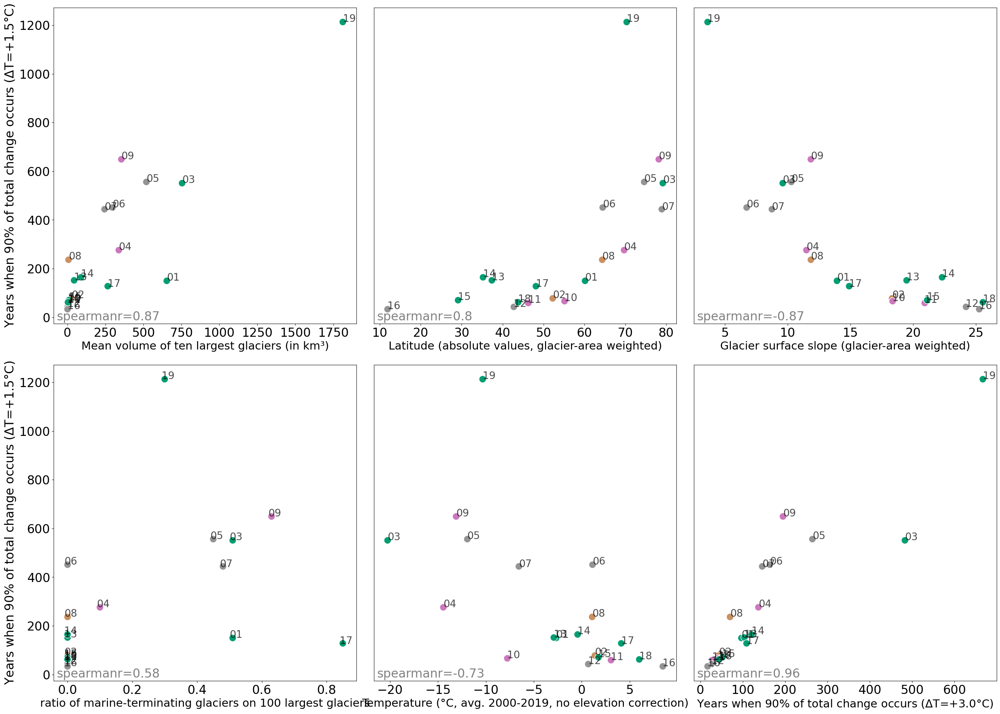

In [68]:
for yy,y in zip(['resp_time_-90%_1_5_deg'],
            ['resp_time_one_o_five_deg_90']):

    if yy ==  'resp_time_-50%_1_5_deg':
        ylabel = r'Years when 50% of total change occurs ($\Delta$T=+1.5°C)'
        xx = f'resp_time_-50%_3_0_deg'
        xlabel = r'Years when 50% of total change occurs ($\Delta$T=+3.0°C)'
    elif yy ==  'resp_time_-80%_1_5_deg':
        ylabel = r'Years when 80% of total change occurs ($\Delta$T=+1.5°C)'
        xx = f'resp_time_-80%_3_0_deg'
        xlabel = r'Years when 80% of total change occurs ($\Delta$T=+3.0°C)'
    elif yy ==  'resp_time_-90%_1_5_deg':
        ylabel = r'Years when 90% of total change occurs ($\Delta$T=+1.5°C)'
        xx = f'resp_time_-90%_3_0_deg'
        xlabel = r'Years when 90% of total change occurs ($\Delta$T=+3.0°C)'
        
    plt.figure(figsize=(28,20))


    plt.subplot(2,3,1)
    # similar but slightly worse correlations wth mean_area_ten_largest_glac, mean_len_ten_largest_glac
    scatter_c(yy=yy,xx=f'mean_vol_ten_largest_glac',
    xlabel=f'Mean volume of ten largest glaciers (in km³)',
            ylabel=ylabel,
              _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)
    
    plt.subplot(2,3,2)
    # latitude is highly correlated to minimum and max elevation, but latitude correlates slightly better 
    scatter_c(yy=yy, xx=f'lat_absolute_weighted_area_avg',
                  xlabel=f'Latitude (absolute values, glacier-area weighted)',ylabel=None, _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)
    plt.gca().set_yticks([])
    plt.gca().set_ylabel('')

    plt.subplot(2,3,3)
    scatter_c(yy=yy,xx=f'slope_weighted_area_avg',
    xlabel=f'Glacier surface slope (glacier-area weighted)',
              ylabel=None, _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)
    plt.gca().set_yticks([])
    plt.gca().set_ylabel('')
    if yy !=  'resp_time_-90%_1_5_deg':
        # best single variable ... 
        prestige_model_1_5x = ols(f"{y} ~ hyperb(slope_weighted_area_avg)",
                                    data=df.iloc[1:]).fit()
        print(prestige_model_1_5x.summary())

        fit_sorted = prestige_model_1_5x.fittedvalues.sort_values()
        plt.plot(df.loc[fit_sorted.index].slope_weighted_area_avg,
                 fit_sorted.values,  alpha = 0.5, zorder=-1, color='lightgrey')
        plt.text(0.95,0.95,f'"1/x" fit: R²={prestige_model_1_5x.rsquared.round(2)}', transform=plt.gca().transAxes, ha='right', va='top', color='lightgrey')

    plt.subplot(2,3,4)

    scatter_c(yy=yy, xx='marine_term_ratio_hundredlargest_glac',
              xlabel='ratio of marine-terminating glaciers on 100 largest glaciers',
              ylabel=ylabel, _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)

    plt.subplot(2,3,5)
    scatter_c(yy=yy, xx=f'temp_avg_2000-2019',
                  xlabel=f'Temperature (°C, avg. 2000-2019, no elevation correction)',ylabel=None,
              _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)
    plt.gca().set_yticks([])
    plt.gca().set_ylabel('')

    plt.subplot(2,3,6)

    scatter_c(yy=yy, xx=xx,
                  xlabel=xlabel,ylabel=None, _plotlabel=plotlabel, _plotlabel_b=plotlabel_b)
    plt.gca().set_yticks([])
    plt.gca().set_ylabel('')
    plt.tight_layout()
    plt.savefig(f'figures/3_k_means_clustering/{yy}_rel_important_features_scatter_plot.png')

# OLD

### Pie-charts

In [511]:
from matplotlib.colors import LinearSegmentedColormap
from sklearn.preprocessing import MinMaxScaler

colors_icci_l3 = ['#70B8FF', '#FABB00', '#F25100', '#D42300', '#B3001E', '#800040', '#550066', '#2B084D']
cmap_icci_3 = LinearSegmentedColormap.from_list('bins_100', colors_icci_l3, N=1000)
scaler = MinMaxScaler()
temp_ch_sel = np.arange(0.75,glob_temp_ch.max(),0.25)
scaler.fit(temp_ch_sel.reshape(-1,1))
cmap = cmap_icci_3

/tmp/ipykernel_4166852/570384924.py:21: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


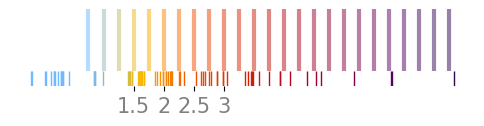

In [512]:
plt.figure(figsize=(6,1))
cmap = cmap_icci_3
_scaler = scaler
colors_fit = cmap(_scaler.transform(temp_ch_sel.reshape(-1,1))) # only every decile ... 
for f,c in zip(temp_ch_sel, colors_fit):
    plt.vlines(f,1,1.2, lw=3, alpha = 0.5,
               color=c, zorder=7)
    
for t in glob_temp_ch:
    c = cmap(scaler.transform(t.reshape(-1,1))) # only every decile ... 

    plt.vlines(t,0.95,1, lw=1, color=c)
plt.yticks([])
ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
plt.xticks([1.5,2,2.5,3], [1.5,2,2.5,3], fontsize=15, color='grey')
plt.ylim([0.95,1.2])
plt.tight_layout()


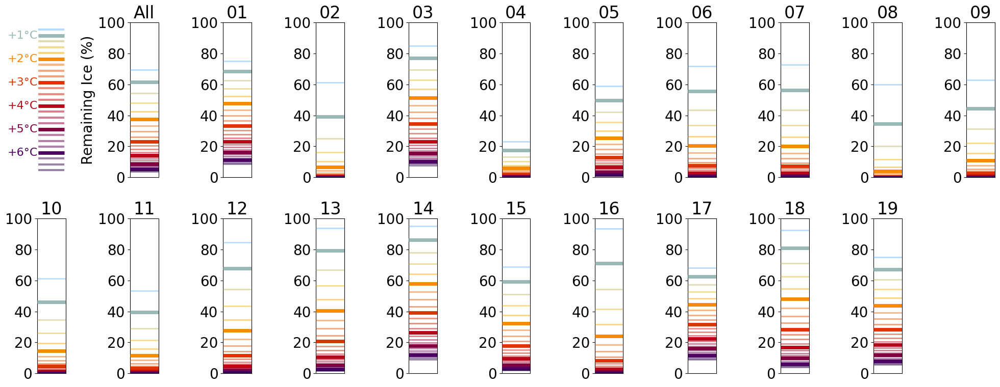

In [315]:
plt.rc('font', size=20)  

plt.figure(figsize=(20,8))
j = 1

for reg in df.rgi_reg.unique():
    pd_sel_reg = df.loc[df.rgi_reg==reg]
    a,b = pd_sel_reg[['a_simple', 'b_simple']].values.squeeze()
    rem_ice = exponential_decay(temp_ch_sel,a,b)
    lw = 2
    plt.subplot(2,11,j+1)
    # colors_fit = cmap(scaler.transform(temp_ch_sel.reshape(-1,1))) # only every decile ... 
    for t,f in zip(temp_ch_sel, rem_ice):
        c=cmap(scaler.transform(t.reshape(-1,1)))
        plt.hlines(f,0, 0+1, lw=lw,
                   alpha = 0.5,
                   color=c, zorder=7)
        if t in [6,5,4,3,2,1]:
            c=cmap(scaler.transform(t.reshape(-1,1)))
            plt.hlines(f,0, 0+1, lw=5,
                   alpha = 1,
                   color=c, zorder=7)
            #if f >3:
            #    plt.text(1.05,f, f'{t}', fontsize=16, color=c.squeeze(), verticalalignment='center')

        plt.ylim([0,100])
        plt.xlim([0,1])
    if j == 1:
        plt.ylabel('Remaining Ice (%)')
    plt.xticks([])

    ax = plt.gca()
    #ax.spines['right'].set_visible(False)
    #ax.spines['left'].set_visible(False)
    #ax.spines['top'].set_visible(False)
    #ax.spines['bottom'].set_visible(False)

    ax.set_title(reg)
    j+=1
plt.tight_layout()

plt.subplot(2,11,1)

cmap = cmap_icci_3
_scaler = scaler
colors_fit = cmap(_scaler.transform(temp_ch_sel.reshape(-1,1))) # only every decile ... 
for t,c in zip(temp_ch_sel, colors_fit):
    plt.hlines(t,0,1, lw=3, alpha = 0.5,
               color=c, zorder=7)

    if t in [1, 2, 3,4,5,6]:
        c=cmap(scaler.transform(t.reshape(-1,1)))
        plt.hlines(t,0, 0+1, lw=5,
               alpha = 1,
               color=c, zorder=7)
        plt.text(-1.2,t, f'+{t.round(0).astype(int)}°C', fontsize=16, color=c.squeeze(), verticalalignment='center')

        
plt.gca().invert_yaxis()

ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
plt.xticks([])
plt.yticks([])
plt.savefig('figures/region_overview_bars.png')

In [515]:
temp_ch_sel_n = np.arange(0.75,glob_temp_ch.max(),0.01)
colors_fit_n = cmap(_scaler.transform(temp_ch_sel_n.reshape(-1,1))) # only every decile ... 


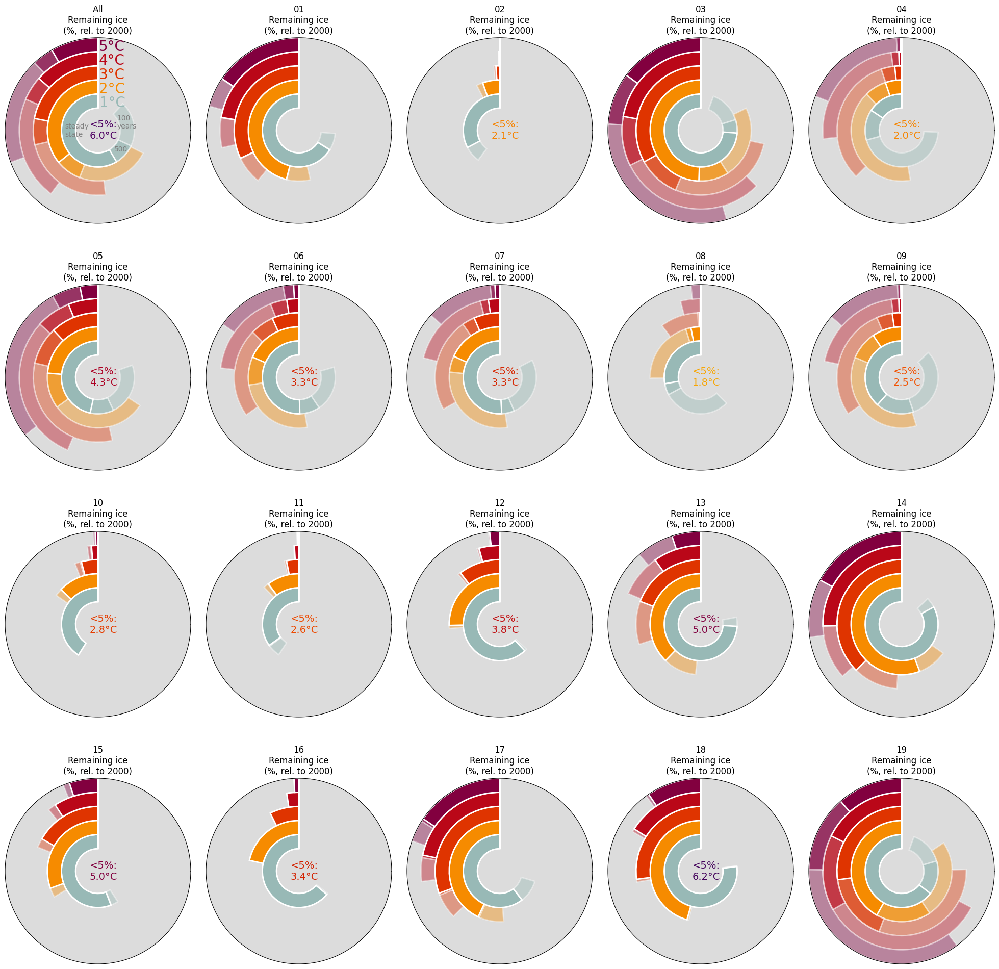

In [527]:
plt.rc('font', size=20)  
shift = 0.5*np.pi
fig, axs = plt.subplots(4,5, figsize=(20,20), subplot_kw=dict(projection="polar"))
axs = axs.flatten()
j = 0
for reg in list(df.rgi_reg.unique()):
    ax = axs[j]
    extinct = False
    for yr in [100, 500, 5000]:

        df_yr = pd_exp_decay_fits_simple.loc[pd_exp_decay_fits_simple.year==yr]
        pd_sel_reg = df_yr.loc[df_yr.rgi_reg==reg]
        #pd_sel_reg = df.loc[df.rgi_reg==reg]
        a,b = pd_sel_reg[['a_simple', 'b_simple']].values.squeeze()
        if yr == 100:
            alpha = 0.4
        elif yr == 300:
            alpha = 0.5
        elif yr == 500:
            alpha = 0.6
        else:
            alpha = 1
        for t,c in zip(temp_ch_sel_n, colors_fit_n):
            f = exponential_decay(t,a,b)
            if (f<5) and (extinct==False) and (yr ==5000):
                ax.text(np.pi, 0.1, f'<5%:\n{t.round(1)}°C', fontsize=14,
                        color=c.squeeze(), verticalalignment='center')
                extinct = True
            if t.round(2) in [1, 2, 3,4,5]:
                size=0.17
                valsnorm = ((f/100))*2*np.pi  #+shift
                #valsleft = np.cumsum(np.append(0, valsnorm.flatten()[-1]))#.reshape(f.shape)
                c=cmap(scaler.transform(t.reshape(-1,1)))
                ax.bar(x=shift, 
                       width=[0,valsnorm], 
                       bottom=0.1+size*t, height=size,
                       color=c, edgecolor='w', linewidth=2, align="edge", alpha = alpha)


                if (j==0) and (yr==5000):
                    ax.text(shift-0.05/t,0.1+size*t+0.06, f'{t.round(0).astype(int)}°C', fontsize=20,
                            color=c.squeeze(), verticalalignment='center')
                    if t.round(2) == 1:
                        ax.text(1/8*np.pi, 0.25, f'100\nyears', fontsize=10,
                                color='grey', verticalalignment='center')
                        ax.text(-3/11*np.pi, 0.3, f'500', fontsize=10,
                                color='grey', verticalalignment='center')
                        ax.text(np.pi, 0.4, f'steady\nstate', fontsize=10,
                                color='grey', verticalalignment='center')
    #ax.invert_xaxis()
    ax.set_facecolor('silver')
    ax.set_title(reg+'\nRemaining ice\n(%, rel. to 2000)', fontsize=12)
    ax.get_xaxis().set_visible(False)
    ax.set_facecolor('gainsboro')
    #ax.set_axisbelow.set_visible(False)
    ax.grid(False)
    ax.set_ylim([0,0.1+size*5+size])
    ax.set_yticks([])#.set_visible(False)

    j+=1
plt.tight_layout()


plt.savefig('figures/region_overview_pies.png')

In [587]:
df

,rgi_reg,year,a_simple,b_simple,a_simple_norm,b_simple_norm,kmeans_cluster_4,"V$_{eq,rel,ΔT=+2°C}$ [in %]","ΔT(V$_{eq,rel}=\frac{a}{2}$) [in °C]",region,resp_time_-50%_1_5_deg,resp_time_-50%_3_0_deg,temp_ch_avg_1986-2005_vs_1901-1920,median_reg_vs_glob_ch,slope_fit_reg_vs_glob_ch
region,,,,,,,,,,,,,,,
Globally,All,5000,55.742286,0.488966,0.235331,0.107768,0,35.897567,2.517577,Globally,NaN,NaN,0.806812,1.6,1.8
01,01,5000,63.744783,0.361593,0.269115,0.079695,0,46.037385,3.016927,01,48.5,33.0,1.089029,1.3,1.5
02,02,5000,27.361966,1.787244,0.115516,0.393909,3,5.477420,1.487830,02,22.5,14.0,0.984427,1.2,1.4
03,03,5000,70.975479,0.401856,0.299642,0.088569,0,49.435280,2.824866,03,214.5,126.0,0.790313,2.0,2.4
04,04,5000,14.047771,1.107736,0.059306,0.244145,1,5.183608,1.725733,04,107.0,55.0,0.291985,1.8,2.1
05,05,5000,43.535577,0.677059,0.183797,0.149224,2,23.670406,2.123762,05,138.5,71.0,0.457843,1.6,2.0
06,06,5000,45.595772,1.006360,0.192495,0.221802,2,18.432049,1.788767,06,104.0,48.0,0.456793,0.9,1.1
07,07,5000,45.881332,1.029715,0.193700,0.226950,2,18.161691,1.773144,07,107.0,43.0,0.978236,2.6,2.9
08,08,5000,22.341606,2.193656,0.094321,0.483483,3,3.102350,1.415978,08,61.5,23.5,0.597419,1.2,1.3


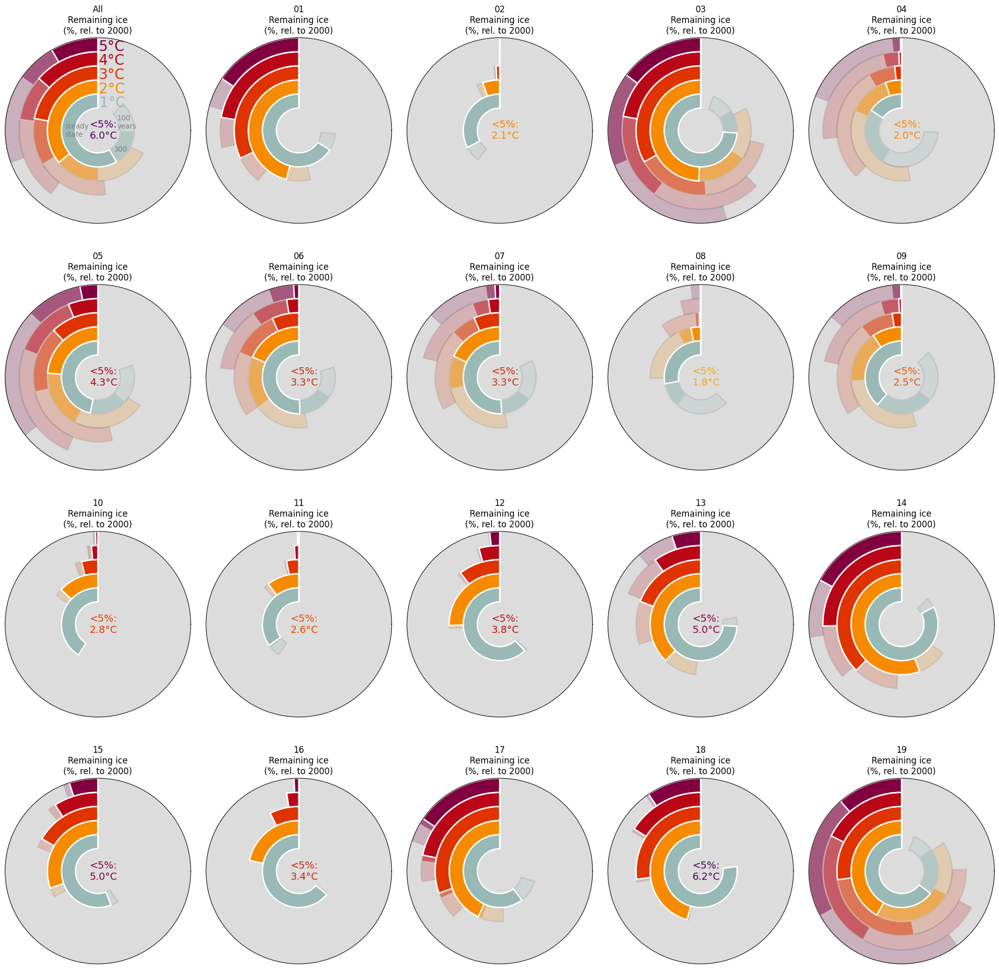

In [532]:
plt.rc('font', size=20)  
shift = 0.5*np.pi
fig, axs = plt.subplots(4,5, figsize=(20,20), subplot_kw=dict(projection="polar"))
axs = axs.flatten()
j = 0
for reg in list(df.rgi_reg.unique()):
    ax = axs[j]
    extinct = False
    for yr in [100, 300, 5000]:

        df_yr = pd_exp_decay_fits_simple.loc[pd_exp_decay_fits_simple.year==yr]
        pd_sel_reg = df_yr.loc[df_yr.rgi_reg==reg]
        #pd_sel_reg = df.loc[df.rgi_reg==reg]
        a,b = pd_sel_reg[['a_simple', 'b_simple']].values.squeeze()
        if yr == 100:
            alpha = 0.2
            yr_w='grey'
            
        elif yr == 300:
            alpha = 0.5
            yr_w='lightgrey'
        elif yr == 500:
            alpha = 0.6
        else:
            yr_w='w'
            alpha = 1
        for t,c in zip(temp_ch_sel_n, colors_fit_n):
            f = exponential_decay(t,a,b)
            if (f<5) and (extinct==False) and (yr ==5000):
                ax.text(np.pi, 0.1, f'<5%:\n{t.round(1)}°C', fontsize=14,
                        color=c.squeeze(), verticalalignment='center')
                extinct = True
            if t.round(2) in [1, 2, 3,4,5]:
                size=0.17
                valsnorm = ((f/100))*2*np.pi  #+shift
                #valsleft = np.cumsum(np.append(0, valsnorm.flatten()[-1]))#.reshape(f.shape)
                c=cmap(scaler.transform(t.reshape(-1,1)))
                ax.bar(x=shift, 
                       width=[0,valsnorm], 
                       bottom=0.1+size*t, height=size,
                       color=c, edgecolor=yr_w, linewidth=2, align="edge", alpha = alpha)
                


                if (j==0) and (yr==5000):
                    ax.text(shift-0.05/t,0.1+size*t+0.06, f'{t.round(0).astype(int)}°C', fontsize=20,
                            color=c.squeeze(), verticalalignment='center')
                    if t.round(2) == 1:
                        ax.text(1/8*np.pi, 0.25, f'100\nyears', fontsize=10,
                                color='grey', verticalalignment='center')
                        ax.text(-3/11*np.pi, 0.3, f'300', fontsize=10,
                                color='grey', verticalalignment='center')
                        ax.text(np.pi, 0.4, f'steady\nstate', fontsize=10,
                                color='grey', verticalalignment='center')
    #ax.invert_xaxis()
    ax.set_facecolor('silver')
    ax.set_title(reg+'\nRemaining ice\n(%, rel. to 2000)', fontsize=12)
    ax.get_xaxis().set_visible(False)
    ax.set_facecolor('gainsboro')
    #ax.set_axisbelow.set_visible(False)
    ax.grid(False)
    ax.set_ylim([0,0.1+size*5+size])
    ax.set_yticks([])#.set_visible(False)

    j+=1
plt.tight_layout()


plt.savefig('figures/region_overview_pies_300.png')

In [542]:
p

1

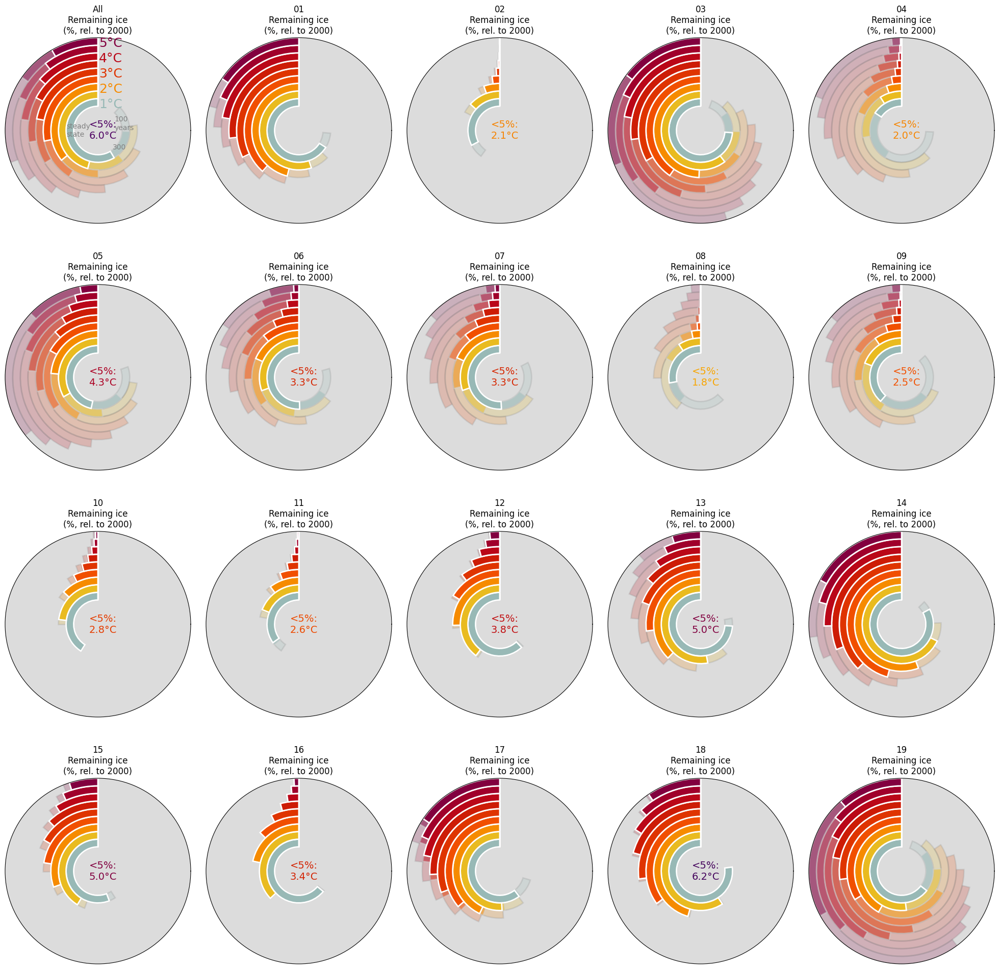

In [545]:
plt.rc('font', size=20)  
shift = 0.5*np.pi
fig, axs = plt.subplots(4,5, figsize=(20,20), subplot_kw=dict(projection="polar"))
axs = axs.flatten()
j = 0
for reg in list(df.rgi_reg.unique()):
    ax = axs[j]
    extinct = False
    for yr in [100, 300, 5000]:

        df_yr = pd_exp_decay_fits_simple.loc[pd_exp_decay_fits_simple.year==yr]
        pd_sel_reg = df_yr.loc[df_yr.rgi_reg==reg]
        #pd_sel_reg = df.loc[df.rgi_reg==reg]
        a,b = pd_sel_reg[['a_simple', 'b_simple']].values.squeeze()
        if yr == 100:
            alpha = 0.2
            yr_w='grey'
            
        elif yr == 300:
            alpha = 0.5
            yr_w='lightgrey'
        elif yr == 500:
            alpha = 0.6
        else:
            yr_w='w'
            alpha = 1
        p = 1
        for t,c in zip(temp_ch_sel_n, colors_fit_n):
            f = exponential_decay(t,a,b)
            if (f<5) and (extinct==False) and (yr ==5000):
                ax.text(np.pi, 0.1, f'<5%:\n{t.round(1)}°C', fontsize=14,
                        color=c.squeeze(), verticalalignment='center')
                extinct = True
            if t.round(2) in [1,1.5, 2, 2.5,3,3.5,4,4.5,5]:
                p+=1
                size=0.17/2
                valsnorm = ((f/100))*2*np.pi  #+shift
                #valsleft = np.cumsum(np.append(0, valsnorm.flatten()[-1]))#.reshape(f.shape)
                c=cmap(scaler.transform(t.reshape(-1,1)))
                ax.bar(x=shift, 
                       width=[0,valsnorm], 
                       bottom=0.1+size*p, height=size,
                       color=c, edgecolor=yr_w, linewidth=2, align="edge", alpha = alpha)
                


                if (j==0) and (yr==5000):
                    if t.round(2) in [1, 2, 3,4,5]:
                        ax.text(shift-0.05/t,0.1+size*p+0.02, f'{t.round(0).astype(int)}°C', fontsize=18,
                                color=c.squeeze(), verticalalignment='center')
                    if t.round(2) == 1:
                        ax.text(1/8*np.pi, 0.2, f'100\nyears', fontsize=10,
                                color='grey', verticalalignment='center')
                        ax.text(-3/11*np.pi, 0.25, f'300', fontsize=10,
                                color='grey', verticalalignment='center')
                        ax.text(np.pi, 0.35, f'steady\nstate', fontsize=10,
                                color='grey', verticalalignment='center')
    #ax.invert_xaxis()
    ax.set_facecolor('silver')
    ax.set_title(reg+'\nRemaining ice\n(%, rel. to 2000)', fontsize=12)
    ax.get_xaxis().set_visible(False)
    ax.set_facecolor('gainsboro')
    #ax.set_axisbelow.set_visible(False)
    ax.grid(False)
    ax.set_ylim([0,0.1+size*10+size])
    ax.set_yticks([])#.set_visible(False)

    j+=1
plt.tight_layout()


plt.savefig('figures/region_overview_pies_300_more_steps.png')

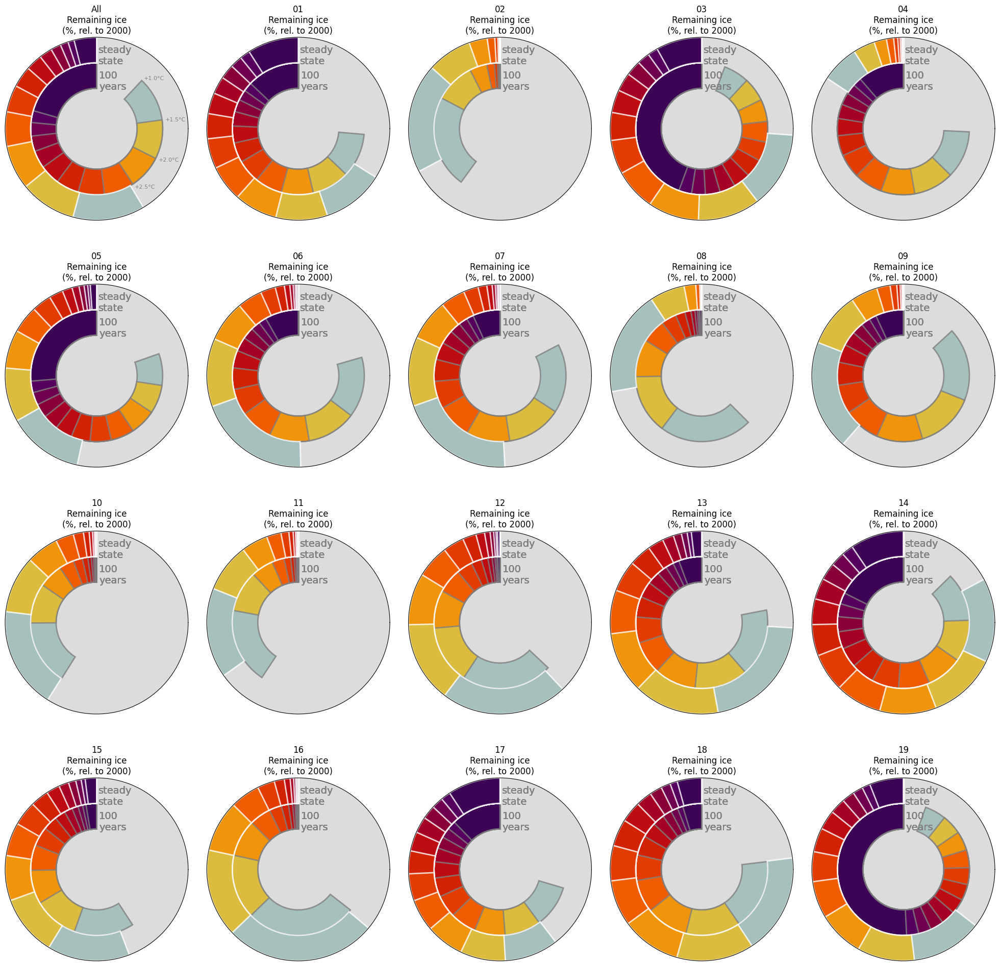

In [565]:
plt.rc('font', size=20)  
shift = 0.5*np.pi
fig, axs = plt.subplots(4,5, figsize=(20,20), subplot_kw=dict(projection="polar"))
axs = axs.flatten()
j = 0
for reg in list(df.rgi_reg.unique()):
    ax = axs[j]
    extinct = False
    for yr in [100,5000]:

        df_yr = pd_exp_decay_fits_simple.loc[pd_exp_decay_fits_simple.year==yr]
        pd_sel_reg = df_yr.loc[df_yr.rgi_reg==reg]
        #pd_sel_reg = df.loc[df.rgi_reg==reg]
        a,b = pd_sel_reg[['a_simple', 'b_simple']].values.squeeze()
        if yr == 100:
            alpha = 0.8
            yr_w='grey'
            label_t = f'{yr}\nyears'
            p=1
            
        elif yr == 300:
            alpha = 0.8
            yr_w='lightgrey'
            label_t = f'{yr}'
            p=2
        else:
            yr_w='w'
            alpha = 0.8
            label_t = 'steady\nstate'
            p=2
        for t,c in zip(temp_ch_sel_n, colors_fit_n):
            f = exponential_decay(t,a,b)
            #if (f<5) and (extinct==False) and (yr ==5000):
            #    ax.text(shift, 0.2, f'<5%:\n{t.round(1)}°C', fontsize=14,
            #            color=c.squeeze(), verticalalignment='center')
            #    extinct = True
            if t.round(2) in [1,1.5, 2, 2.5,3,3.5,4,4.5,5,5.5,6,6.5]:
                size=0.17
                valsnorm = ((f/100))*2*np.pi  #+shift
                #valsleft = np.cumsum(np.append(0, valsnorm.flatten()[-1]))#.reshape(f.shape)
                c=cmap(scaler.transform(t.reshape(-1,1)))
                ax.bar(x=shift, 
                       width=[0,valsnorm], 
                       bottom=0.1+size*p, height=size,
                       color=c, edgecolor=yr_w, linewidth=2, align="edge", alpha = alpha)
                if t.round(2) in [1, 2, 3,4,5]:
                    ax.text(shift-0.05/p,0.1+size*p+0.05,
                            label_t, fontsize=14,
                            color='grey', verticalalignment='center')
                #if (j==0) and (yr==5000):
                #if t.round(2) in [1, 2, 3,4,5]:
                #    ax.text(shift-0.05/t,0.1+size*p+0.02, f'{t.round(0).astype(int)}°C', fontsize=18,
                #            color=c.squeeze(), verticalalignment='center')
                if t.round(2) in [1,1.5,2,2.5] and p == 1 and reg == 'All':
                    ax.text(valsnorm+shift, 0.12+size*p + size, f'+{t.round(1)}°C', fontsize=8,
                            color=c[0], verticalalignment='center')
                #    ax.text(-3/11*np.pi, 0.25, f'300', fontsize=10,
                #            color='grey', verticalalignment='center')
                #    ax.text(np.pi, 0.35, f'steady\nstate', fontsize=10,
                #            color='grey', verticalalignment='center')
    #ax.invert_xaxis()
    ax.set_facecolor('silver')
    ax.set_title(reg+'\nRemaining ice\n(%, rel. to 2000)', fontsize=12)
    ax.get_xaxis().set_visible(False)
    ax.set_facecolor('gainsboro')
    #ax.set_axisbelow.set_visible(False)
    ax.grid(False)
    ax.set_ylim([0,0.1+size*2+size])
    ax.set_yticks([])#.set_visible(False)

    j+=1
plt.tight_layout()


plt.savefig('figures/region_overview_pies_collapsed.png')

In [567]:
c[0]

array([0.16862745, 0.03137255, 0.30196078, 1.        ])

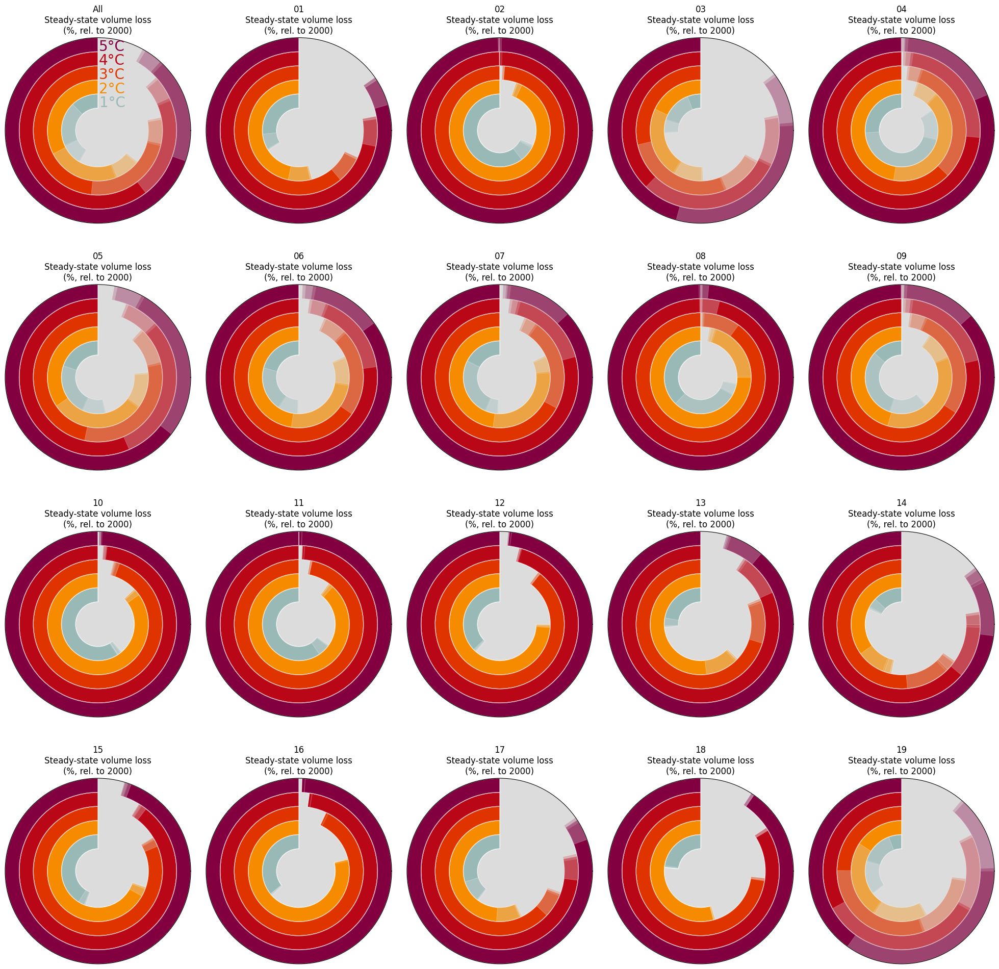

In [505]:
plt.rc('font', size=20)  
shift = 0.5*np.pi
fig, axs = plt.subplots(4,5, figsize=(20,20), subplot_kw=dict(projection="polar"))
axs = axs.flatten()
j = 0
one_deg = 2*np.pi*1/360
for reg in list(df.rgi_reg.unique()):
    ax = axs[j]
    for yr in [100, 500, 5000]:
        df_yr = pd_exp_decay_fits_simple.loc[pd_exp_decay_fits_simple.year==yr]
        pd_sel_reg = df_yr.loc[df_yr.rgi_reg==reg]
    
    
        #pd_sel_reg = df.loc[df.rgi_reg==reg]
        a,b = pd_sel_reg[['a_simple', 'b_simple']].values.squeeze()
        if yr == 100:
            alpha = 1
        elif yr == 300:
            alpha = 0.5
        elif yr == 500:
            alpha = 0.3
        else:
            alpha = 0.2
        for t,c in zip(temp_ch_sel, colors_fit):
            f = exponential_decay(t,a,b)

            if t in [1, 2, 3,4,5]:
                size=0.17
                valsnorm = (1-((f/100)))*2*np.pi  #+shift
                #valsleft = np.cumsum(np.append(0, valsnorm.flatten()[-1]))#.reshape(f.shape)

                c=cmap(scaler.transform(t.reshape(-1,1)))
                #ax.vlines(x=valsnorm+shift, ymin=0.1,ymax=0.5,)#valsleft[-1], #[:, 0],

                ax.bar(x=shift,#valsleft[-1], #[:, 0],
                       width=[valsnorm-one_deg,valsnorm+one_deg], #+shift, #10, #valsnorm.sum(axis=1),
                       bottom=0.1+size*t, height=size,
                       color=c, edgecolor='w', linewidth=2, align="edge", alpha =alpha)


                if j ==0 and yr==5000:
                    ax.text(shift-0.05/t,0.1+size*t+0.06, f'{t.round(0).astype(int)}°C', fontsize=20,
                            color=c.squeeze(), verticalalignment='center')
    #ax.invert_xaxis()
    ax.set_facecolor('silver')
    ax.set_title(reg+'\nSteady-state volume loss\n(%, rel. to 2000)', fontsize=12)
    #ax.axis("off")   # turns off axes
    ax.get_xaxis().set_visible(False)
    ax.set_facecolor('gainsboro')
    #ax.set_axisbelow.set_visible(False)
    ax.grid(False)
    ax.set_ylim([0,0.1+size*5+size])
    ax.set_yticks([])#.set_visible(False)
    #ax.set_axis_off()

    j+=1
plt.tight_layout()


plt.savefig('figures/region_overview_pies_loss.png')

array([0.16862745, 0.03137255, 0.30196078, 1.        ])

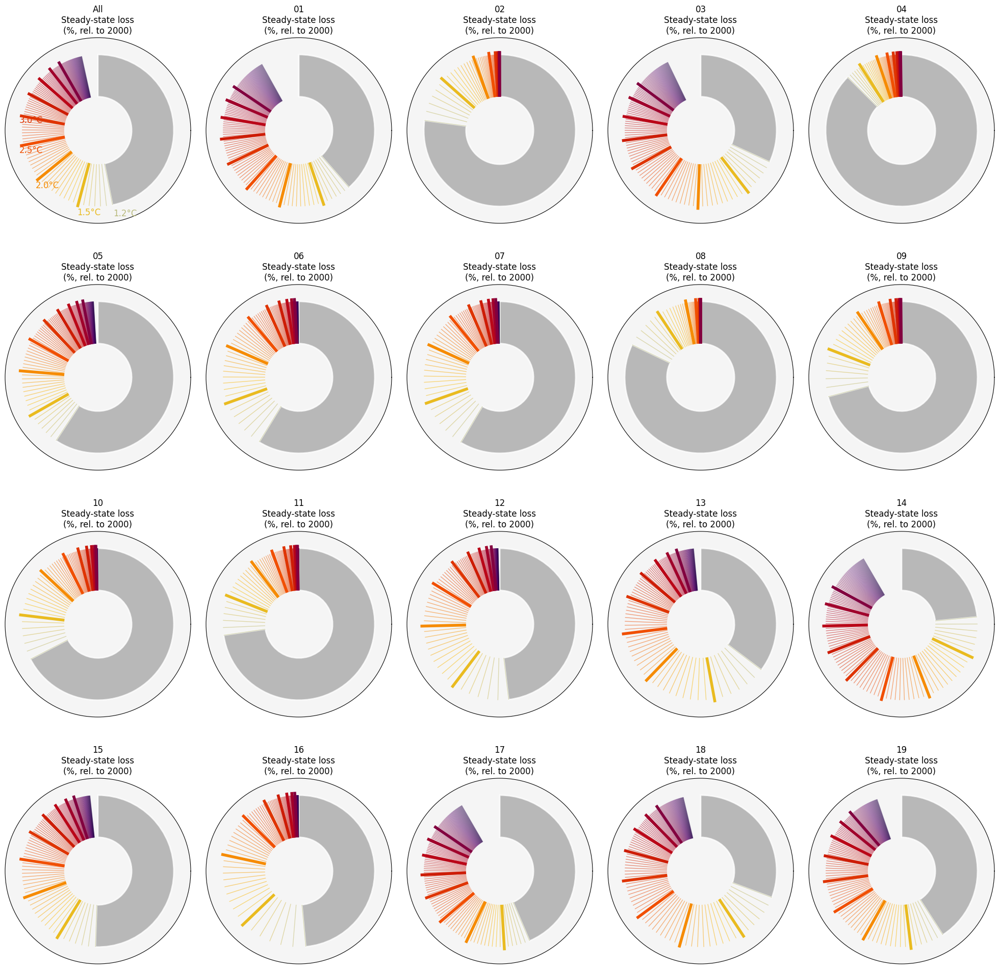

In [586]:
plt.rc('font', size=20)  
shift = 0.5*np.pi
fig, axs = plt.subplots(4,5, figsize=(20,20), subplot_kw=dict(projection="polar"))
axs = axs.flatten()
j = 0
one_deg = 2*np.pi*1/360
for reg in list(df.rgi_reg.unique()):
    ax = axs[j]
    pd_sel_reg = df.loc[df.rgi_reg==reg]
    a,b = pd_sel_reg[['a_simple', 'b_simple']].values.squeeze()
    rot_l = []
    t_l = []
    temp_ch_sel_n = np.arange(1.2,glob_temp_ch.max(),0.05)
    colors_fit_n = cmap(_scaler.transform(temp_ch_sel_n.reshape(-1,1))) # only every decile ... 
    for t,c in zip(temp_ch_sel_n, colors_fit_n):

        f = exponential_decay(t,a,b)
        valsnorm = (1-((f/100)))*2*np.pi  #+shift

        c=cmap(scaler.transform(t.reshape(-1,1)))
        ax.vlines(x=-valsnorm+shift, ymin=0.2,ymax=0.45, color = c, lw=1, alpha = 0.5)#valsleft[-1], #[:, 0],
        if t.round(2) in [1.5,2,2.5, 3,3.5,4,4.5, 5]:
            size=0.17
            ax.vlines(x=-valsnorm+shift, ymin=0.2,ymax=0.47, color = c, lw=4, zorder=5)#valsleft[-1], #[:, 0],
            rot_l.append(-valsnorm+shift)
            t_l.append(t)
        if t.round(2) in [1.2]:
            ax.bar(x=shift,#valsleft[-1], #[:, 0],
                        width=[0,-valsnorm], #+shift, #10, #valsnorm.sum(axis=1),
                        bottom=0.2, height=0.25,
                        color='darkgrey', edgecolor='w', linewidth=2, align="edge", alpha =alpha)
        
        if t.round(2) in [1.2,1.5,2,2.5,3] and reg == 'All':
            ax.text(-valsnorm+shift, 0.475, f'{t.round(1)}°C', fontsize=12,
                    color=c.squeeze(), verticalalignment='top') #, horizontalalignment='center')
    #ax.invert_xaxis()
    #ax.vlines(shift, color='grey',ymin=0.18,ymax=0.5, lw=1, ls='--', zorder=10)
    #ax.vlines(0, color='grey',ymin=0.18,ymax=0.5, lw=0.5, ls=':', zorder=10)
    #ax.vlines(-shift, color='grey',ymin=0.18,ymax=0.5, lw=0.5, ls=':', zorder=10)

    ax.set_facecolor('silver')
    ax.set_title(reg+'\nSteady-state loss\n(%, rel. to 2000)', fontsize=12)
    #ax.axis("off")   # turns off axes
    ax.get_xaxis().set_visible(False)
    ax.set_facecolor('whitesmoke')
    #ax.set_axisbelow.set_visible(False)
    ax.grid(False)
    ax.set_ylim([0,0.55])
    #ax.set_xticklabels(['25%', '50%','75%', '100%'])
    #ax.set_xticks(ticks = rot_l,labels=t_l)

    ax.set_yticks([])#.set_visible(False)
    #ax.set_axis_off()
    #ax.vlines(np.pi, color='grey',ymin=0.18,ymax=0.5, lw=0.5, ls=':')

    j+=1
plt.tight_layout()

plt.savefig('figures/region_overview_pies_continuous.png')

**Old**

/tmp/ipykernel_3673751/2475730273.py:36: UserWarning: The palette list has more values (10) than needed (4), which may not be intended.
  ax = sns.scatterplot(data=df, y='a_simple', x='b_simple', hue='kmeans_cluster_4', palette=sns.color_palette('bright'), s=200)
/tmp/ipykernel_3673751/2475730273.py:56: UserWarning: The palette list has more values (10) than needed (4), which may not be intended.
  ax=sns.scatterplot(data=df, y=r'V$_{eq,rel,ΔT=+1.1°C}$ [in %]',
/tmp/ipykernel_3673751/2475730273.py:81: UserWarning: The palette list has more values (10) than needed (4), which may not be intended.
  ax=sns.scatterplot(data=df, y='resp_time_-50%_1_5_deg',
/tmp/ipykernel_3673751/2475730273.py:93: UserWarning: The palette list has more values (10) than needed (4), which may not be intended.
  ax=sns.scatterplot(data=df, y='resp_time_-50%_3_0_deg',
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite v

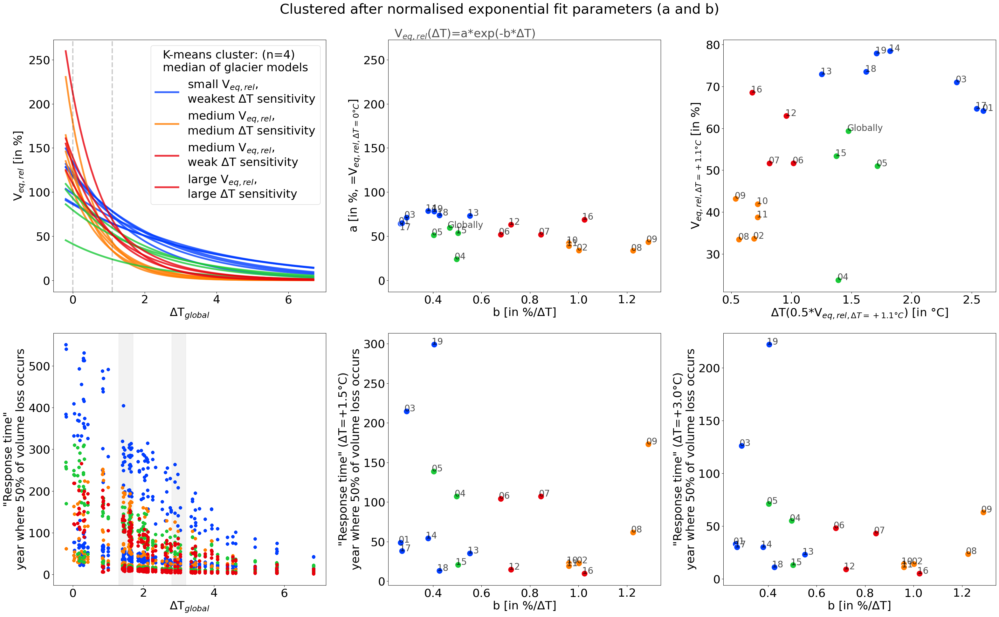

In [61]:
# from https://stackoverflow.com/questions/46027653/adding-labels-in-x-y-scatter-plot-with-seaborn
def plotlabel(xvar, yvar, label):
    ax.text(xvar-0.01, yvar+0.01, label, alpha=0.7, fontsize=20)
    
def plotlabel_b(xvar, yvar, label):
    ax.text(xvar-0.01, yvar-8, label, alpha=0.7, fontsize=20)
plt.rc('font', size=26)  

plt.figure(figsize=(32,20))

ax=plt.subplot(231)
for k in [0,1,2,3]:
    pd_sel = df.loc[df.kmeans_cluster_4 == k]
    for reg in pd_sel.region:
        pd_sel_reg = pd_sel.loc[pd_sel.region==reg]
        a,b = pd_sel_reg[['a_simple', 'b_simple']].values.squeeze()
        ax.plot(glob_temp, exponential_decay(glob_temp,a,b), label=reg, color=sns.color_palette('bright')[k],lw=4, alpha = 0.8)
handles, labels = ax.get_legend_handles_labels()
handles_l = handles[0], handles[7],handles[16],handles[18]
labels_long_cluster = [r'small V$_{eq,rel}$'+',\nweakest ΔT sensitivity', 
                       r'medium V$_{eq,rel}$'+',\nmedium ΔT sensitivity', 
                       r'medium V$_{eq,rel}$'+',\nweak ΔT sensitivity',
                       r'large V$_{eq,rel}$'+',\nlarge ΔT sensitivity']
ax.legend(handles_l,labels_long_cluster, title = 'K-means cluster: (n=4)\nmedian of glacier models')        

ax.set_ylabel(r'V$_{eq,rel}$ [in %]')
ax.set_xlabel(r'ΔT$_{global}$')

ylim0,ylim1 = ax.get_ylim()
plt.axvline(0,ls='--', alpha = 0.2,lw=3, color='black')

plt.axvline(1.1,ls='--', alpha = 0.2,lw=3, color='black')


plt.subplot(232)
ax = sns.scatterplot(data=df, y='a_simple', x='b_simple', hue='kmeans_cluster_4', palette=sns.color_palette('bright'), s=200)
df.loc[df.region!='17'].apply(lambda x: plotlabel(x['b_simple'],  x['a_simple'], x['region']), axis=1)

df.loc[df.region=='17'].apply(lambda x: plotlabel_b(x['b_simple'],  x['a_simple'], x['region']), axis=1)

ax.text(0.24,275, r'V$_{eq,rel}$(ΔT)=a*exp(-b*ΔT)', alpha=0.7, fontsize=26)
ax.set_xlabel('b [in %/ΔT]')
ax.set_ylabel(r'a [in %, =V$_{eq,rel,ΔT=0°C}$]')
leg=plt.legend(title='K-means\ncluster:\n(n=4)\nmedian of glacier models', loc='lower right')
leg.remove()
ax.set_ylim(ylim0,ylim1)
#plt.subplot(122)
#ax=sns.scatterplot(data=pd_exp_decay_fits_simple_5000, x=r'V$_{eq,rel,ΔT=+1.1°C}$ [in %]', y=r'b_simple', hue='kmeans_cluster_4', palette=sns.color_palette('tab10'), s=200)
#ax.set_ylabel('b [in %/ΔT]')
#pd_exp_decay_fits_simple_5000.apply(lambda x: plotlabel(x[r'V$_{eq,rel,ΔT=+1.1°C}$ [in %]'],  x['b_simple'], x['region']), axis=1)
#plt.legend(title='K-means\ncluster:\n(n=4)', loc='upper right')



plt.subplot(233)
ax=sns.scatterplot(data=df, y=r'V$_{eq,rel,ΔT=+1.1°C}$ [in %]',
                   x=r'ΔT(ΔV=0.5*V$_{eq,rel,ΔT=+1.1°C}$ [in °C]', hue='kmeans_cluster_4', palette=sns.color_palette('bright'), s=200)
df.apply(lambda x: plotlabel(x[r'ΔT(ΔV=0.5*V$_{eq,rel,ΔT=+1.1°C}$ [in °C]'], x[r'V$_{eq,rel,ΔT=+1.1°C}$ [in %]'],  x['region']), axis=1)
leg = plt.legend(title='K-means\ncluster:\n(n=4)', loc='upper left')
leg.remove()
ax.set_xlabel(r'ΔT(0.5*V$_{eq,rel,ΔT=+1.1°C}$) [in °C]')




plt.subplot(234)
ax = plt.gca()
for k in [0,1,2,3]:
    df_resp_time_deltaT_sel = df_resp_time_deltaT.loc[df_resp_time_deltaT.kmeans_cluster_4 == k]
    for reg in df_resp_time_deltaT_sel.rgi_reg:
        pd_sel_reg = df_resp_time_deltaT_sel.loc[df_resp_time_deltaT_sel.rgi_reg==reg]
        ax.plot(pd_sel_reg['temp_ch_ipcc'], pd_sel_reg['resp_time_-50%'], 'o', color=sns.color_palette('bright')[k], alpha = 0.6)
plt.ylabel('"Response time"\nyear where 50% of volume loss occurs')
ax.set_xlabel(r'ΔT$_{global}$')
plt.axvspan(1.3,1.7, color='grey', alpha = 0.1)
plt.axvspan(2.8,3.2, color='grey', alpha = 0.1)
        
        
plt.subplot(235)
#plt.subplot(133)
ax=sns.scatterplot(data=df, y='resp_time_-50%_1_5_deg',
                   x=r'b_simple', hue='kmeans_cluster_4', palette=sns.color_palette('bright'), s=200)
df.apply(lambda x: plotlabel(x[r'b_simple'], x['resp_time_-50%_1_5_deg'],  x['region']), axis=1)
leg = plt.legend(title='K-means\ncluster:\n(n=4)', loc='upper left')
leg.remove()
plt.ylabel('"Response time" (ΔT=+1.5°C)\nyear where 50% of volume loss occurs')
#plt.tight_layout()
ax.set_xlabel('b [in %/ΔT]')


#plt.subplot(133)
plt.subplot(236)
ax=sns.scatterplot(data=df, y='resp_time_-50%_3_0_deg',
                   x=r'b_simple', hue='kmeans_cluster_4', palette=sns.color_palette('bright'), s=200)
df.apply(lambda x: plotlabel(x[r'b_simple'], x['resp_time_-50%_3_0_deg'],  x['region']), axis=1)
leg = plt.legend(title='K-means\ncluster:\n(n=4)', loc='upper left')
leg.remove()
plt.ylabel('"Response time" (ΔT=+3.0°C)\nyear where 50% of volume loss occurs')
ax.set_xlabel('b [in %/ΔT]')


plt.suptitle('Clustered after normalised exponential fit parameters (a and b)')
plt.tight_layout()
plt.savefig('figures/3_k_means_clustering/kmeans_clustering_after_Veq_params_a_b.png')

### Look only at response time stuff

- the problem is when we focus just on the median, for some regions the median estimate comes from more models than for others. That means, that the regions can not so simply be compared, as different amount of glacier models are used ... 

In [70]:
thresh_rt=25

In [90]:
# df_resp_time_deltaT = pd.read_csv('resp_time_X%_threshold25%_for_deltaT_rgi_reg_roll_volume_20yravg.csv', index_col=0)
if thresh_rt ==5:
    df_resp_time_deltaT = pd.read_csv('resp_time_X%_threshold5%_for_deltaT_rgi_reg_roll_volume_20yravg.csv', index_col=0)

    # 5% min threshold
    labels_m_d = {-50: np.array([0, 0, 1, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]),
                  -80:np.array([0, 0, 2, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]), # -80 and -50 find the same cluster
                  -90:np.array([0, 0, 2, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1])} # but -90 finds a bit different clusters!!!
elif thresh_rt ==25:
    df_resp_time_deltaT = pd.read_csv('resp_time_X%_threshold25%_for_deltaT_rgi_reg_roll_volume_20yravg.csv', index_col=0)
    # 25% min threshold
    labels_m_d = {-50: np.array([0, 0, 1, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]),
                  -80:np.array([0, 0, 2, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]), #np.array([0, 0, 1, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]), # -80 and -50 find the same cluster
                  -90:np.array([0, 0, 2, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1])} # but -90 finds a bit different clusters!!!

In [91]:
df_resp_time_deltaT.loc[df_resp_time_deltaT.rgi_reg=='RGI19'].groupby(['temp_ch_ipcc']).count().iloc[10:30]

,rgi_reg,model_author,min_perc_change,resp_time_-50%,resp_time_-80%,resp_time_-90%,diff_resp_time_-50%,diff_resp_time_-80%,diff_resp_time_-90%,temp_ch_classes
temp_ch_ipcc,,,,,,,,,,
0.332281,1,1,1,1,1,1,1,1,1,1
0.418289,3,3,3,3,3,3,3,3,3,3
0.841467,2,2,2,2,2,2,2,2,2,2
0.844940,2,2,2,2,2,2,2,2,2,2
0.853313,2,2,2,2,2,2,2,2,2,2
0.862249,2,2,2,2,2,2,2,2,2,2
0.998767,2,2,2,2,2,2,2,2,2,2
1.409114,3,3,3,3,3,3,3,3,3,3
1.428564,2,2,2,2,2,2,2,2,2,2


In [92]:
df_resp_time_deltaT = df_resp_time_deltaT.groupby(['temp_ch_ipcc','rgi_reg']).median()

In [93]:
df_resp_time_deltaT= df_resp_time_deltaT.reset_index()

In [94]:

# get response time
#rgi_reg_clus = df.iloc[1:][['region', 'kmeans_cluster_4']]
#rgi_reg_clus.index = rgi_reg_clus.region
#df_resp_time_deltaT.index = df_resp_time_deltaT.rgi_reg
#for r in rgi_reg_clus.index:
#    df_resp_time_deltaT.loc[r,'kmeans_cluster_4'] = rgi_reg_clus.loc[r,'kmeans_cluster_4']
    
resp_time_deltaT_1_5deg = df_resp_time_deltaT.where((df_resp_time_deltaT.temp_ch_ipcc>1.25) & (df_resp_time_deltaT.temp_ch_ipcc<1.75)).dropna()
resp_time_deltaT_3_0deg = df_resp_time_deltaT.where((df_resp_time_deltaT.temp_ch_ipcc>2.75) & (df_resp_time_deltaT.temp_ch_ipcc<3.25)).dropna()
#resp_time_deltaT_3_0deg.index = resp_time_deltaT_3_0deg.temp_ch_ipcc
print(len(resp_time_deltaT_1_5deg.temp_ch_ipcc.unique()), len(resp_time_deltaT_3_0deg.temp_ch_ipcc.unique()))

resp_time_deltaT_1_5deg = df_resp_time_deltaT.where((df_resp_time_deltaT.temp_ch_ipcc>1.25) & (df_resp_time_deltaT.temp_ch_ipcc<1.75)).dropna().reset_index(drop=True).groupby('rgi_reg').median()
resp_time_deltaT_3_0deg = df_resp_time_deltaT.where((df_resp_time_deltaT.temp_ch_ipcc>2.75) & (df_resp_time_deltaT.temp_ch_ipcc<3.25)).dropna().reset_index(drop=True).groupby('rgi_reg').median()
#resp_time_deltaT_3_0deg.index = resp_time_deltaT_3_0deg.temp_ch_ipcc
resp_time_deltaT_sel = resp_time_deltaT_1_5deg.copy()
for p in [-50,-80,-90]:
    resp_time_deltaT_sel = resp_time_deltaT_sel.rename(columns={f'resp_time_{p}%':f'resp_time_{p}%_1_5_deg', })
    resp_time_deltaT_sel[f'resp_time_{p}%_3_0_deg'] = resp_time_deltaT_3_0deg.loc[resp_time_deltaT_sel.index.values][f'resp_time_{p}%']
    #sns.scatterplot(data = resp_time_deltaT_sel, x= 'resp_time_-50%_1_5_deg', y='resp_time_-50%_3_0_deg', marker='o',s=200, hue='kmeans_cluster_4')

17 7


In [112]:
# let's still only cluster after the 50% time scale 
import sklearn
for p in [-50,-80,-90]:
    for var in [f'resp_time_{p}%_1_5_deg', f'resp_time_{p}%_3_0_deg']:
        resp_time_deltaT_sel[var+'_norm'] = sklearn.preprocessing.normalize([resp_time_deltaT_sel[var].values]).squeeze()
    regions = resp_time_deltaT_sel.index.values
    data = resp_time_deltaT_sel[[f'resp_time_{p}%_1_5_deg_norm', f'resp_time_{p}%_3_0_deg_norm']].values
    # Perform K-means clustering
    k = 3  # Number of clusters
    labels = ['t']

    while np.any(labels != labels_m_d[p]):

        kmeans = KMeans(n_clusters=k)
        kmeans.fit(data)

        # Get the resulting centroids and labels
        centroids = kmeans.cluster_centers_
        labels = kmeans.labels_
    #assert np.all(labels == np.array([0, 0, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]))
    # Print the resulting centroids and labels
    print("Centroids:")
    print(centroids)
    print("Labels:")
    print(labels)

    resp_time_deltaT_sel[f'kmeans_cluster_{k}_{p}%ch'] = labels

/tmp/ipykernel_32087/1471434807.py:12: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  while np.any(labels != labels_m_d[p]):
/home/lilianschuster/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/tmp/ipykernel_32087/1471434807.py:12: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  while np.any(labels != labels_m_d[p]):
/home/lilianschuster/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/tmp/ipykernel_32087/1471434807.py:12: FutureWarning: elementwise comparison failed;

Centroids:
[[0.06413496 0.06348458]
 [0.53098579 0.58786992]
 [0.26198054 0.2074456 ]]
Labels:
[0 0 1 2 2 2 2 0 2 0 0 0 0 0 0 0 0 0 1]
Centroids:
[[0.06544404 0.06273424]
 [0.65876481 0.74959626]
 [0.30159076 0.2543926 ]]
Labels:
[0 0 2 0 2 2 2 0 2 0 0 0 0 0 0 0 0 0 1]
Centroids:
[[0.05879472 0.05936884]
 [0.68056224 0.74047695]
 [0.30023055 0.25654995]]
Labels:
[0 0 2 0 2 2 2 0 2 0 0 0 0 0 0 0 0 0 1]


/home/lilianschuster/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/lilianschuster/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


/tmp/ipykernel_32087/2952873138.py:47: UserWarning: The palette list has more values (6) than needed (3), which may not be intended.
  ax=sns.scatterplot(data = resp_time_deltaT_sel, x= f'resp_time_{p}%_1_5_deg', y=f'diff_resp_time_1_5_vs_3_0_{p}%', marker='o',s=200, hue=f'kmeans_cluster_{k}_{p}%ch',
/tmp/ipykernel_32087/2952873138.py:47: UserWarning: The palette list has more values (6) than needed (3), which may not be intended.
  ax=sns.scatterplot(data = resp_time_deltaT_sel, x= f'resp_time_{p}%_1_5_deg', y=f'diff_resp_time_1_5_vs_3_0_{p}%', marker='o',s=200, hue=f'kmeans_cluster_{k}_{p}%ch',
/tmp/ipykernel_32087/2952873138.py:47: UserWarning: The palette list has more values (6) than needed (3), which may not be intended.
  ax=sns.scatterplot(data = resp_time_deltaT_sel, x= f'resp_time_{p}%_1_5_deg', y=f'diff_resp_time_1_5_vs_3_0_{p}%', marker='o',s=200, hue=f'kmeans_cluster_{k}_{p}%ch',


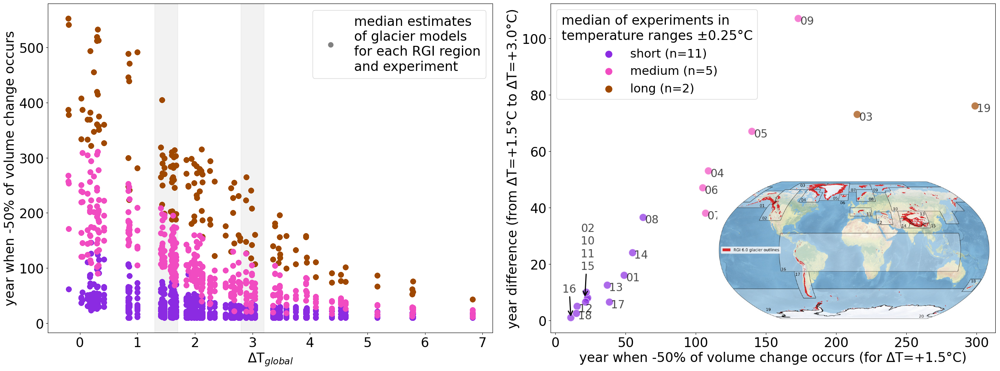

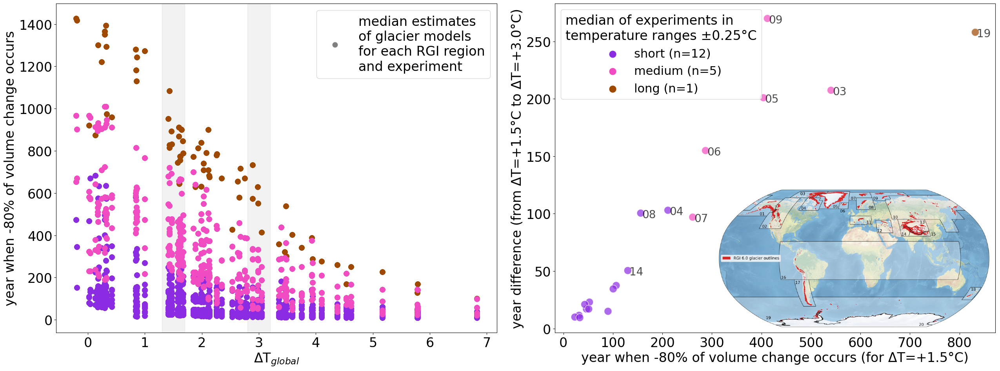

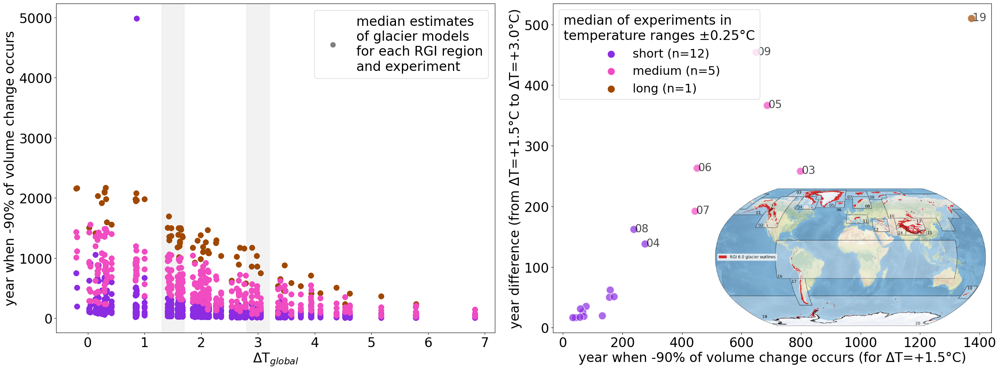

In [113]:
plt.rc('font', size=24)  
# from https://stackoverflow.com/questions/46027653/adding-labels-in-x-y-scatter-plot-with-seaborn

for p in [-50,-80,-90]:
    def plotlabel(xvar, yvar, label):
        if p ==-50:
            ax.text(xvar+1.2, yvar-2, label[3:], alpha=0.7, fontsize=20)
        else:
            ax.text(xvar+3, yvar-4, label[3:], alpha=0.7, fontsize=20)

    resp_time_deltaT_sel['region'] = resp_time_deltaT_sel.index
    # get response time
    rgi_reg_clus = resp_time_deltaT_sel.iloc[1:][['region', f'kmeans_cluster_{k}_{p}%ch']]
    rgi_reg_clus.index = rgi_reg_clus.region
    df_resp_time_deltaT.index = df_resp_time_deltaT.rgi_reg
    for r in rgi_reg_clus.index:
        df_resp_time_deltaT.loc[r,f'kmeans_cluster_{k}_{p}%ch'] = rgi_reg_clus.loc[r,f'kmeans_cluster_{k}_{p}%ch']
    
    plt.figure(figsize=(26,10))
    rgi_reg_per_cluster={}
    plt.subplot(121)
    ax = plt.gca()
    for kk in [0,1,2,3,4]:
        _resp_time_deltaT_sel = df_resp_time_deltaT.loc[df_resp_time_deltaT[f'kmeans_cluster_{k}_{p}%ch'] == kk]
        for reg in _resp_time_deltaT_sel.rgi_reg:
            pd_sel_reg = _resp_time_deltaT_sel.loc[_resp_time_deltaT_sel.rgi_reg==reg]
            ax.plot(pd_sel_reg['temp_ch_ipcc'], pd_sel_reg[f'resp_time_{p}%'], 'o', markersize=9,
                    color=sns.color_palette('bright')[4:][kk], alpha = 0.6)
        n_clusters = len(_resp_time_deltaT_sel.rgi_reg.unique())
        if n_clusters>0:
            rgi_reg_per_cluster[kk] = n_clusters
    plt.ylabel(f'year when {p}% of volume change occurs')
    ax.set_xlabel(r'ΔT$_{global}$')
    plt.axvspan(1.3,1.7, color='grey', alpha = 0.1)
    plt.axvspan(2.8,3.2, color='grey', alpha = 0.1)

    from matplotlib.lines import Line2D
    point = Line2D([0], [0], label='', marker='o', markersize=9, 
             markeredgecolor='grey', markerfacecolor='grey', linestyle='')
    plt.legend([point],['median estimates\nof glacier models\nfor each RGI region\nand experiment'], loc='upper right')

    plt.subplot(122)
    #plt.subplot(133)

    plt.tight_layout()
    resp_time_deltaT_sel[f'diff_resp_time_1_5_vs_3_0_{p}%'] = resp_time_deltaT_sel[f'resp_time_{p}%_1_5_deg'] - resp_time_deltaT_sel[f'resp_time_{p}%_3_0_deg']
    ax=sns.scatterplot(data = resp_time_deltaT_sel, x= f'resp_time_{p}%_1_5_deg', y=f'diff_resp_time_1_5_vs_3_0_{p}%', marker='o',s=200, hue=f'kmeans_cluster_{k}_{p}%ch',
                    palette=sns.color_palette('bright')[4:], alpha=0.7)
    handles, labels = ax.get_legend_handles_labels()
    plt.xlabel(f'year when {p}% of volume change occurs (for ΔT=+1.5°C)')
    plt.ylabel('year difference (from ΔT=+1.5°C to ΔT=+3.0°C)')
    if p==-50:
        resp_time_deltaT_sel_l = resp_time_deltaT_sel.loc[(resp_time_deltaT_sel[f'resp_time_{p}%_1_5_deg']>30) | (resp_time_deltaT_sel[f'resp_time_{p}%_1_5_deg']<17)]
        resp_time_deltaT_sel_l = resp_time_deltaT_sel_l.loc[resp_time_deltaT_sel_l.index!='RGI16']
        resp_time_deltaT_sel_l.apply(lambda x: plotlabel(x[f'resp_time_{p}%_1_5_deg'], x[f'diff_resp_time_1_5_vs_3_0_{p}%'],  x['region']), axis=1)

        rgis_c = resp_time_deltaT_sel.loc[(resp_time_deltaT_sel[f'resp_time_{p}%_1_5_deg']<24) & (resp_time_deltaT_sel['resp_time_-50%_1_5_deg']>18)].index.values
        r_l =''
        for r in rgis_c:
            r_l = r_l+r[3:]+'\n'

        ax.annotate(r_l[:-1],xy=(21,8), xytext=(18,18), fontsize=20, arrowprops=dict(arrowstyle="->", lw=2), alpha = 0.7)


        resp_time_deltaT_sel_16 = resp_time_deltaT_sel.loc[resp_time_deltaT_sel.index=='RGI16']
        resp_time_deltaT_sel_16[f'resp_time_{p}%_1_5_deg']
        ax.annotate('16',xy=(resp_time_deltaT_sel_16[f'resp_time_{p}%_1_5_deg'],resp_time_deltaT_sel_16[f'diff_resp_time_1_5_vs_3_0_{p}%']),
                    xytext=(5,10), fontsize=20, arrowprops=dict(arrowstyle="->", lw=2), alpha = 0.7)
    else:
        if p==-80:
            thresh=120
        elif p==-90:
            thresh=200
        resp_time_deltaT_sel_l = resp_time_deltaT_sel.loc[(resp_time_deltaT_sel[f'resp_time_{p}%_1_5_deg']>thresh)]

        resp_time_deltaT_sel_l.apply(lambda x: plotlabel(x[f'resp_time_{p}%_1_5_deg'], x[f'diff_resp_time_1_5_vs_3_0_{p}%'],  x['region']), axis=1)

    labels_l = [f'short (n={rgi_reg_per_cluster[0]})', f'medium (n={rgi_reg_per_cluster[2]})',f'long (n={rgi_reg_per_cluster[1]})']

    leg = plt.legend([handles[0], handles[-1], handles[1]], labels_l, 
               title=f'median of experiments in\ntemperature ranges ±0.25°C',
               fontsize=22, loc='upper left',markerscale=2)

    plt.tight_layout()
    _,xlim = ax.get_xlim()

    # https://towardsdatascience.com/how-to-add-an-image-to-a-matplotlib-plot-in-python-76098becaf53
    import matplotlib.image as image
    file = "figures/global_map_rgi6_small.jpeg"
    logo = image.imread(file)
    from matplotlib.offsetbox import (OffsetImage, AnnotationBbox)#The OffsetBox is a simple container artist.
    #The child artists are meant to be drawn at a relative position to its #parent.
    if thresh_rt ==5:
        zoom = 0.4
    else:
        zoom=0.54
    imagebox = OffsetImage(logo, zoom = zoom)
    ax = plt.gca()
    #Annotation box for solar pv logo
    #Container for the imagebox referring to a specific position *xy*.
    ab = AnnotationBbox(imagebox, (xlim*0.99, 0), frameon = False, box_alignment=(1, 0))
    ab.set_alpha(0.7)
    ax.add_artist(ab)

    plt.savefig(f'figures/3_k_means_clustering/kmeans_clustering_only_response_time_simple_cluster_n={k}_{p}%ch_{thresh_rt}%thresh.png')
    plt.savefig(f'figures/3_k_means_clustering/kmeans_clustering_only_response_time_simple_cluster_n={k}_{p}%ch_{thresh_rt}%thresh.pdf')

In [59]:
thresh

200

/tmp/ipykernel_3741353/2132356771.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  resp_time_deltaT_sel_l['diff_resp_time_1_5_vs_3_0'] = resp_time_deltaT_sel_l['resp_time_-50%_1_5_deg'] - resp_time_deltaT_sel_l['resp_time_-50%_3_0_deg']
/tmp/ipykernel_3741353/2132356771.py:6: UserWarning: The palette list has more values (10) than needed (1), which may not be intended.
  ax=sns.scatterplot(data = resp_time_deltaT_sel_l, x= 'resp_time_-50%_1_5_deg', y='diff_resp_time_1_5_vs_3_0', marker='o',s=200, hue=f'kmeans_cluster_{k}',


rgi_reg
RGI02    None
RGI10    None
RGI11    None
RGI12    None
RGI15    None
RGI16    None
RGI18    None
dtype: object

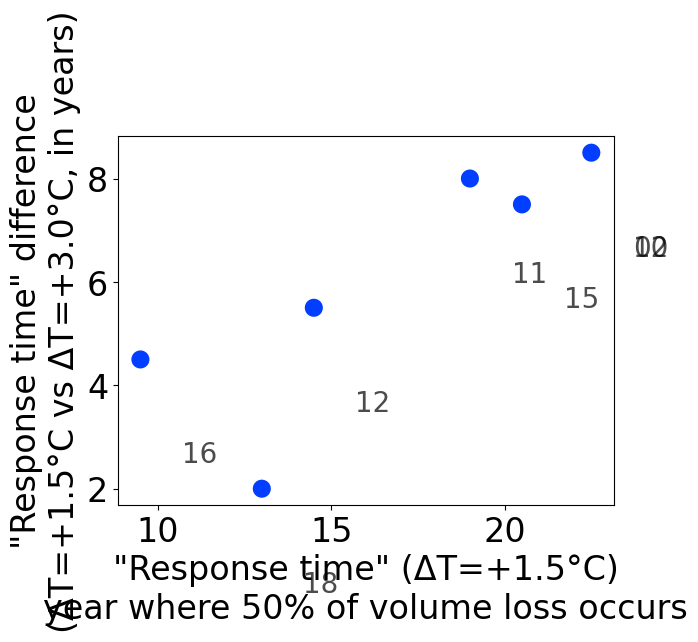

In [96]:
#plt.subplot(122)
#plt.subplot(133)
resp_time_deltaT_sel_l = resp_time_deltaT_sel.loc[resp_time_deltaT_sel['resp_time_-50%_1_5_deg']<30]

resp_time_deltaT_sel_l['diff_resp_time_1_5_vs_3_0'] = resp_time_deltaT_sel_l['resp_time_-50%_1_5_deg'] - resp_time_deltaT_sel_l['resp_time_-50%_3_0_deg']
ax=sns.scatterplot(data = resp_time_deltaT_sel_l, x= 'resp_time_-50%_1_5_deg', y='diff_resp_time_1_5_vs_3_0', marker='o',s=200, hue=f'kmeans_cluster_{k}',
                palette=sns.color_palette('bright'), legend=False)
plt.xlabel('"Response time" (ΔT=+1.5°C)\nyear where 50% of volume loss occurs')
plt.ylabel('"Response time" difference\n(ΔT=+1.5°C vs ΔT=+3.0°C, in years)')
resp_time_deltaT_sel_l.apply(lambda x: plotlabel(x['resp_time_-50%_1_5_deg'], x['diff_resp_time_1_5_vs_3_0'],  x['region']), axis=1)

# OLD

### use complex fit ...

In [ ]:
#**complex fit**
#- too complex: clustering does not seem to work well

pd_exp_decay_fits_adv_5000 = pd_exp_decay_fits_adv.loc[pd_exp_decay_fits_adv.year ==5000]
for var in ['a_comp', 'b_comp', 'c_comp', 'd_comp']:
    pd_exp_decay_fits_adv_5000[var+'_norm'] = sklearn.preprocessing.normalize([pd_exp_decay_fits_adv_5000[var].values]).squeeze()
regions = pd_exp_decay_fits_adv_5000.rgi_reg.values
data = pd_exp_decay_fits_adv_5000[['a_comp_norm', 'b_comp_norm', 'c_comp_norm', 'd_comp_norm']].values

# Perform K-means clustering
k = 4  # Number of clusters
kmeans = KMeans(n_clusters=k)
kmeans.fit(data)

# Get the resulting centroids and labels
centroids = kmeans.cluster_centers_
labels = kmeans.labels_

# Print the resulting centroids and labels
print("Centroids:")
print(centroids)
print("Labels:")
print(labels)

pd_exp_decay_fits_adv_5000[f'kmeans_cluster_{k}'] = labels

fig,axs = plt.subplots(1,4,figsize=(30,10), sharey=True)
for k in [0,1,2,3]:
    pd_sel = pd_exp_decay_fits_adv_5000.loc[pd_exp_decay_fits_adv_5000.kmeans_cluster_4 == k]
    ax = axs[k]
    for reg in pd_sel.rgi_reg:
        pd_sel_reg = pd_sel.loc[pd_sel.rgi_reg==reg]
        a,b,c,d = pd_sel_reg[['a_comp', 'b_comp', 'c_comp', 'd_comp']].values.squeeze()
        ax.plot(glob_temp, exponential_decay_complex(glob_temp,a,b,c,d), label=reg)
        ax.legend()

### use the different time slots ...

In [67]:
pd_exp_decay_fits_simple = pd.read_csv('fitted_glacier_response_to_global_temp_ch_simple.csv', index_col=0)

array(['All', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10',
       '11', '12', '13', '14', '15', '16', '17', '18', '19'], dtype=object)

In [93]:
year_l = pd_exp_decay_fits_simple.year.unique()
col_l = []
for k in np.arange(0,4):
    col_l.append(f'a_simple_{year_l[k]}')
    col_l.append(f'b_simple_{year_l[k]}')
pd_exp_decay_fits_simple_all = pd.DataFrame(index=pd_exp_decay_fits_simple.rgi_reg.unique(), columns =col_l, data=pd_exp_decay_fits_simple[['a_simple', 'b_simple']].values.reshape(20,8))

In [94]:
pd_exp_decay_fits_simple_all

,a_simple_50,b_simple_50,a_simple_100,b_simple_100,a_simple_500,b_simple_500,a_simple_5000,b_simple_5000
All,103.363877,0.131692,100.865068,0.186778,101.857740,0.638656,103.169744,0.071614
01,99.787629,0.165685,100.921458,0.135449,107.102846,0.224139,106.648187,0.230862
02,124.913497,0.497745,107.000364,0.205159,108.991740,0.630672,106.493193,0.741248
03,138.867361,0.661234,114.635834,0.310045,112.140662,0.211116,107.457947,0.458192
04,171.192168,0.854356,97.713026,0.197416,125.446456,0.422199,103.854910,0.074085
05,102.522175,0.199771,98.060018,0.264158,101.716771,0.874788,103.319102,0.119106
06,93.232239,0.282503,98.319217,0.208126,108.182562,0.348481,104.240985,0.339992
07,139.073484,0.797138,105.926756,0.325712,114.574107,0.834900,106.529023,0.878245
08,148.522406,0.739513,121.909546,0.425014,117.216232,0.301483,108.424181,0.558400
09,196.206925,0.931453,94.298632,0.258077,128.562302,0.453461,104.309516,0.121903


In [96]:
regions = pd_exp_decay_fits_simple_all.index.values
data = pd_exp_decay_fits_simple_all.values

# Perform K-means clustering
k = 3  # Number of clusters
kmeans = KMeans(n_clusters=k)
kmeans.fit(data)

# Get the resulting centroids and labels
centroids = kmeans.cluster_centers_
labels = kmeans.labels_

# Print the resulting centroids and labels
print("Centroids:")
print(centroids)
print("Labels:")
print(labels)

pd_exp_decay_fits_simple_all[f'kmeans_cluster_{k}'] = labels

Centroids:
[[195.39741856   1.10690939  94.43684837   0.44212073 133.02044306
    0.66208525 107.40117944   0.46984368]
 [ 87.7633385    0.34292907  94.85765023   0.27577887 105.53749874
    0.67513862 100.40228859   0.31887732]
 [143.4961843    0.70767473 122.13953524   0.40545155 118.16287226
    0.46986465 108.87006355   0.64133714]]
Labels:
[1 1 2 2 0 1 1 2 2 0 1 1 0 2 0 1 1 0 2 0]


In [103]:
pd_exp_decay_fits_simple_all = pd_exp_decay_fits_simple_all.reset_index()

In [104]:
pd_exp_decay_fits_simple_all

,index,a_simple_50,b_simple_50,a_simple_100,b_simple_100,a_simple_500,b_simple_500,a_simple_5000,b_simple_5000,kmeans_cluster_3
0,All,103.363877,0.131692,100.865068,0.186778,101.857740,0.638656,103.169744,0.071614,1
1,01,99.787629,0.165685,100.921458,0.135449,107.102846,0.224139,106.648187,0.230862,1
2,02,124.913497,0.497745,107.000364,0.205159,108.991740,0.630672,106.493193,0.741248,2
3,03,138.867361,0.661234,114.635834,0.310045,112.140662,0.211116,107.457947,0.458192,2
4,04,171.192168,0.854356,97.713026,0.197416,125.446456,0.422199,103.854910,0.074085,0
5,05,102.522175,0.199771,98.060018,0.264158,101.716771,0.874788,103.319102,0.119106,1
6,06,93.232239,0.282503,98.319217,0.208126,108.182562,0.348481,104.240985,0.339992,1
7,07,139.073484,0.797138,105.926756,0.325712,114.574107,0.834900,106.529023,0.878245,2
8,08,148.522406,0.739513,121.909546,0.425014,117.216232,0.301483,108.424181,0.558400,2
9,09,196.206925,0.931453,94.298632,0.258077,128.562302,0.453461,104.309516,0.121903,0


<AxesSubplot:xlabel='index', ylabel='b_simple_5000'>

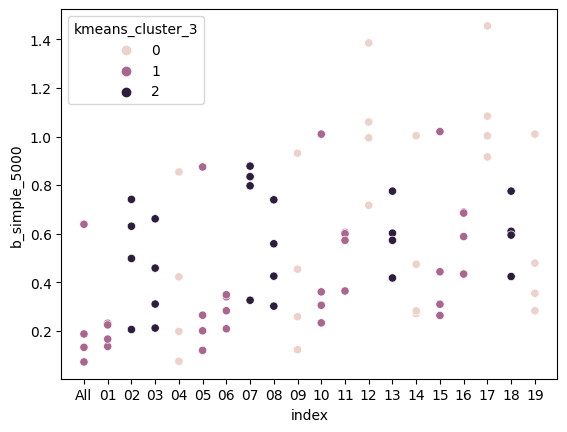

In [113]:
sns.scatterplot(data=pd_exp_decay_fits_simple_all, x='index', y='b_simple_5000', hue='kmeans_cluster_3')
sns.scatterplot(data=pd_exp_decay_fits_simple_all, x='index', y='b_simple_500', hue='kmeans_cluster_3', legend=False)
sns.scatterplot(data=pd_exp_decay_fits_simple_all, x='index', y='b_simple_100', hue='kmeans_cluster_3', legend=False)
sns.scatterplot(data=pd_exp_decay_fits_simple_all, x='index', y='b_simple_50', hue='kmeans_cluster_3', legend=False)

In [115]:
pd_exp_decay_fits_simple

,rgi_reg,year,a_simple,b_simple
0,All,50,103.363877,0.131692
1,01,50,100.865068,0.186778
2,02,50,101.857740,0.638656
3,03,50,103.169744,0.071614
4,04,50,99.787629,0.165685
...,...,...,...,...
75,15,5000,112.823848,0.609827
76,16,5000,229.377767,1.010184
77,17,5000,89.281170,0.282378
78,18,5000,133.864869,0.478691


ValueError: Could not interpret value `kmeans_cluster_3` for parameter `hue`

<AxesSubplot:xlabel='index', ylabel='a_simple_5000'>

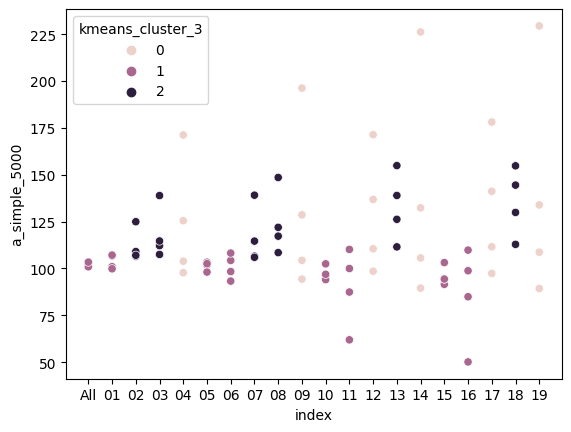

In [114]:
sns.scatterplot(data=pd_exp_decay_fits_simple_all, x='index', y='a_simple_5000', hue='kmeans_cluster_3')
sns.scatterplot(data=pd_exp_decay_fits_simple_all, x='index', y='a_simple_500', hue='kmeans_cluster_3', legend=False)
sns.scatterplot(data=pd_exp_decay_fits_simple_all, x='index', y='a_simple_100', hue='kmeans_cluster_3', legend=False)
sns.scatterplot(data=pd_exp_decay_fits_simple_all, x='index', y='a_simple_50', hue='kmeans_cluster_3', legend=False)

<AxesSubplot:xlabel='index', ylabel='a_simple_5000'>

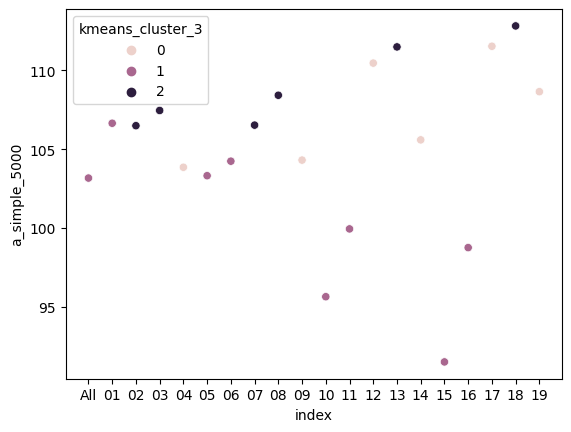

In [109]:
sns.scatterplot(data=pd_exp_decay_fits_simple_all, x='index', y='a_simple_5000', hue='kmeans_cluster_3')

KeyError: "None of [Index(['a_simple', 'b_simple'], dtype='object')] are in the [columns]"

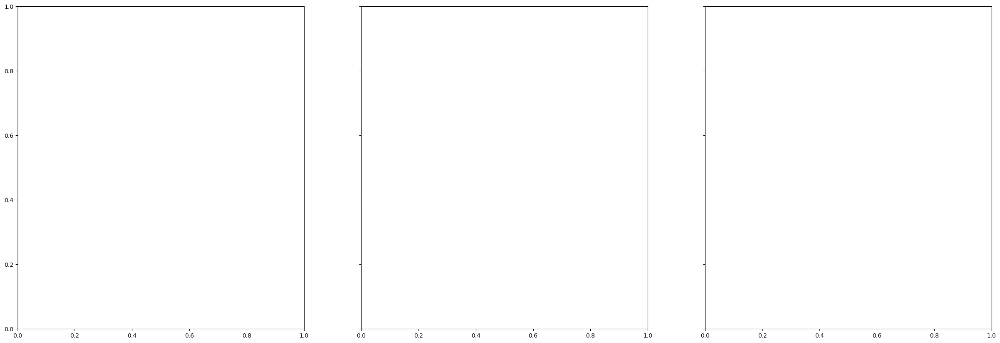

In [100]:
fig,axs = plt.subplots(1,3,figsize=(30,10), sharey=True)
for k in [0,1,2]:
    pd_sel = pd_exp_decay_fits_simple_all.loc[pd_exp_decay_fits_simple_all.kmeans_cluster_3 == k]
    ax = axs[k]
    for reg in pd_sel.index:
        pd_sel_reg = pd_sel.loc[pd_sel.index==reg]
        a,b = pd_sel_reg[['a_simple', 'b_simple']].values.squeeze()
        ax.plot(glob_temp, exponential_decay(glob_temp,a,b), label=reg)
        ax.legend()

## OLD

/tmp/ipykernel_59450/2576527745.py:9: UserWarning: The palette list has more values (10) than needed (4), which may not be intended.
  ax = sns.scatterplot(data=df, x='a_simple', y='b_simple', hue='kmeans_cluster_4', palette=sns.color_palette('tab10'), s=200)
/tmp/ipykernel_59450/2576527745.py:18: UserWarning: The palette list has more values (10) than needed (4), which may not be intended.
  ax=sns.scatterplot(data=df, x=r'V$_{eq,rel,ΔT=+1.1°C}$ [in %]', y=r'b_simple', s=200,


ValueError: Could not interpret value `ΔT(ΔV=0.5*V$_{eq,rel,ΔT=+1.1°C}$) [in °C]` for parameter `y`

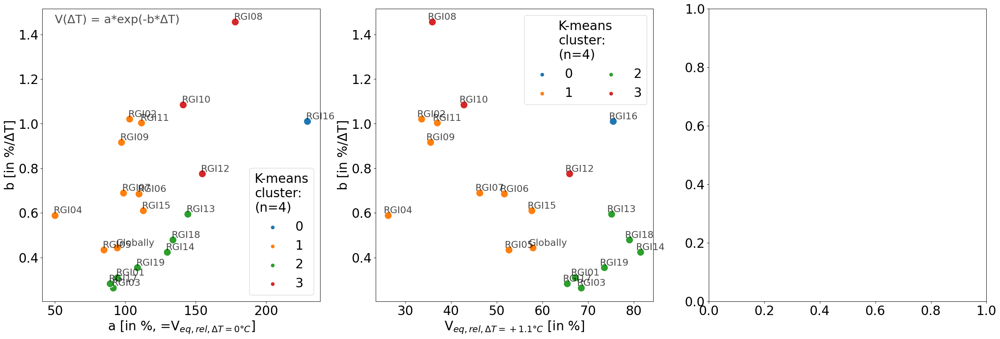

In [272]:

df = pd_exp_decay_fits_simple_5000_values
# from https://stackoverflow.com/questions/46027653/adding-labels-in-x-y-scatter-plot-with-seaborn
def plotlabel(xvar, yvar, label):
    ax.text(xvar-1, yvar+0.01, label, alpha=0.7, fontsize=18)
plt.rc('font', size=24)  

plt.figure(figsize=(32,10))
plt.subplot(131)
ax = sns.scatterplot(data=df, x='a_simple', y='b_simple', hue='kmeans_cluster_4', palette=sns.color_palette('tab10'), s=200)
df.apply(lambda x: plotlabel(x['a_simple'],  x['b_simple'], x['region']), axis=1)
ax.text(50,1.45, 'V(ΔT) = a*exp(-b*ΔT)', alpha=0.7, fontsize=22)
ax.set_ylabel('b [in %/ΔT]')
ax.set_xlabel(r'a [in %, =V$_{eq,rel,ΔT=0°C}$]')
plt.legend(title='K-means\ncluster:\n(n=4)', loc='lower right')

handles, labels = ax.get_legend_handles_labels()
plt.subplot(132)
ax=sns.scatterplot(data=df, x=r'V$_{eq,rel,ΔT=+1.1°C}$ [in %]', y=r'b_simple', s=200,
                   hue='kmeans_cluster_4', palette=sns.color_palette('tab10'))
ax.set_ylabel('b [in %/ΔT]')
df.apply(lambda x: plotlabel(x[r'V$_{eq,rel,ΔT=+1.1°C}$ [in %]'],  x['b_simple'], x['region']), axis=1)
plt.legend(title='K-means\ncluster:\n(n=4)', loc='upper right',ncol=2)


plt.subplot(133)
ax=sns.scatterplot(data=df, x=r'V$_{eq,rel,ΔT=+1.1°C}$ [in %]', y=r'ΔT(ΔV=0.5*V$_{eq,rel,ΔT=+1.1°C}$) [in °C]', s=200,
                   hue='kmeans_cluster_4', palette=sns.color_palette('tab10'))
df.apply(lambda x: plotlabel(x[r'V$_{eq,rel,ΔT=+1.1°C}$ [in %]'],  x[r'ΔT(ΔV=0.5*V$_{eq,rel,ΔT=+1.1°C}$) [in °C]'], x['region']), axis=1)
plt.legend(title='K-means\ncluster:\n(n=4)', loc='upper left')
plt.tight_layout()